# Active learning with Gaussian processes

In this example, we are going to use a ZARC element connected in series with an inductance to illustrate how active learning can be successfully applied (using the active learning Mackay and the determinant) in the field of EIS. More details can be found in: B. Py, A. Maradesa, F. Ciucci, Gaussian processes for the analysis of electrochemical impedance spectroscopy data: Prediction, filtering, and active learning, Electrochimica Acta. 439 (2023) 141688.

In [1]:
# import the libraries needed
import importlib
import GP_hilbert as gpf
importlib.reload(gpf)

import numpy as np
import matplotlib.pyplot as plt
from math import pi, log, sqrt, log10
from scipy.optimize import minimize, minimize_scalar
import seaborn as sns

In [2]:
# plot standards
plt.rc('font', family='serif', size=15)
plt.rc('text', usetex=True)
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)

## 1) Define the synthetic impedance experiment $Z_{\rm exp}(\omega)$

### 1.1) Define frequency range

In [3]:
N_freqs = 41
freq_vec = np.logspace(-2., 6., num=N_freqs, endpoint=True)
omega_vec = 2.*pi*freq_vec

In [4]:
np.sum(1/freq_vec)/60

4.516189744524694

### 1.2) Define the circuit parameters

In [5]:
R_ct = 50 # Ohm
R_inf = 10. # Ohm
phi = 0.8 # dimensionless
tau_0 = 1E-1 # s
L_0 = 5E-6 # F

### 1.3) Generate exact impedance $Z_{\rm exact}(\omega)$ 

In [6]:
T = tau_0**phi/R_ct
Z_exact = R_inf +  1j*(2*pi*freq_vec)*L_0 + 1./(1./R_ct+T*(1j*2.*pi*freq_vec)**phi)

### 1.4) Generate stochastic experiment with $Z_{\rm exp}(\omega) = Z_{\rm exact}(\omega)+ \sigma_n (\varepsilon_{\rm re} + i\varepsilon_{\rm im})$ with $\varepsilon_{\rm re}$ and $\varepsilon_{\rm im}$ are independent and identically distributed normals centered with 0 mean and standard deviation equal to 1

In [7]:
N_freqs_10ppd = 81
rng = np.random.seed(2421975) # seed the random number generator
sigma_n_exp = 0.3
noise_10_ppd = (sigma_n_exp)*(np.random.normal(0, 1, N_freqs_10ppd)+1j*np.random.normal(0, 1, N_freqs_10ppd))
Z_exp = Z_exact + noise_10_ppd[::2]

### 1.5) Plot

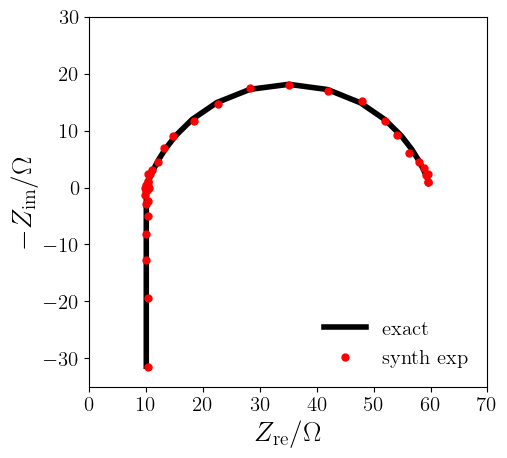

In [8]:
fig, ax = plt.subplots()
plt.plot(Z_exact.real, -Z_exact.imag, linewidth=4, color='black', label='exact')
plt.plot(Z_exp.real, -Z_exp.imag, 'o', markersize=5, color='red', label='synth exp')

plt.legend(frameon=False, fontsize=15, loc='lower right')
plt.axis('scaled')

plt.xlim(0, 70)
plt.ylim(-35, 30)
plt.xticks(range(0, 80, 10))
plt.yticks(range(-30, 40, 10))
plt.xlabel(r'$Z_{\rm re}/\Omega$', fontsize = 20)
plt.ylabel(r'$-Z_{\rm im}/\Omega$', fontsize = 20)
plt.show()

## 2) Set the kernel options 

In [9]:
ker_opts = {
    'sigma_DRT': 1.,
    'sigma_SB': 1.,
    'ell': 1.,
    'tau_max': 1e1,
    'DRT': True,
    'SB': False,
    'SB_ker_type': 'IQ',
}

# these values are nominal

In [10]:
ker_opts_0 = ker_opts.copy()

## 3) Fit imaginary part of the data

### 3.1) Initialize the hyperparameters

In [11]:
sigma_n = 0.8
sigma_DRT = 30
sigma_SB = 6E-1
ell = 15
sigma_L = 5E-6

### 3.2) Maximize the NMLL

In [12]:
theta_0 = np.array([sigma_n, sigma_DRT, sigma_SB, ell, sigma_L])
seq_theta = np.copy(theta_0)

def print_results(theta):
    global seq_theta
    seq_theta = np.vstack((seq_theta, theta))
    print('%.4E, %.4E, %.4E, %.4E, %.6E; evidence = %.8E'%(theta[0], theta[1], theta[2], theta[3], theta[4], gpf.NMLL_fct(theta, Z_exp.imag, omega_vec, ker_opts, 'im')))
    
res = minimize(gpf.NMLL_fct, theta_0, args=(Z_exp.imag, omega_vec, ker_opts, 'im'), method='Powell', \
               callback=print_results, options={'disp': True, 'xtol': 1E-6, 'ftol': 1E-6})

res = minimize(gpf.NMLL_fct, res.x, args=(Z_exp.imag, omega_vec, ker_opts, 'im'), method='Nelder-Mead', \
                callback=print_results, options={'disp': True, 'xatol': 1E-6, 'fatol': 1E-6})

theta_im = res.x
sigma_n, sigma_DRT, sigma_SB, ell, sigma_L = theta_im

-2.9661E-01, 2.8523E+01, 3.2176E+00, 1.7618E+01, 5.006572E-06; evidence = 4.36460054E+00
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06; evidence = 4.36459989E+00
Optimization terminated successfully.
         Current function value: 4.364600
         Iterations: 2
         Function evaluations: 226
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8352E+00, 2.0235E+01, 5.006572E-06

-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+01, 5.8359E+00, 2.0238E+01, 5.006572E-06; evidence = 4.36459989E+00
-2.9656E-01, 2.8523E+

In [13]:
# update the values of the kernel
# as the gpf functions simply copy ker_opts
ker_opts['sigma_SB'] = sigma_SB
ker_opts['ell'] = ell
ker_opts['sigma_DRT'] = sigma_DRT

In [14]:
importlib.reload(gpf)
theta_new, ker_opts_new = gpf.compute_opt_theta(theta_im, ker_opts, freq_vec, Z_exp.imag, type_data = 'im')

-2.9656E-01, 2.8523E+01, 8.4535E+00, 2.2855E+01, 5.006572E-06; evidence = 4.36459989E+00
Optimization terminated successfully.
         Current function value: 4.364600
         Iterations: 1
         Function evaluations: 140


### 3.3) Check if the results are reasonable

#### 3.3.1) Check $L_0$

In [15]:
K_im = gpf.mat_K(omega_vec, omega_vec, ker_opts, 'im')
Sigma = (sigma_n**2)*np.eye(N_freqs)
K_full = K_im + Sigma + (sigma_L**2)*np.outer(omega_vec, omega_vec)
K_full_reg = K_im + Sigma

# Cholesky-decompose K_full
# begin FC - added 
if not gpf.is_PD(K_full_reg):
    K_full_reg = gpf.nearest_PD(K_full_reg)

# end FC - added

# inverse of K_im
L = np.linalg.cholesky(K_full_reg)
inv_L = np.linalg.inv(L)
inv_K_full_reg = np.dot(inv_L.T, inv_L)

num_L_0 = omega_vec@(inv_K_full_reg@Z_exp.imag)
den_L_0 = (sigma_L**-2) + omega_vec@(inv_K_full_reg@omega_vec)
L_0_est = num_L_0/den_L_0

print('L_0_est = %.6E F vs. L_0 = %.6E F'%(L_0_est, L_0))

L_0_est = 5.006438E-06 F vs. L_0 = 5.000000E-06 F


#### 3.3.2) Check the fit of $\Im(Z_{\rm exp})$ against the GP

##### 3.3.2.1) Run the GP regression

In [16]:
# Cholesky-decompose K_full
# begin FC - added 
if not gpf.is_PD(K_full):
    K_full = gpf.nearest_PD(K_full)

# end FC - added 

# cholesky factorization
L = np.linalg.cholesky(K_full)

# covariance matrix
inv_L = np.linalg.inv(L)
inv_K_full = np.dot(inv_L.T, inv_L)

N_star_freqs = N_freqs
freq_star_vec = np.copy(freq_vec) #np.logspace(-4., 4., num=N_star_freqs, endpoint=True)
omega_star_vec = 2.*pi*freq_star_vec

mu_star_vec = np.zeros_like(omega_star_vec)
sigma_star_vec = np.zeros_like(omega_star_vec)

for index, omega_star in enumerate(omega_star_vec):
    
    #print('iter = ', index+1, '/', N_star_freqs)
    omega_star_np = np.array([omega_star])
    k_star_star = gpf.mat_K(omega_star_np, omega_star_np, ker_opts, 'im').flatten() + (sigma_L**2)*omega_star_np**2
    k_star = gpf.mat_K(omega_star_np, omega_vec, ker_opts, 'im').flatten() + (sigma_L**2)*omega_vec*omega_star_np
    
    mu_star_vec[index] = k_star@(inv_K_full@Z_exp.imag)
    sigma_star_vec[index] = np.sqrt(k_star_star - k_star@(inv_K_full@k_star))

##### 3.3.2.2) Plot the outcome of the GP regression

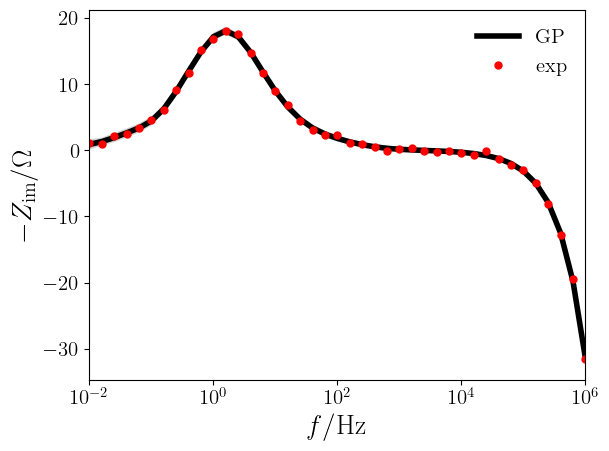

In [17]:
plt.fill_between(freq_star_vec, -mu_star_vec-3*sigma_star_vec, -mu_star_vec+3*sigma_star_vec,  facecolor='lightgrey')
plt.fill_between(freq_star_vec, -mu_star_vec-2*sigma_star_vec, -mu_star_vec+2*sigma_star_vec,  facecolor='silver')
plt.fill_between(freq_star_vec, -mu_star_vec-sigma_star_vec, -mu_star_vec+sigma_star_vec,  facecolor='grey')
plt.semilogx(freq_star_vec, -mu_star_vec, linewidth=4, color='black', label='GP')
plt.semilogx(freq_vec,  -Z_exp.imag, 'o', markersize=5, color='red', label='exp')
plt.xlim(1E-2, 1E6)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'$-Z_{\rm im}/\Omega$', fontsize=20)
plt.legend(frameon=False, fontsize = 15)
plt.show()

## 4) Fit real part of the data

### 4.1) Initialize the hyperparameters

In [18]:
sigma_n = 0.8
sigma_DRT = 30
sigma_SB = 6E-7
ell = 3
sigma_R = 10

### 4.2) Maximize the NMLL

In [19]:
theta_0 = np.array([sigma_n, sigma_DRT, sigma_SB, ell, sigma_R])

seq_theta = np.copy(theta_0)
def print_results(theta):
    global seq_theta
    seq_theta = np.vstack((seq_theta, theta))
    print('%.4E, %.4E, %.4E, %.4E, %.6E; evidence = %.8E'%(theta[0], theta[1], theta[2], theta[3], theta[4], gpf.NMLL_fct(theta, Z_exp.real, omega_vec, ker_opts, 're')))
    
res = minimize(gpf.NMLL_fct, theta_0, args=(Z_exp.real, omega_vec, ker_opts, 're'), method='Powell', \
               callback=print_results, options={'disp': True, 'xtol': 1E-6, 'ftol': 1E-6})

res = minimize(gpf.NMLL_fct, res.x, args=(Z_exp.imag, omega_vec, ker_opts, 'im'), method='Nelder-Mead', \
               callback=print_results, options={'disp': True, 'xatol': 1E-6, 'fatol': 1E-6})

theta_re = res.x
sigma_n, sigma_DRT, sigma_SB, ell, sigma_R = theta_re

-1.9806E-01, 2.7813E+01, 2.6176E+00, 5.6176E+00, 1.013681E+01; evidence = -5.01600536E+00
-1.9813E-01, 2.7813E+01, 5.2352E+00, 8.2352E+00, 1.013679E+01; evidence = -5.01600815E+00
Optimization terminated successfully.
         Current function value: -5.016008
         Iterations: 2
         Function evaluations: 202
-2.0803E-01, 2.7813E+01, 5.2352E+00, 8.2352E+00, 1.013679E+01; evidence = -4.95322272E+00
-2.0803E-01, 2.7813E+01, 5.2352E+00, 8.2352E+00, 1.013679E+01; evidence = -4.95322272E+00
-2.0803E-01, 2.7813E+01, 5.2352E+00, 8.2352E+00, 1.013679E+01; evidence = -4.95322272E+00
-2.0085E-01, 2.7727E+01, 5.4117E+00, 8.2493E+00, 1.003745E+01; evidence = -5.01079606E+00
-2.0112E-01, 2.7719E+01, 5.2985E+00, 8.2507E+00, 1.002752E+01; evidence = -5.00971404E+00
-2.0112E-01, 2.7719E+01, 5.2985E+00, 8.2507E+00, 1.002752E+01; evidence = -5.00971404E+00
-2.0112E-01, 2.7719E+01, 5.2985E+00, 8.2507E+00, 1.002752E+01; evidence = -5.00971404E+00
-2.0112E-01, 2.7719E+01, 5.2985E+00, 8.2507E+00, 1.

-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-0

-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-01, 2.7741E+01, 5.2975E+00, 8.2618E+00, 1.000621E+01; evidence = -5.00975145E+00
-2.0111E-0

C:\Users\user\AppData\Local\Temp\ipykernel_23324\1333085942.py:12: RuntimeWarning: Maximum number of function evaluations has been exceeded.
  res = minimize(gpf.NMLL_fct, res.x, args=(Z_exp.imag, omega_vec, ker_opts, 'im'), method='Nelder-Mead', \


In [20]:
# update the values of the kernel
# as the gpf functions simply copy ker_opts
ker_opts['sigma_SB'] = sigma_SB
ker_opts['ell'] = ell
ker_opts['sigma_DRT'] = sigma_DRT

### 4.3) Check if the results are reasonable

#### 4.3.1) Check $R_\infty$

In [21]:
K_re = gpf.mat_K(omega_vec, omega_vec, ker_opts, 're')
Sigma = (sigma_n**2)*np.eye(N_freqs)
K_full = K_re + Sigma + (sigma_R**2)*np.ones_like(Sigma)
K_full_reg = K_re + Sigma

# Cholesky-decompose K_full
# begin FC - added 
if not gpf.is_PD(K_full_reg):
    K_full_reg = gpf.nearest_PD(K_full_reg)

# end FC - added

# inverse of K_re
L = np.linalg.cholesky(K_full_reg)
inv_L = np.linalg.inv(L)
inv_K_full_reg = np.dot(inv_L.T, inv_L)

num_R_inf = np.ones(N_freqs)@(inv_K_full_reg@Z_exp.real)
den_R_inf = (sigma_R**-2) + np.ones(N_freqs)@(inv_K_full_reg@np.ones(N_freqs))
R_inf_est = num_R_inf/den_R_inf

print('R_inf_est = %.6E Ohm vs. R_inf = %.6E Ohm'%(R_inf_est, R_inf))

R_inf_est = 1.013604E+01 Ohm vs. R_inf = 1.000000E+01 Ohm


#### 4.3.2) Check the fit of $\Re(Z_{\rm exp})$ against the GP

##### 4.3.2.1) Run the GP regression

In [22]:
# Cholesky-decompose K_full
# begin FC - added 
if not gpf.is_PD(K_full):
    K_full = gpf.nearest_PD(K_full)

# end FC - added 

# cholesky factorization
L = np.linalg.cholesky(K_full)

# covariance matrix
inv_L = np.linalg.inv(L)
inv_K_full = np.dot(inv_L.T, inv_L)

N_star_freqs = N_freqs
freq_star_vec = np.copy(freq_vec) #np.logspace(-4., 4., num=N_star_freqs, endpoint=True)
omega_star_vec = 2.*pi*freq_star_vec

mu_star_vec = np.zeros_like(omega_star_vec)
sigma_star_vec = np.zeros_like(omega_star_vec)

for index, omega_star in enumerate(omega_star_vec):
    #print('iter = ', index+1, '/', N_star_freqs)
    omega_star_np = np.array([omega_star])
    
    k_star_star = gpf.mat_K(omega_star_np, omega_star_np, ker_opts, 're').flatten() + (sigma_R**2)
    k_star = gpf.mat_K(omega_star_np, omega_vec, ker_opts, 're').flatten() + (sigma_R**2)*np.ones(N_freqs)

    mu_star_vec[index] = k_star@(inv_K_full@Z_exp.real)
    sigma_star_vec[index] = np.sqrt(k_star_star - k_star@(inv_K_full@k_star))

##### 4.3.2.2) Plot the outcome of the GP regression

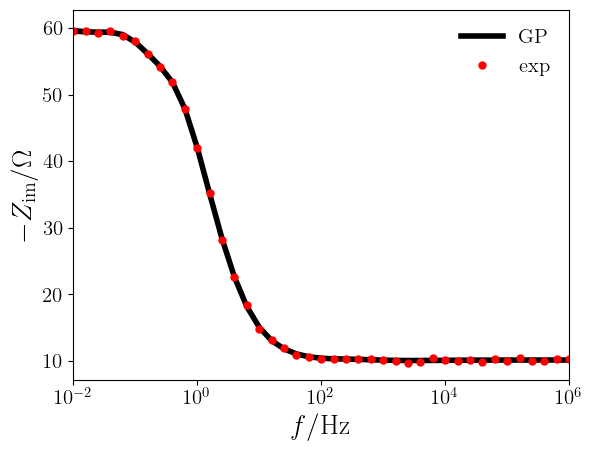

In [23]:
plt.fill_between(freq_star_vec, mu_star_vec-3*sigma_star_vec, mu_star_vec+3*sigma_star_vec,  facecolor='lightgrey')
plt.fill_between(freq_star_vec, mu_star_vec-2*sigma_star_vec, mu_star_vec+2*sigma_star_vec,  facecolor='silver')
plt.fill_between(freq_star_vec, mu_star_vec-sigma_star_vec, mu_star_vec+sigma_star_vec,  facecolor='grey')
plt.semilogx(freq_star_vec, mu_star_vec, linewidth=4, color='black', label='GP')
plt.semilogx(freq_vec,  Z_exp.real, 'o', markersize=5, color='red', label='exp')
plt.xlim(1E-2, 1E6)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'$-Z_{\rm im}/\Omega$', fontsize=20)
plt.legend(frameon=False, fontsize = 15)
plt.show()

## 5) Bundle things together

In [26]:
Z_exp_all = np.zeros(2*N_freqs)
Z_exp_all[:N_freqs] = Z_exp.real
Z_exp_all[N_freqs:] = Z_exp.imag

### 5.1) Initialize the hyperparameters

In [27]:
sigma_n, sigma_DRT, sigma_SB, ell = 0.5*(abs(theta_re[:4])+abs(theta_im[:4]))
sigma_R = abs(theta_re[-1])
sigma_L = abs(theta_im[-1])

In [28]:
theta_0 = [sigma_n, sigma_DRT, sigma_SB, ell, sigma_R, sigma_L]
seq_theta = np.copy(theta_0)

def print_results(theta):
    global seq_theta
    seq_theta = np.vstack((seq_theta, theta))
    print('%.4E, %.4E, %.4E, %.4E, %.4E, %.6E; evidence = %.8E'%(theta[0], theta[1], theta[2], theta[3], theta[4], theta[5], gpf.NMLL_fct(theta, Z_exp_all, omega_vec, ker_opts, 'all')))
    
res = minimize(gpf.NMLL_fct, theta_0, args=(Z_exp_all, omega_vec, ker_opts, 'all'), method='Powell', \
               callback=print_results, options={'disp': True, 'xtol': 1E-6, 'ftol': 1E-6})
#res = minimize(gpf.NMLL_fct, res.x, args=(Z_exp.imag, omega_vec, ker_opts, 'im'), method='Nelder-Mead', \
               #callback=print_results, options={'disp': True, 'xatol': 1E-6, 'fatol': 1E-6})

theta = res.x
sigma_n, sigma_DRT, sigma_SB, ell, sigma_R, sigma_L = theta

2.8662E-01, 2.6553E+01, 8.1843E+00, 1.6867E+01, 1.0121E+01, 5.005731E-06; evidence = -1.70689048E+01
2.8638E-01, 2.6552E+01, 1.0786E+01, 1.9469E+01, 1.0121E+01, 5.005726E-06; evidence = -1.70689500E+01
Optimization terminated successfully.
         Current function value: -17.068950
         Iterations: 2
         Function evaluations: 249


In [29]:
# update the values of the kernel
# as the gpf functions simply copy ker_opts
ker_opts['sigma_SB'] = sigma_SB
ker_opts['ell'] = ell
ker_opts['sigma_DRT'] = sigma_DRT

### 5.2) Check if the results are reasonable

compute blocks

In [30]:
K_re = gpf.mat_K(omega_vec, omega_vec, ker_opts, 're')
K_im = gpf.mat_K(omega_vec, omega_vec, ker_opts, 'im')
K_re_im = gpf.mat_K(omega_vec, omega_vec, ker_opts, 're-im')
K_im_re = gpf.mat_K(omega_vec, omega_vec, ker_opts, 'im-re')

assemble full matrix

In [31]:
Sigma = sigma_n**2*np.eye(N_freqs)
K_full = np.zeros((2*N_freqs, 2*N_freqs))
K_full[:N_freqs, :N_freqs] = K_re + Sigma + (sigma_R**2)*np.ones(N_freqs)
K_full[:N_freqs, N_freqs:] = K_re_im
K_full[N_freqs:, :N_freqs] = K_im_re
K_full[N_freqs:, N_freqs:] = K_im + Sigma + (sigma_L**2)*np.outer(omega_vec, omega_vec)

ensure the full matrix is positive definite

In [32]:
if not gpf.is_PD(K_full):
    K_full = gpf.nearest_PD(K_full)

# cholesky factorization
L = np.linalg.cholesky(K_full)

compute cholesky

In [33]:
# covariance matrix
inv_L = np.linalg.inv(L)
inv_K_full = np.dot(inv_L.T, inv_L)

#### 5.2.1) Run GP regression

In [34]:
N_star_freqs = N_freqs
freq_star_vec = np.copy(freq_vec)
omega_star_vec = 2.*pi*freq_star_vec

mu_re_star_vec = np.zeros_like(omega_star_vec)
sigma_re_star_vec = np.zeros_like(omega_star_vec)

mu_im_star_vec = np.zeros_like(omega_star_vec)
sigma_im_star_vec = np.zeros_like(omega_star_vec)


for index, omega_star in enumerate(omega_star_vec):
    
    #print('iter = ', index+1, '/', N_star_freqs)
    omega_star_np = np.array([omega_star])
    
    # k_star_star
    k_star_star_re = gpf.mat_K(omega_star_np, omega_star_np, ker_opts, 're').flatten() + (sigma_R**2)
    k_star_star_im = gpf.mat_K(omega_star_np, omega_star_np, ker_opts, 'im').flatten() + (sigma_L**2)*omega_star_np**2
    
    # k_star    
    k_star_re_re = gpf.mat_K(omega_star_np, omega_vec, ker_opts, 're').flatten() + (sigma_R**2)*np.ones(N_freqs)
    k_star_re_im = gpf.mat_K(omega_star_np, omega_vec, ker_opts, 're-im').flatten()
    k_star_im_re = gpf.mat_K(omega_star_np, omega_vec, ker_opts, 'im-re').flatten()
    k_star_im_im = gpf.mat_K(omega_star_np, omega_vec, ker_opts, 'im').flatten() + (sigma_L**2)*omega_vec*omega_star_np

    # k_star_re
    k_star_re = np.zeros(2*N_freqs)
    k_star_re[:N_freqs] = k_star_re_re
    k_star_re[N_freqs:] = k_star_re_im
    
    # k_star_im
    k_star_im = np.zeros(2*N_freqs)
    k_star_im[:N_freqs] = k_star_im_re
    k_star_im[N_freqs:] = k_star_im_im
    
    mu_re_star_vec[index] = k_star_re@(inv_K_full@Z_exp_all)
    sigma_re_star_vec[index] = np.sqrt(k_star_star_re - k_star_re@(inv_K_full@k_star_re))
    
    mu_im_star_vec[index] = k_star_im@(inv_K_full@Z_exp_all)
    sigma_im_star_vec[index] = np.sqrt(k_star_star_im - k_star_im@(inv_K_full@k_star_im))

##### 5.2.1.1) Plot the regressed imaginary part

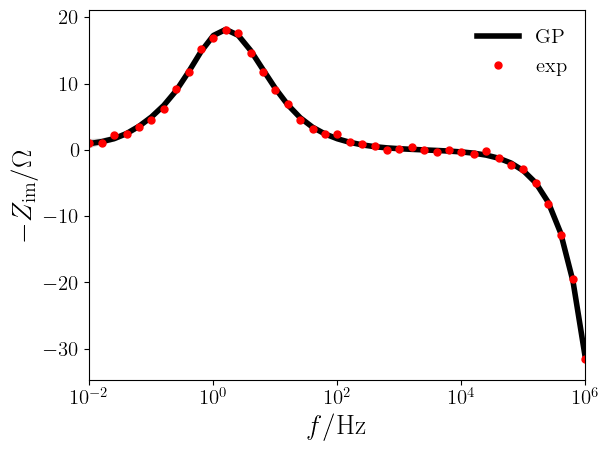

In [35]:
plt.fill_between(freq_star_vec, -mu_im_star_vec-3*sigma_im_star_vec, -mu_im_star_vec+3*sigma_im_star_vec,  facecolor='lightgrey')
plt.fill_between(freq_star_vec, -mu_im_star_vec-2*sigma_im_star_vec, -mu_im_star_vec+2*sigma_im_star_vec,  facecolor='silver')
plt.fill_between(freq_star_vec, -mu_im_star_vec-sigma_im_star_vec, -mu_im_star_vec+sigma_im_star_vec,  facecolor='grey')
plt.semilogx(freq_star_vec, -mu_im_star_vec, linewidth=4, color='black', label='GP')
plt.semilogx(freq_vec,  -Z_exp.imag, 'o', markersize=5, color='red', label='exp')
plt.xlim(1E-2, 1E6)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'$-Z_{\rm im}/\Omega$', fontsize=20)
plt.legend(frameon=False, fontsize = 15)
plt.show()

##### 5.2.1.2) Plot the regressed real part

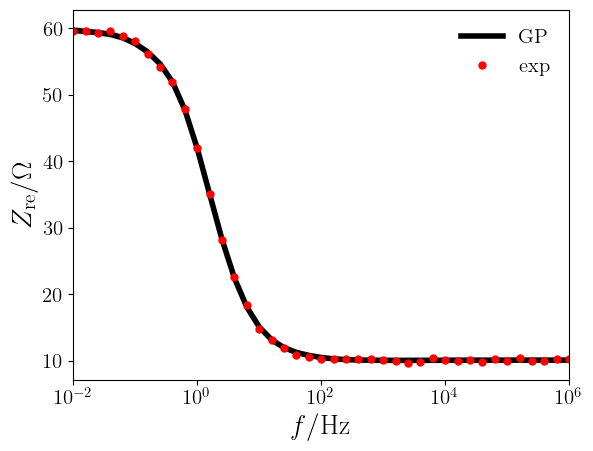

In [36]:
plt.fill_between(freq_star_vec, mu_re_star_vec-3*sigma_re_star_vec, mu_re_star_vec+3*sigma_re_star_vec,  facecolor='lightgrey')
plt.fill_between(freq_star_vec, mu_re_star_vec-2*sigma_re_star_vec, mu_re_star_vec+2*sigma_re_star_vec,  facecolor='silver')
plt.fill_between(freq_star_vec, mu_re_star_vec-sigma_re_star_vec, mu_re_star_vec+sigma_re_star_vec,  facecolor='grey')
plt.semilogx(freq_star_vec, mu_re_star_vec, linewidth=4, color='black', label='GP')
plt.semilogx(freq_vec,  Z_exp.real, 'o', markersize=5, color='red', label='exp')
plt.xlim(1E-2, 1E6)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'$Z_{\rm re}/\Omega$', fontsize=20)
plt.legend(frameon=False, fontsize = 15)
plt.show()

##### 5.2.1.3) Imaginary difference plot

In [37]:
diff_im = -mu_im_star_vec+Z_exact.imag
sigma_diff_im = sigma_im_star_vec

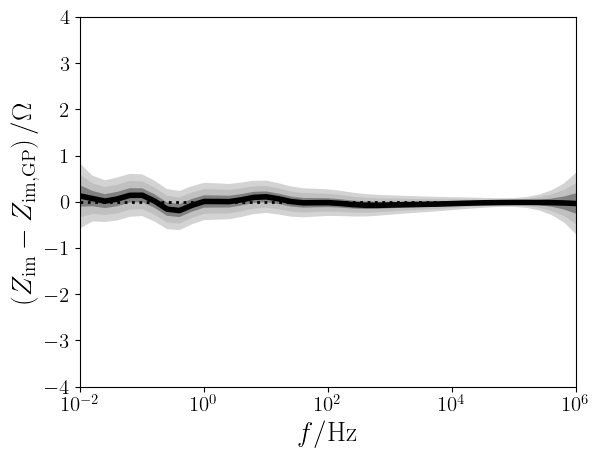

In [38]:
plt.fill_between(freq_star_vec, diff_im-3*sigma_diff_im, diff_im+3*sigma_diff_im,  facecolor='lightgrey')
plt.fill_between(freq_star_vec, diff_im-2*sigma_diff_im, diff_im+2*sigma_diff_im,  facecolor='silver')
plt.fill_between(freq_star_vec, diff_im-sigma_diff_im, diff_im+sigma_diff_im,  facecolor='grey')
plt.semilogx(freq_star_vec, diff_im, linewidth=4, color='black', label='GP')
plt.semilogx(freq_star_vec, np.zeros_like(freq_star_vec), linewidth=2, color='black', ls = ':')
plt.xlim(1E-2, 1E6)
plt.ylim(-4, 4)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'$\left(Z_{\rm im}-Z_{\rm im, GP}\right)/\Omega$', fontsize=20)
plt.show()

##### 5.2.1.4) Real difference plot

In [39]:
diff_re = -mu_re_star_vec+Z_exact.real
sigma_diff_re = sigma_re_star_vec

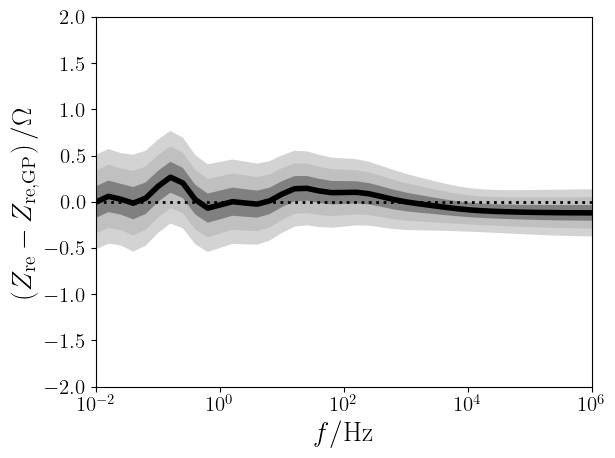

In [40]:
plt.fill_between(freq_star_vec, diff_re-3*sigma_diff_re, diff_re+3*sigma_diff_re,  facecolor='lightgrey')
plt.fill_between(freq_star_vec, diff_re-2*sigma_diff_re, diff_re+2*sigma_diff_re,  facecolor='silver')
plt.fill_between(freq_star_vec, diff_re-sigma_diff_re, diff_re+sigma_diff_re,  facecolor='grey')
plt.semilogx(freq_star_vec, diff_re, linewidth=4, color='black', label='GP')
plt.semilogx(freq_star_vec, np.zeros_like(freq_star_vec), linewidth=2, color='black', ls = ':')
plt.xlim(1E-2, 1E6)
plt.ylim(-2, 2)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'$\left(Z_{\rm re}-Z_{\rm re, GP}\right)/\Omega$', fontsize=20)
plt.show()

## Adaptive learning

In [41]:
importlib.reload(gpf)

ppd = 40
N_virt_freqs = 8*ppd+1
freq_virt_vec = np.logspace(-2., 6., num=N_virt_freqs, endpoint=True)

theta_N = np.copy(theta)
ker_opts_N = ker_opts.copy()
freq_vec_N = np.copy(freq_vec)
Z_exp_N = np.copy(Z_exp)
Z_exp_all_N = np.copy(Z_exp_all)
inv_K_full_N = np.copy(inv_K_full)

T_N = np.sum(1/freq_vec_N) 
T_10_ppd = np.sum(1/np.logspace(-2., 6., num=81, endpoint=True))

mu_re_virt_vec_0, mu_im_virt_vec_0, sigma_re_virt_vec_0, sigma_im_virt_vec_0 = \
    gpf.compute_mu_sigma(theta, ker_opts, inv_K_full, freq_virt_vec, freq_vec, Z_exp_all)

In [42]:
freq_vec_10ppd = np.logspace(-2., 6., num=N_freqs_10ppd, endpoint=True)
inv_K_full_10ppd = gpf.compute_K_inv(theta, ker_opts, freq_vec_10ppd)

Z_exact_10ppd = R_inf + 1j*(2*pi*freq_vec_10ppd)*L_0 + 1./(1./R_ct+T*(1j*2.*pi*freq_vec_10ppd)**phi)
Z_exp_10ppd = Z_exact_10ppd + noise_10_ppd

Z_exp_all_10ppd = np.zeros(2*N_freqs_10ppd)
Z_exp_all_10ppd[:N_freqs_10ppd] = Z_exp_10ppd.real
Z_exp_all_10ppd[N_freqs_10ppd:] = Z_exp_10ppd.imag

mu_re_virt_vec_10ppd, mu_im_virt_vec_10ppd, sigma_re_virt_vec_10ppd, sigma_im_virt_vec_10ppd = \
    gpf.compute_mu_sigma(theta, ker_opts, inv_K_full_10ppd, freq_virt_vec, freq_vec_10ppd, Z_exp_all_10ppd)

In [43]:
iter_max = 100
freq_new_vec = np.zeros(iter_max)
Z_exp_new_vec = np.zeros(iter_max, dtype=np.complex_)
theta_new_vec = np.zeros((iter_max, 6))

mu_re_virt_vec_new_vec = np.zeros((iter_max, N_virt_freqs))
mu_im_virt_vec_new_vec = np.zeros((iter_max, N_virt_freqs))
sigma_re_virt_vec_new_vec = np.zeros((iter_max, N_virt_freqs))
sigma_im_virt_vec_new_vec = np.zeros((iter_max, N_virt_freqs))

In [44]:
import GP_hilbert as gpf
importlib.reload(gpf)

<module 'GP_hilbert' from 'C:\\Users\\user\\ATHIS_ONE\\GP-HT-master\\tutorials\\GP_hilbert.py'>

### show ALC results

In [45]:
# integration over a coarse log-spaced mesh
log10_freq_vec_int = np.linspace(-2., 6., num=81, endpoint=True)
ALC = np.zeros_like(log10_freq_vec_int)

In [46]:
gpf.compute_ALC(-1, theta, ker_opts, freq_vec, log10_freq_vec_int)

0.0019000270523478473

In [47]:
# run ALC
for iter, log10_freq in enumerate(log10_freq_vec_int):
    ALC[iter] = gpf.compute_ALC(log10_freq, theta, ker_opts, freq_vec, log10_freq_vec_int)

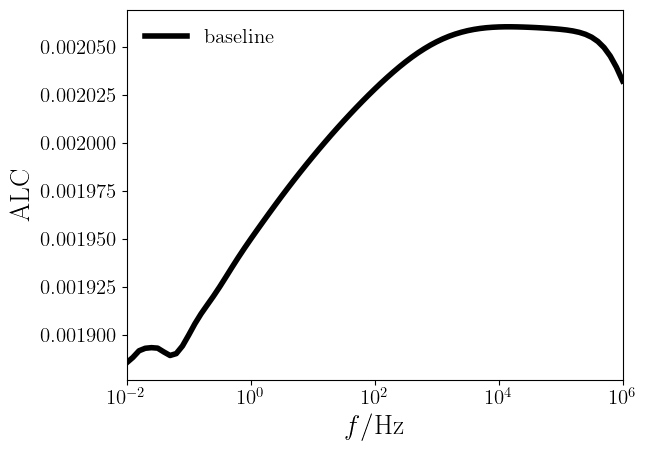

In [48]:
# plot ALC
plt.semilogx(10**log10_freq_vec_int, ALC, linewidth=4, color='black', linestyle = '-', label = 'baseline')
plt.xlim(1E-2, 1E6)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'ALC', fontsize=20)
plt.legend(frameon=False, fontsize = 15)
plt.show()

### run ALC optimization

iter =  1 / 100 ; freq_new = 5.2483E-02
2.8628E-01, 2.6493E+01, 1.3403E+01, 2.2086E+01, 1.0121E+01, 5.005726E-06; evidence = -1.83382415E+01
2.8627E-01, 2.6493E+01, 1.6021E+01, 2.4704E+01, 1.0121E+01, 5.005736E-06; evidence = -1.83382415E+01
Optimization terminated successfully.
         Current function value: -18.338242
         Iterations: 2
         Function evaluations: 289


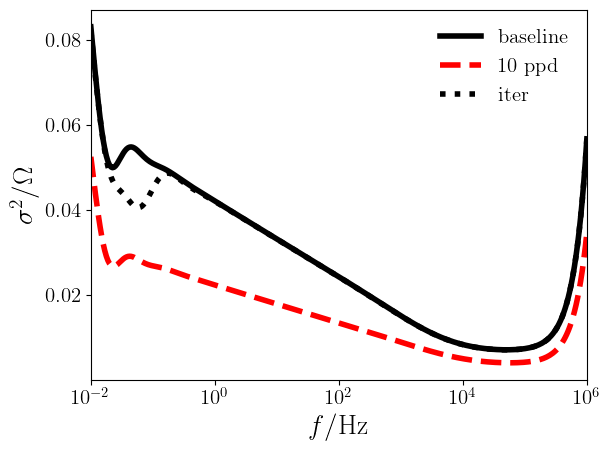

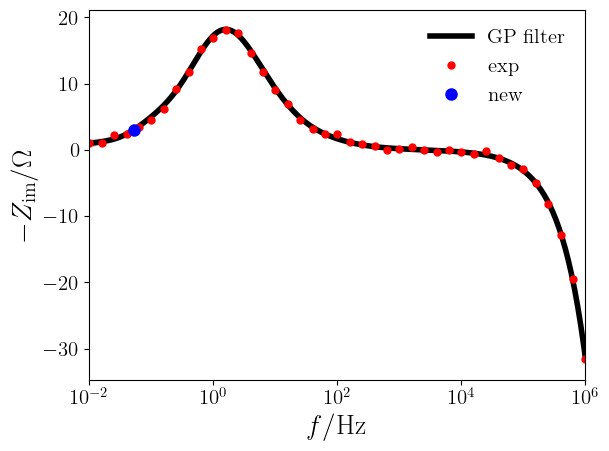

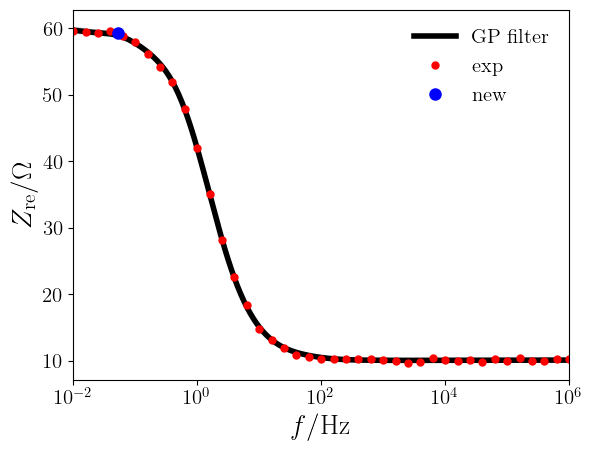

iter =  2 / 100 ; freq_new = 2.0925E-01


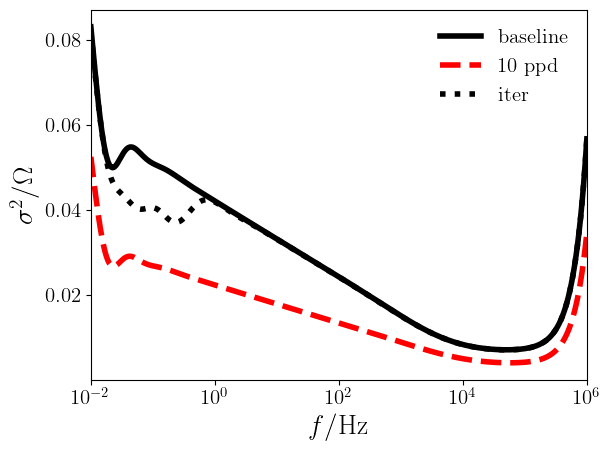

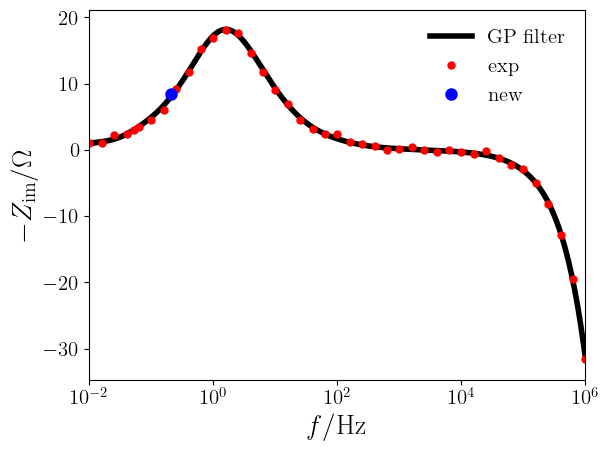

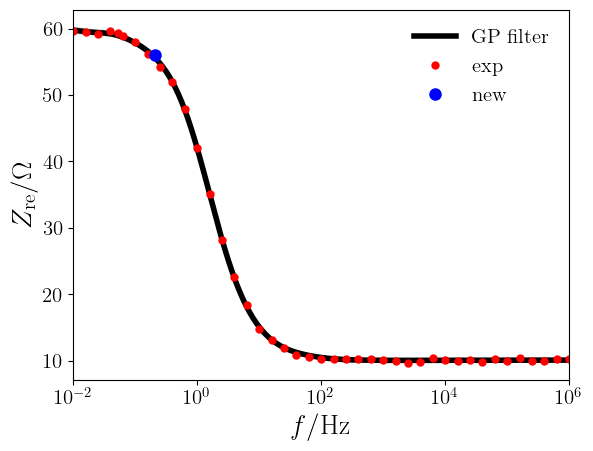

iter =  3 / 100 ; freq_new = 9.0022E-01


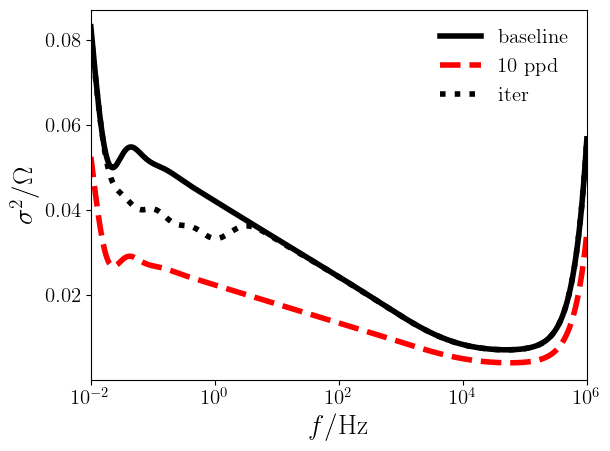

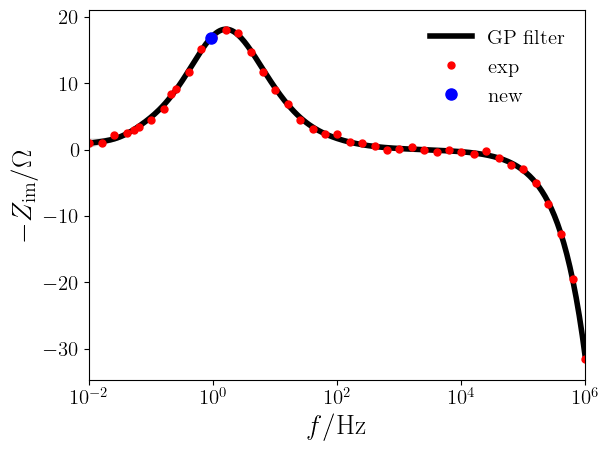

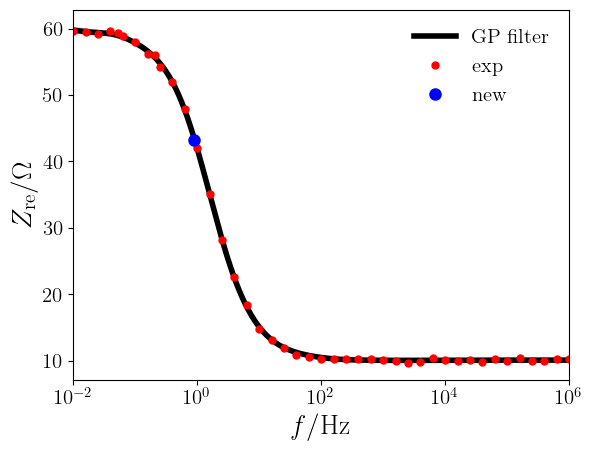

iter =  4 / 100 ; freq_new = 3.9302E+00


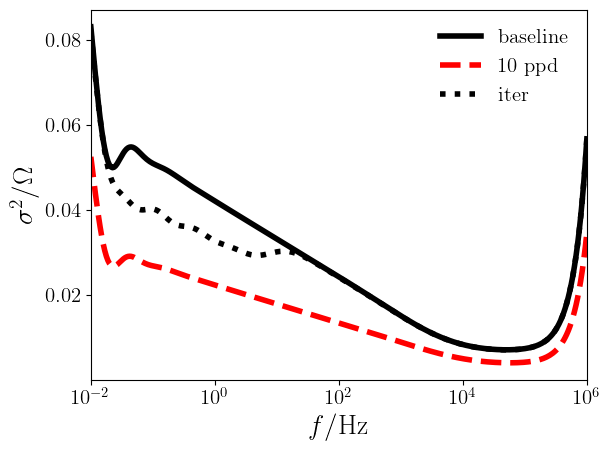

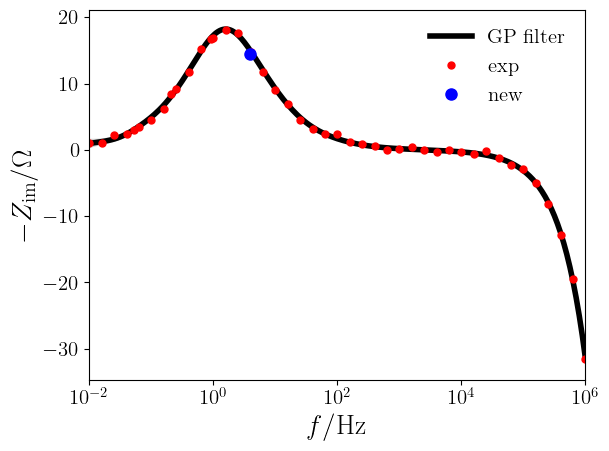

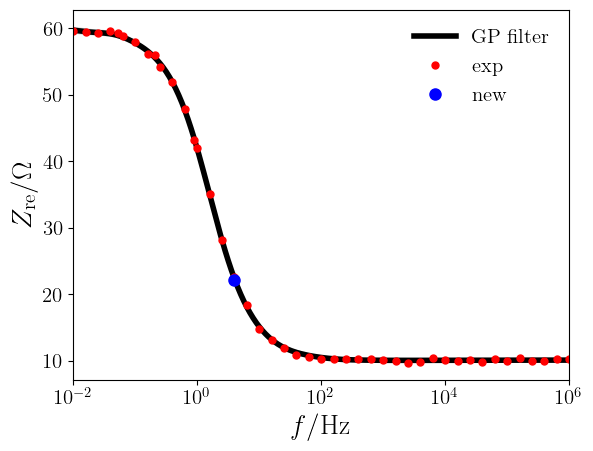

iter =  5 / 100 ; freq_new = 1.0665E-02


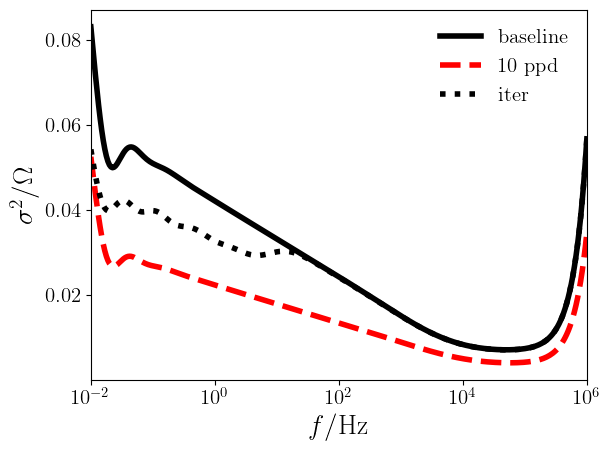

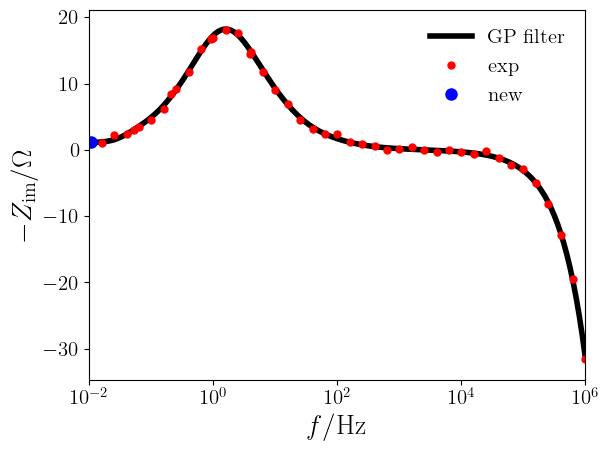

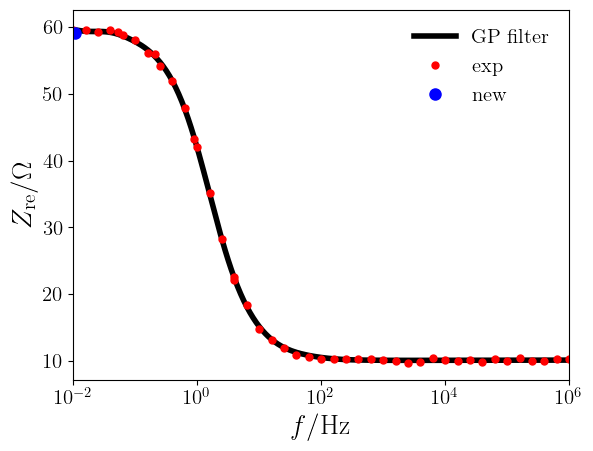

iter =  6 / 100 ; freq_new = 1.5017E+01


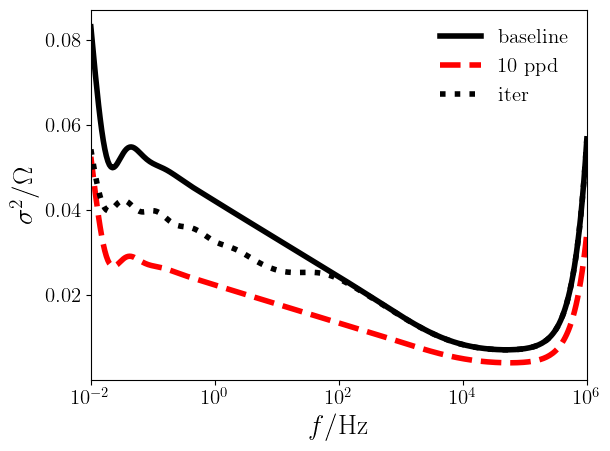

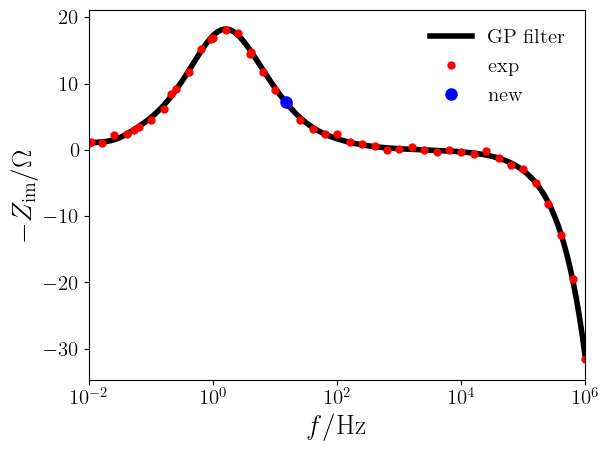

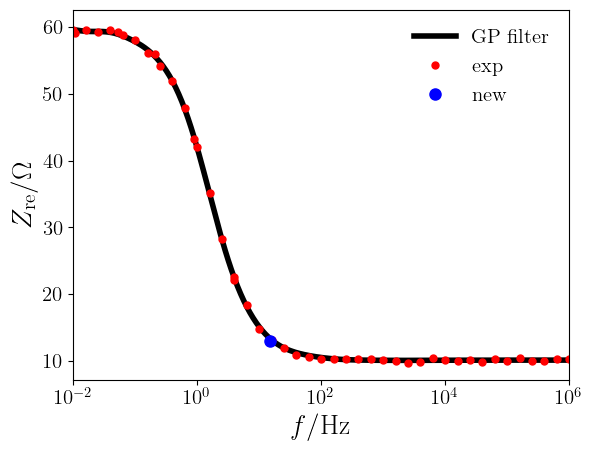

iter =  7 / 100 ; freq_new = 2.8388E-02


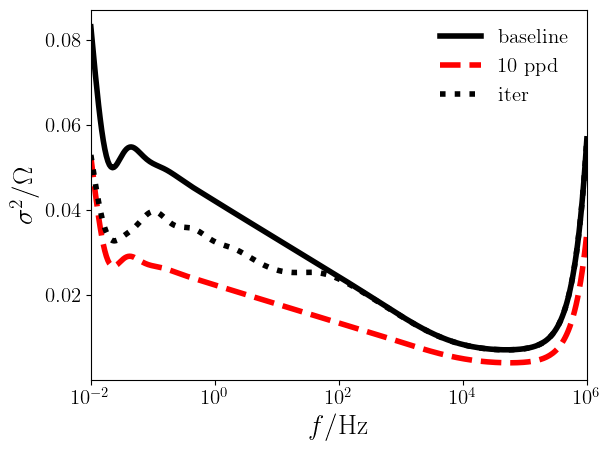

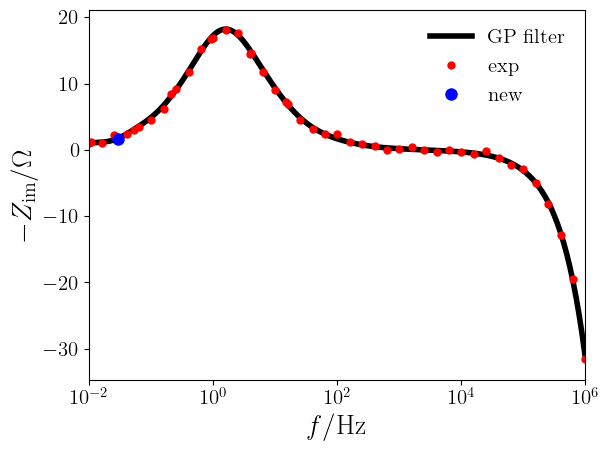

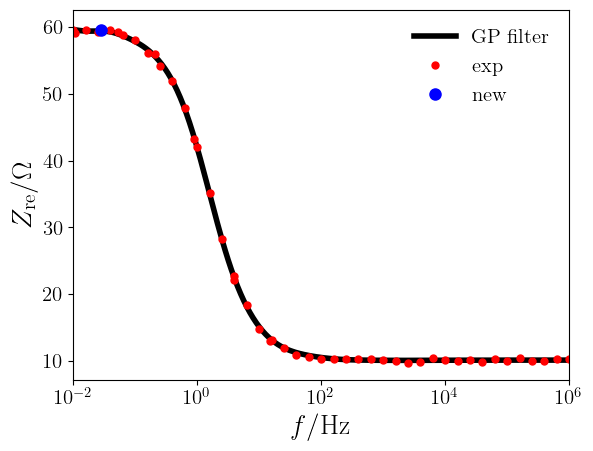

iter =  8 / 100 ; freq_new = 1.0943E-01


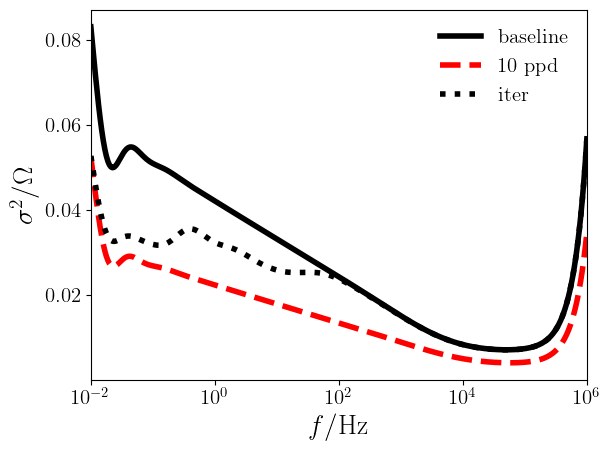

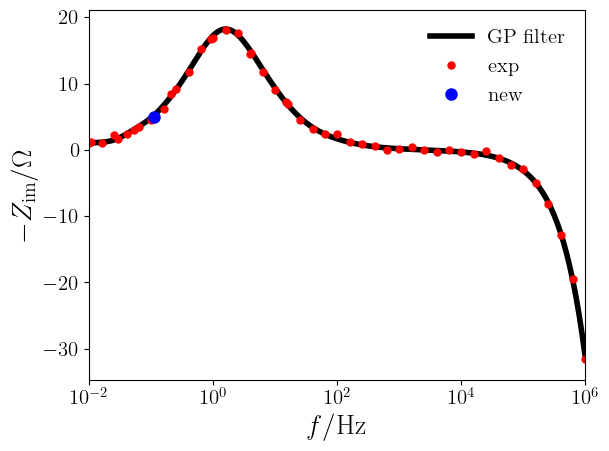

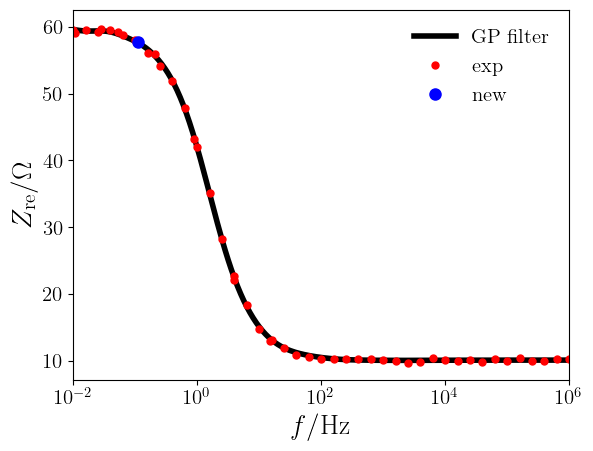

iter =  9 / 100 ; freq_new = 4.4727E-01


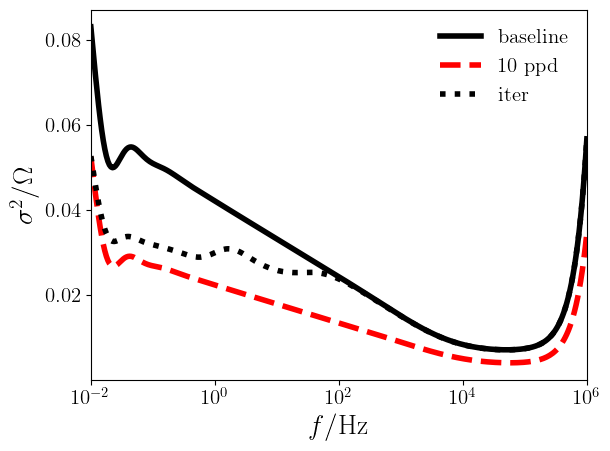

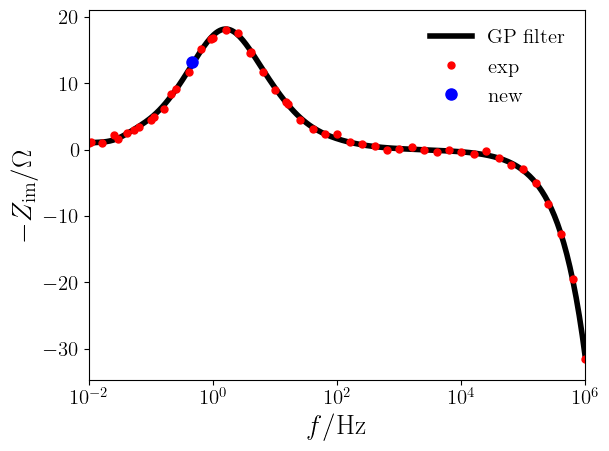

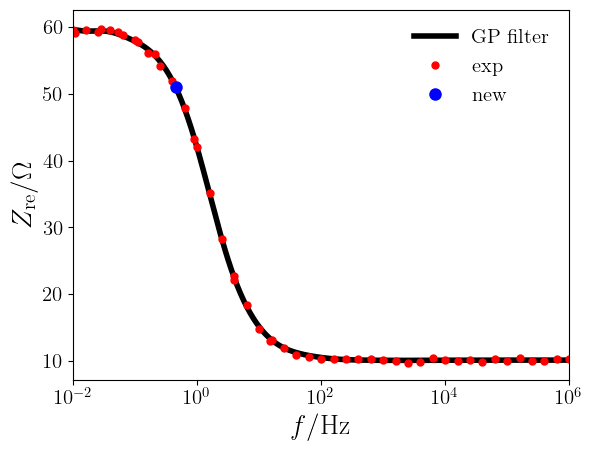

iter =  10 / 100 ; freq_new = 1.8579E+00


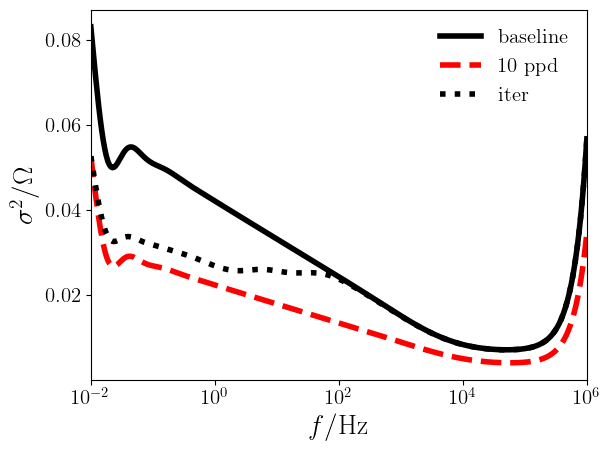

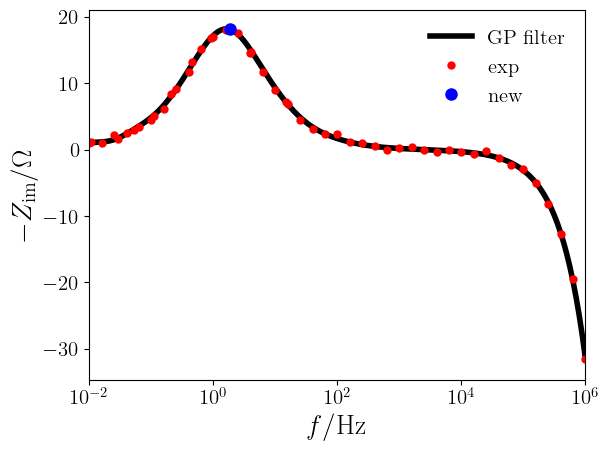

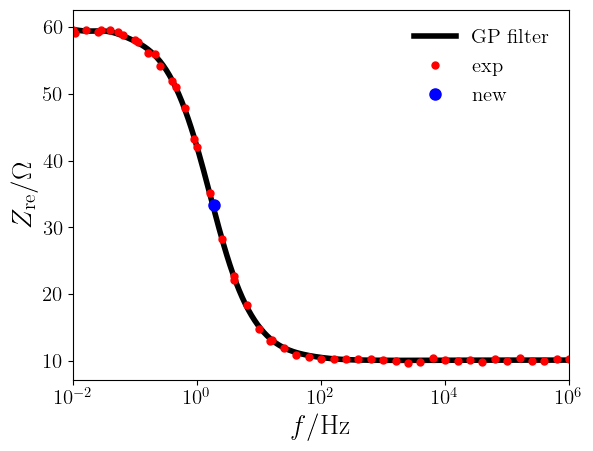

iter =  11 / 100 ; freq_new = 3.9371E+01


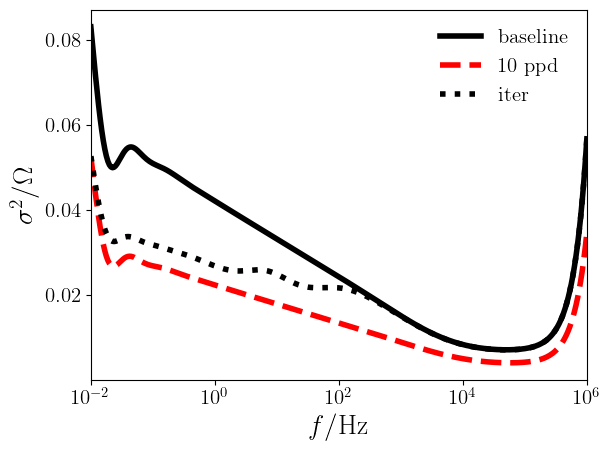

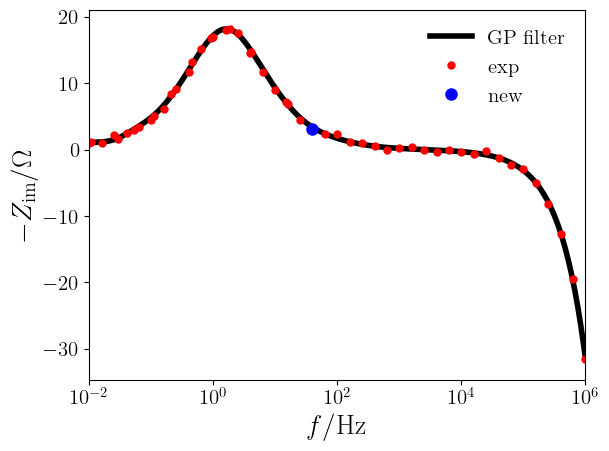

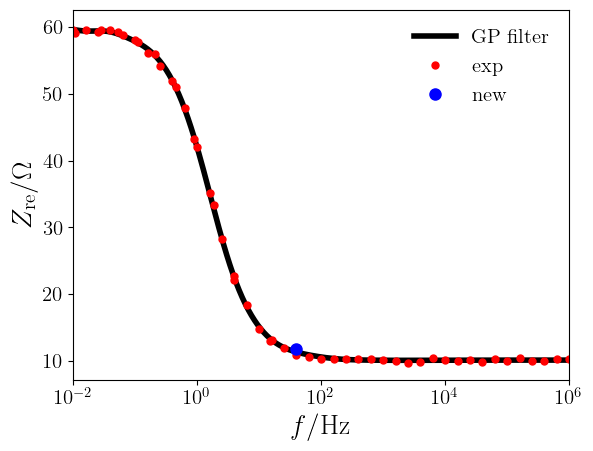

iter =  12 / 100 ; freq_new = 5.3199E+00


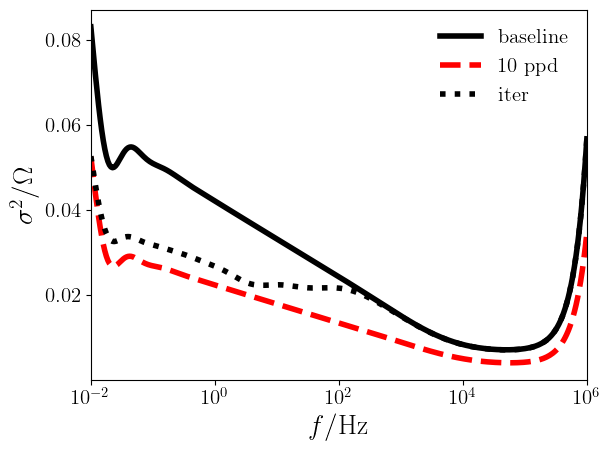

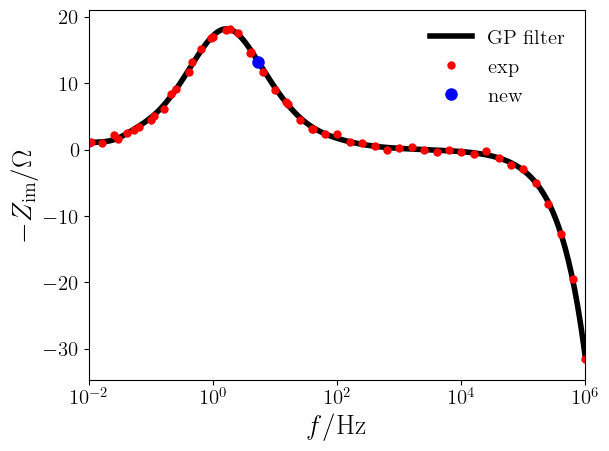

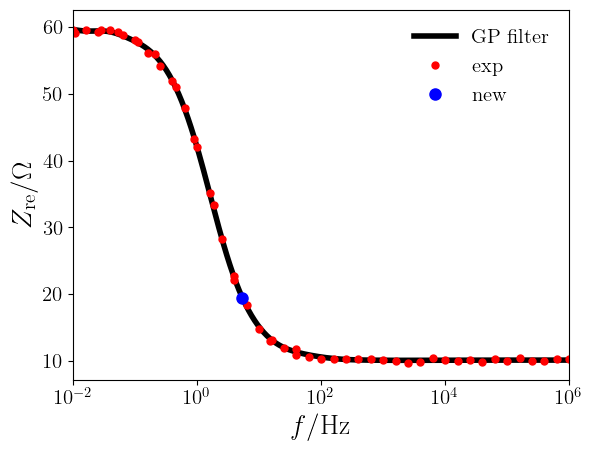

iter =  13 / 100 ; freq_new = 7.5969E+01


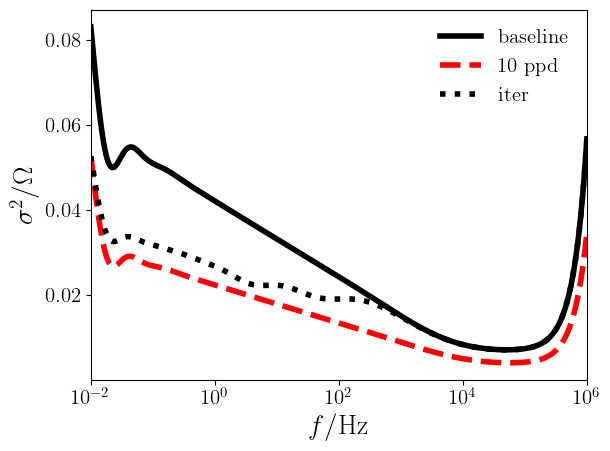

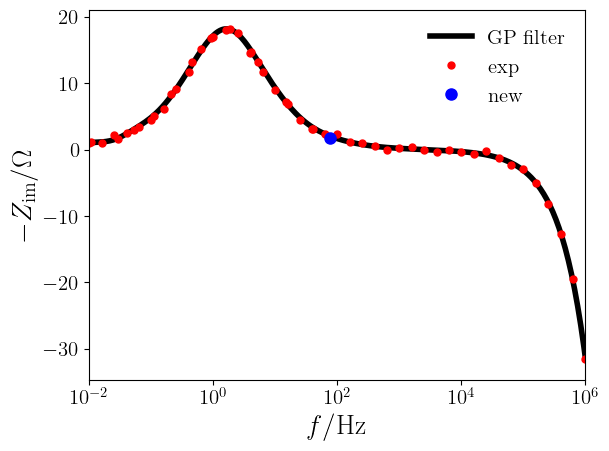

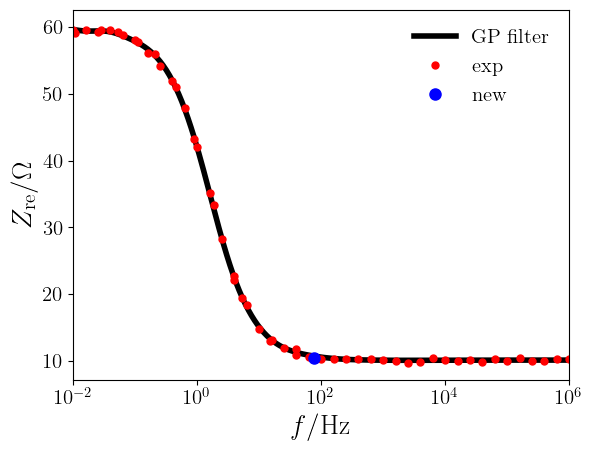

iter =  14 / 100 ; freq_new = 9.1556E+00


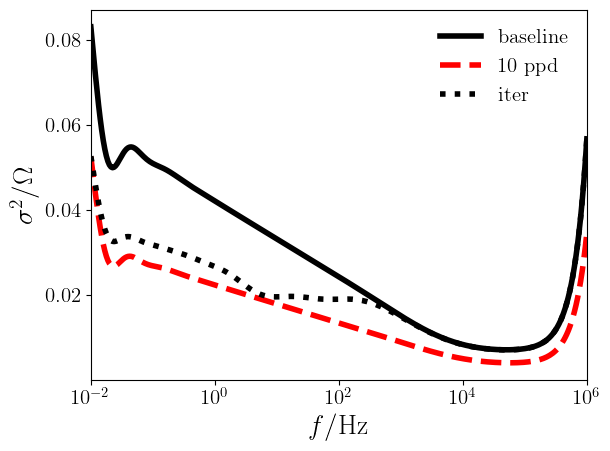

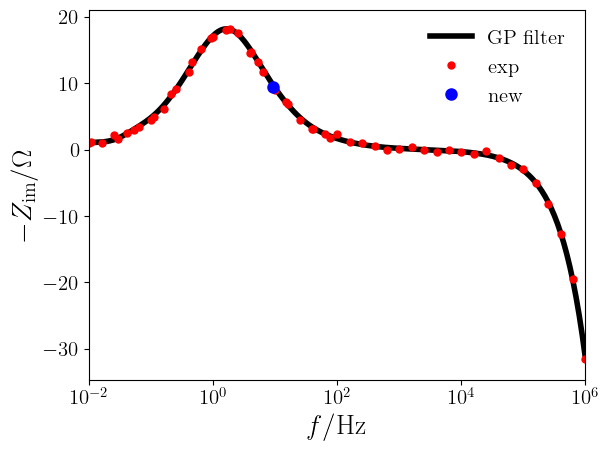

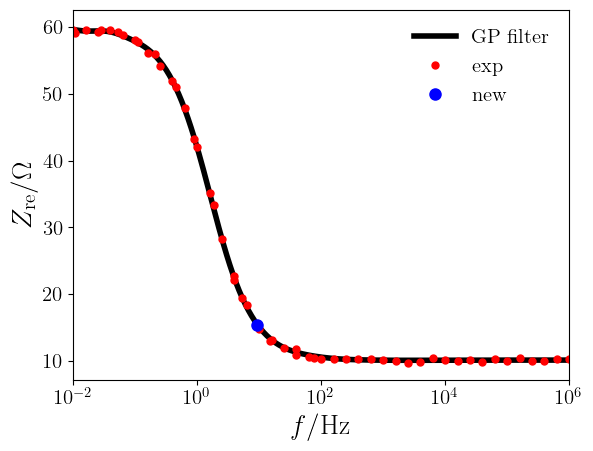

iter =  15 / 100 ; freq_new = 1.2500E+02


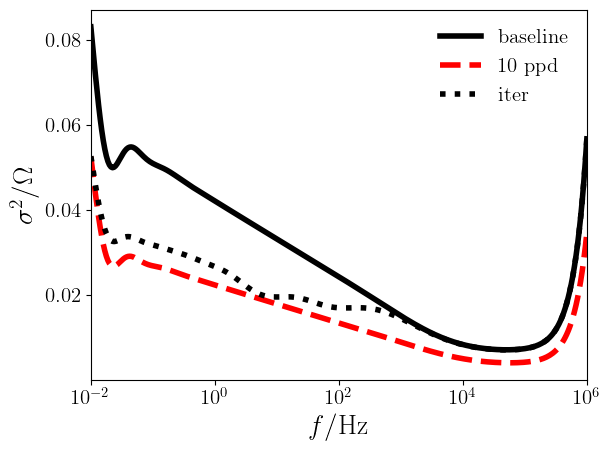

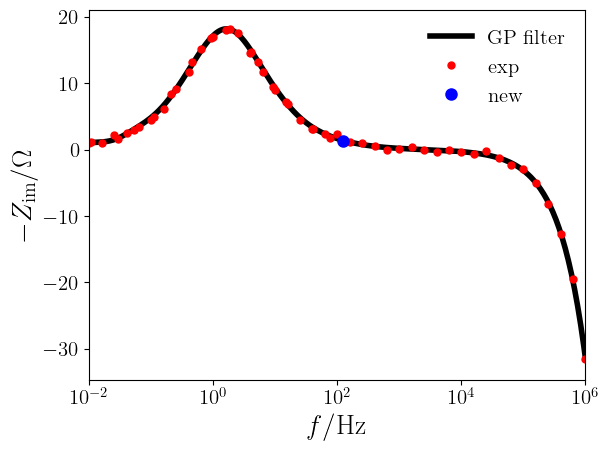

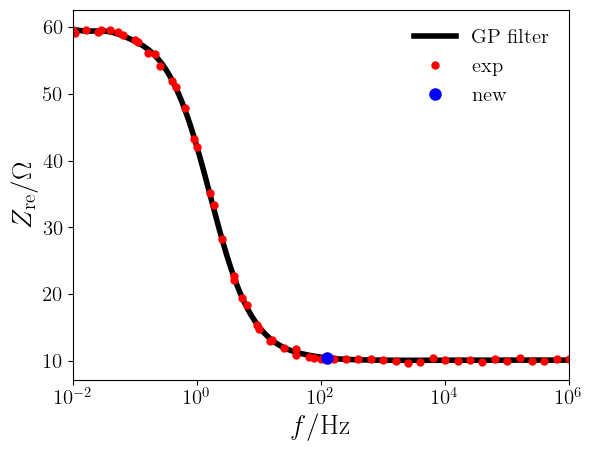

iter =  16 / 100 ; freq_new = 1.5857E+01


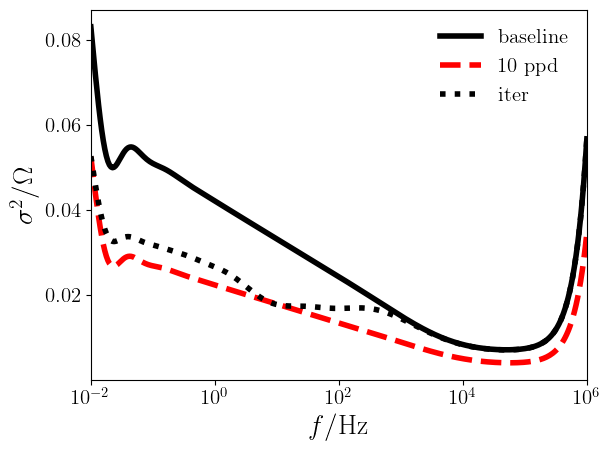

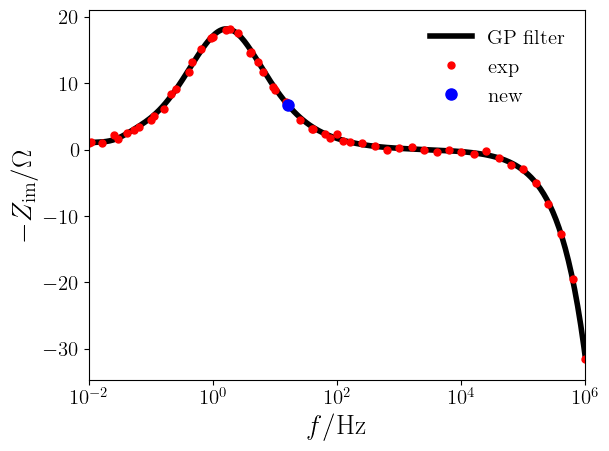

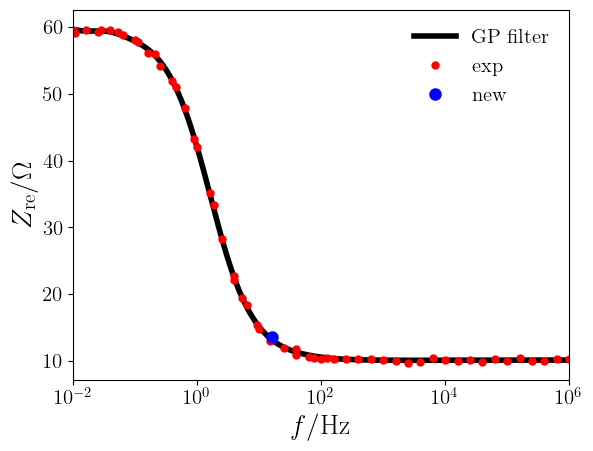

iter =  17 / 100 ; freq_new = 1.8061E+02


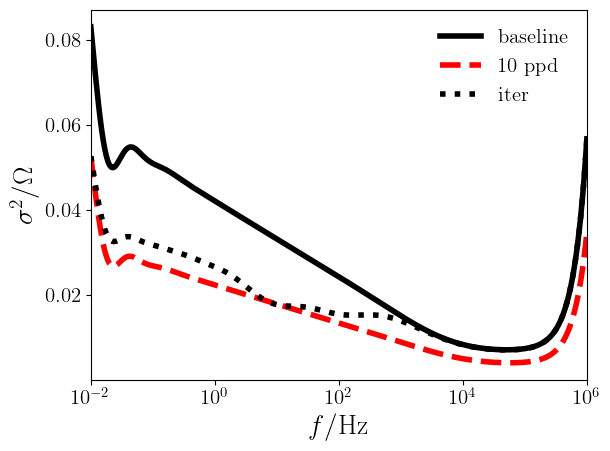

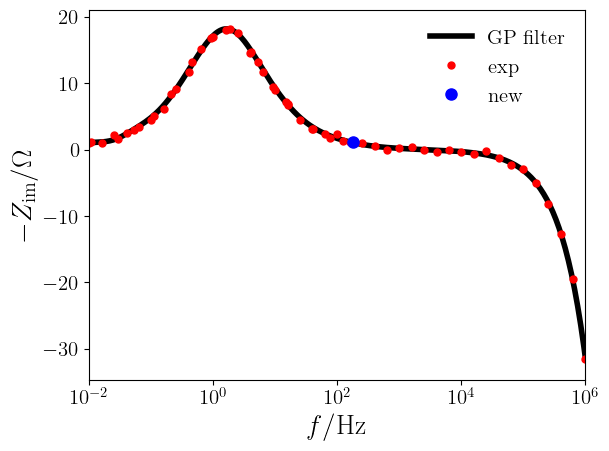

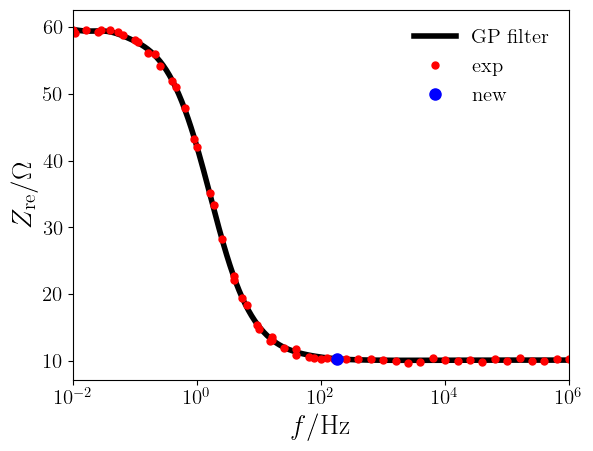

iter =  18 / 100 ; freq_new = 2.3562E+01


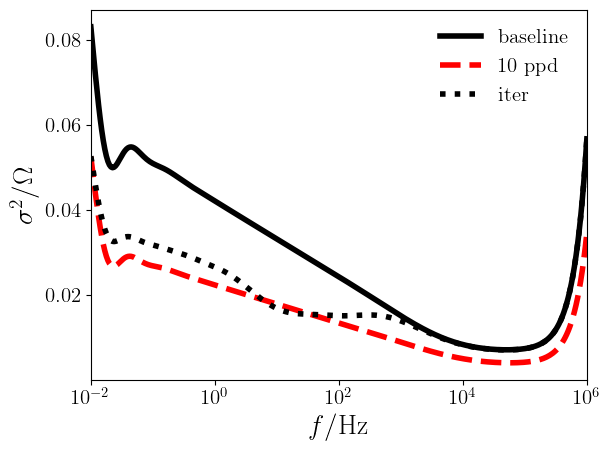

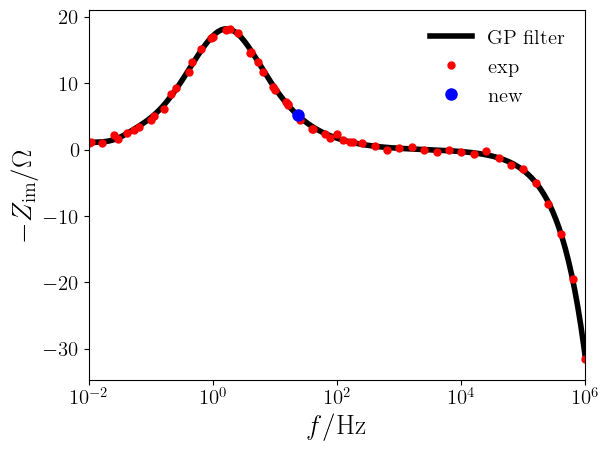

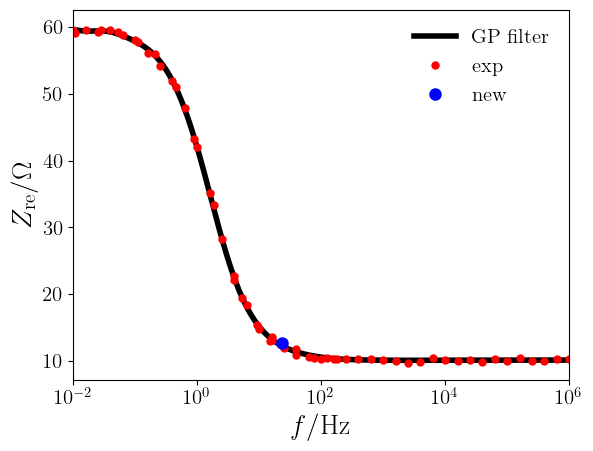

iter =  19 / 100 ; freq_new = 9.9989E+05


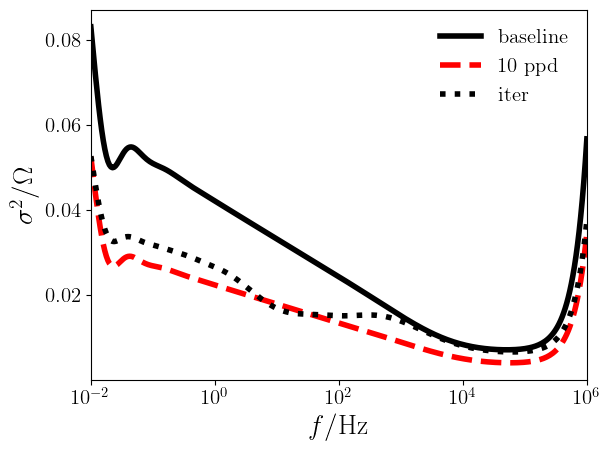

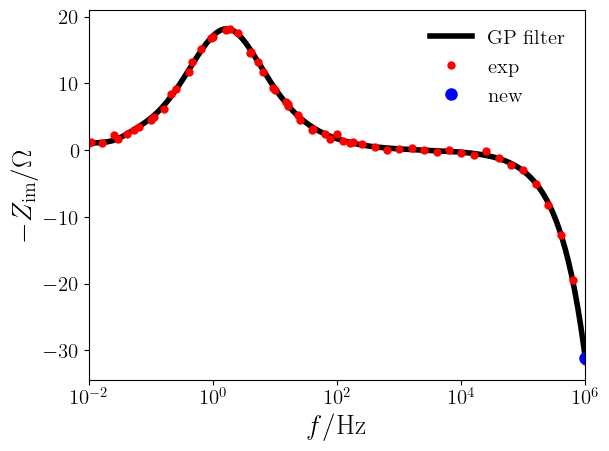

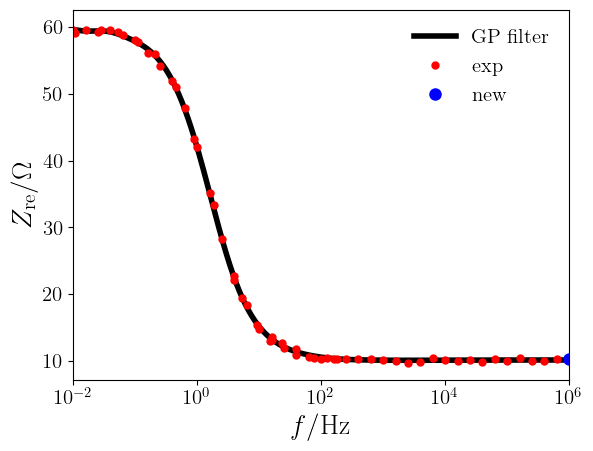

iter =  20 / 100 ; freq_new = 9.9941E+05


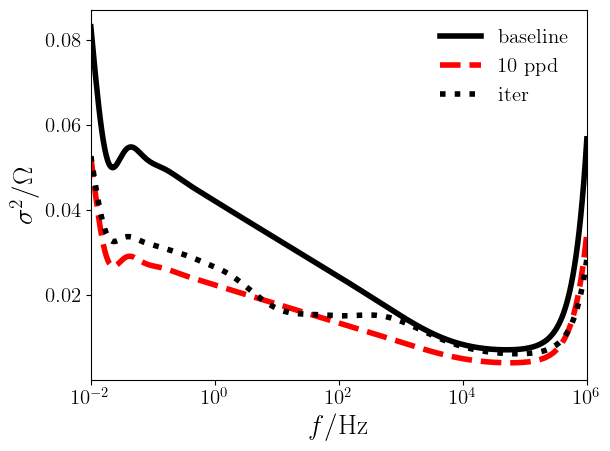

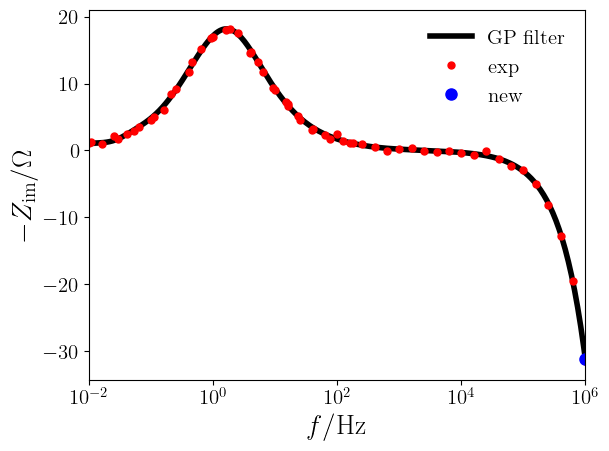

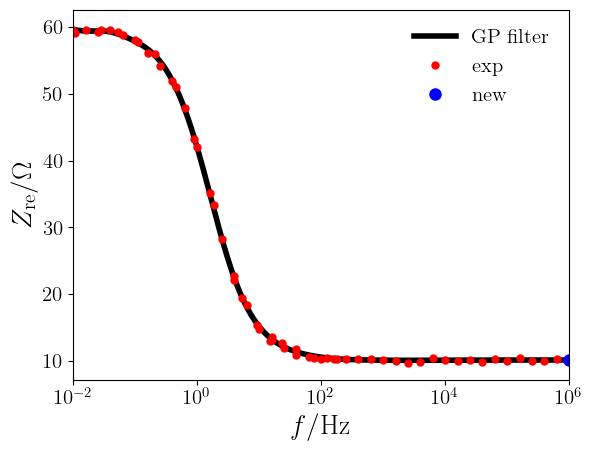

iter =  21 / 100 ; freq_new = 1.0566E+03


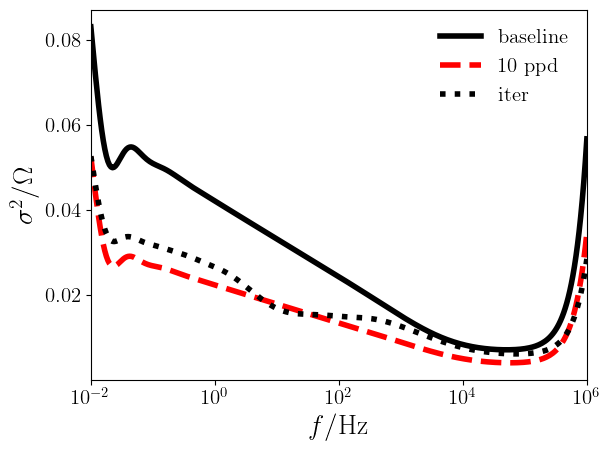

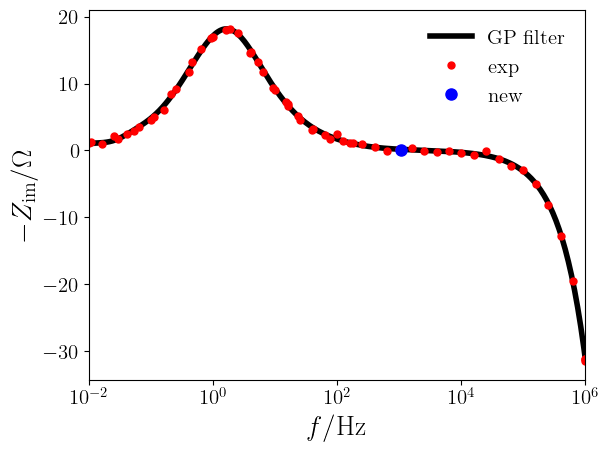

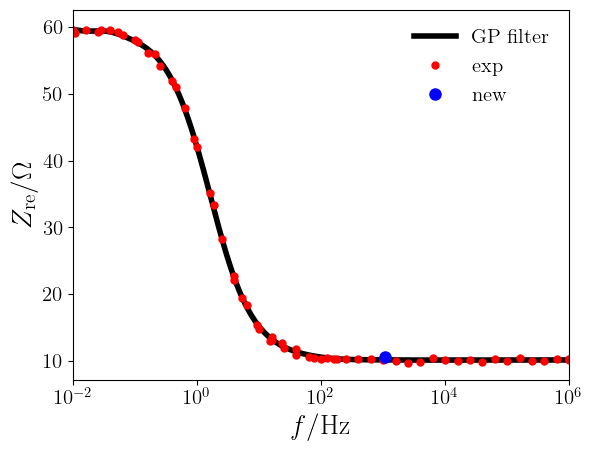

iter =  22 / 100 ; freq_new = 9.9924E+05


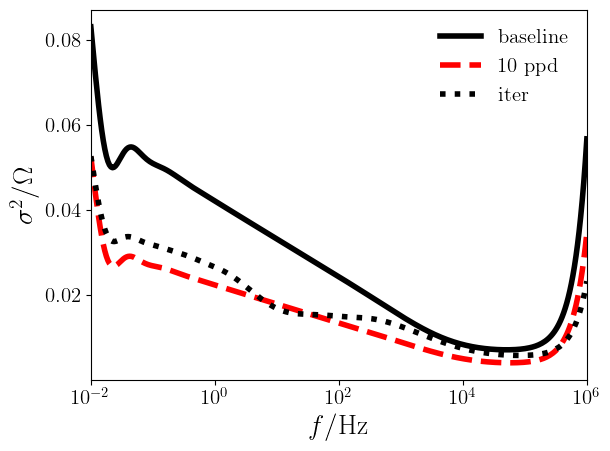

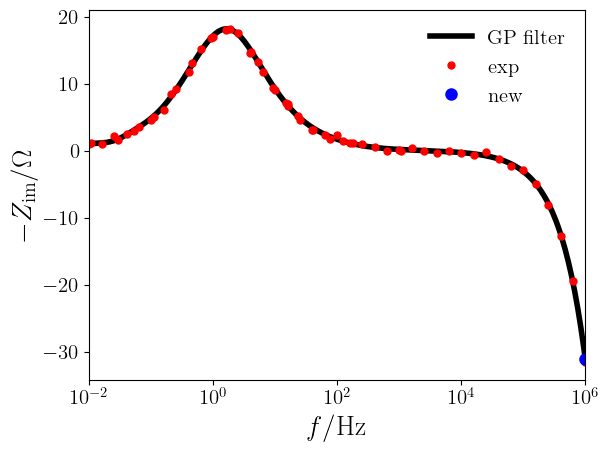

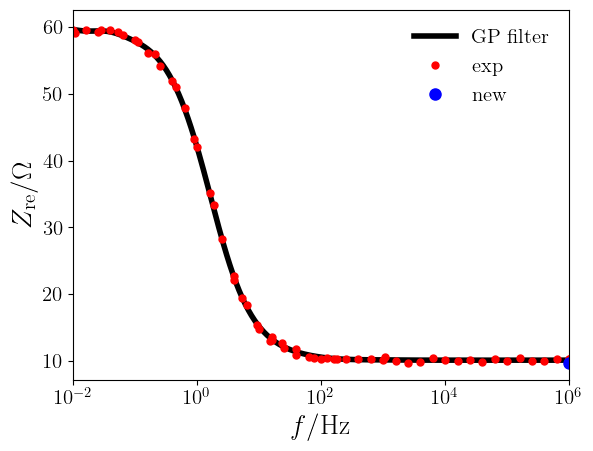

iter =  23 / 100 ; freq_new = 9.9978E+05


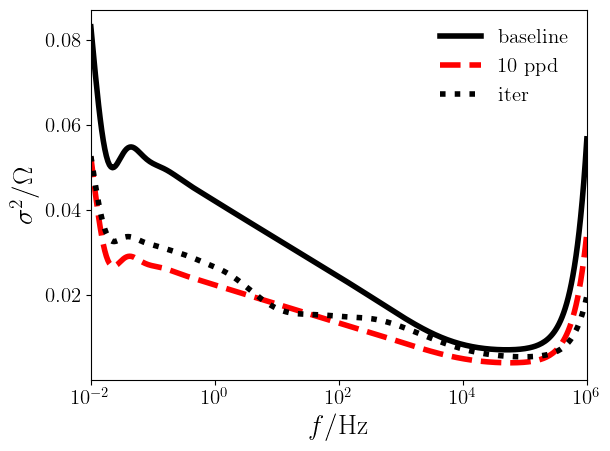

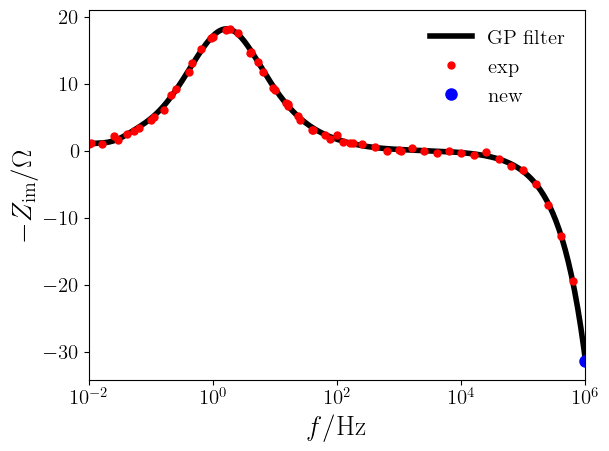

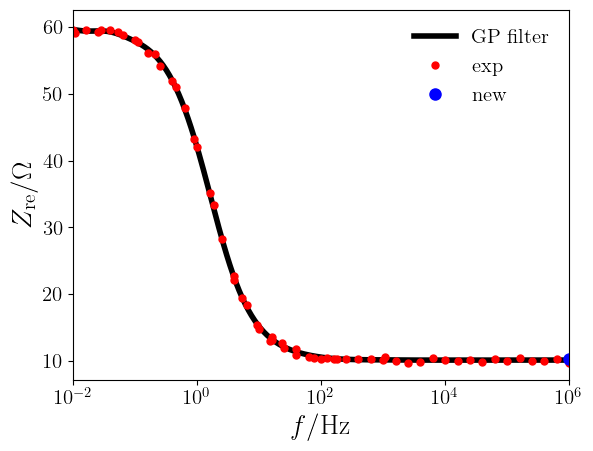

iter =  24 / 100 ; freq_new = 9.9732E+05


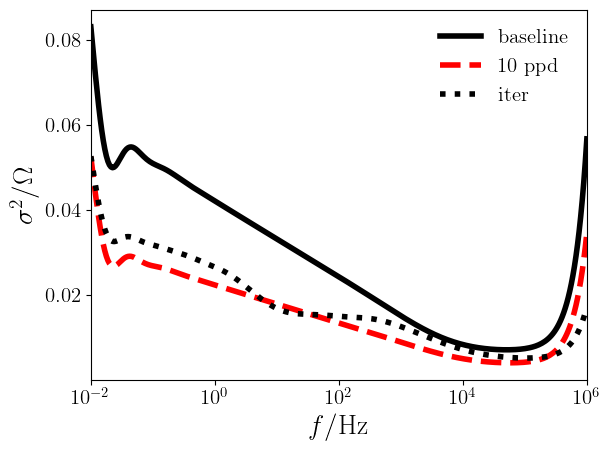

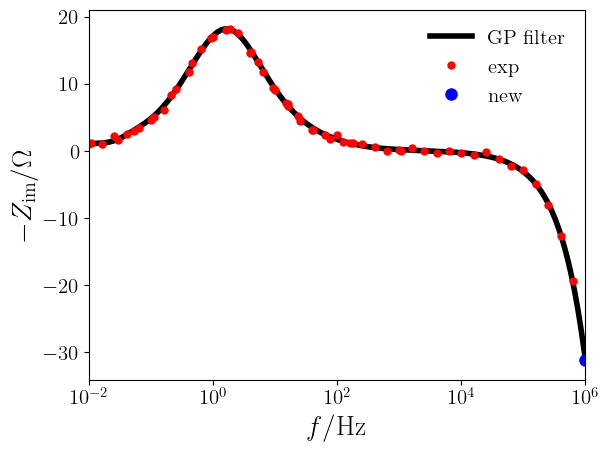

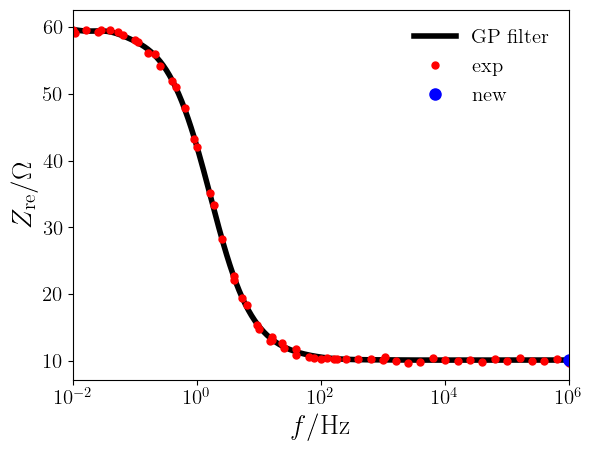

iter =  25 / 100 ; freq_new = 9.9707E+05


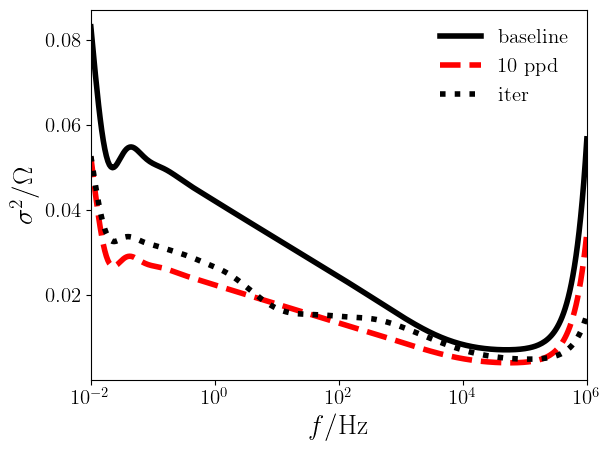

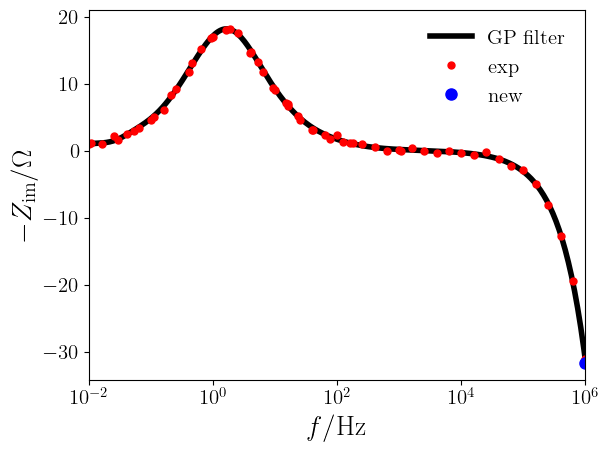

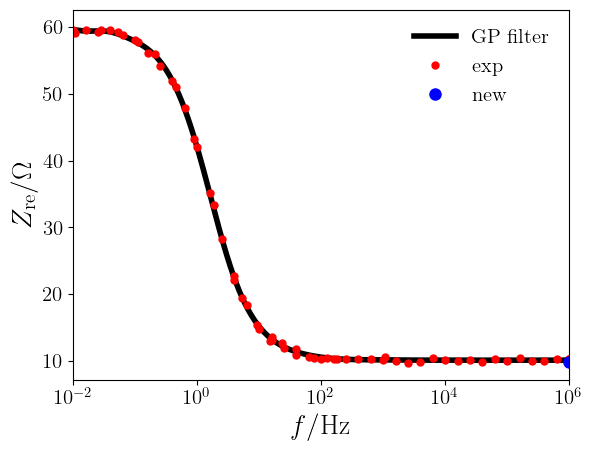

iter =  26 / 100 ; freq_new = 9.9476E+05


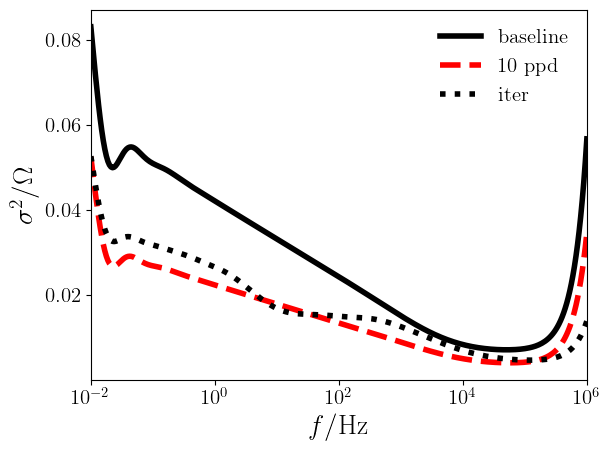

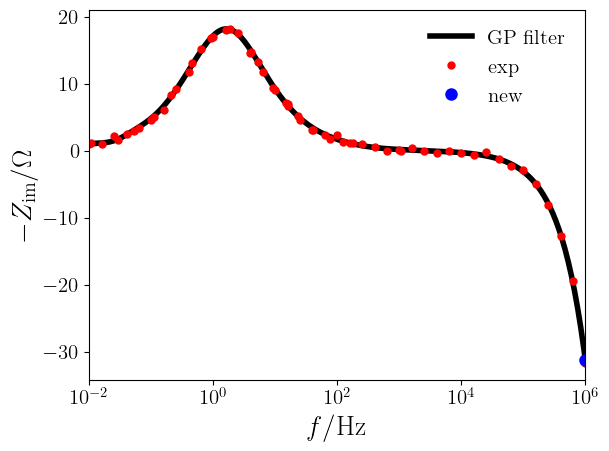

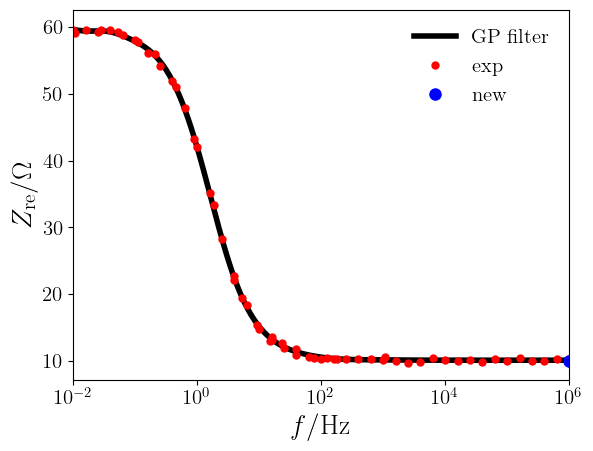

iter =  27 / 100 ; freq_new = 9.9163E+05


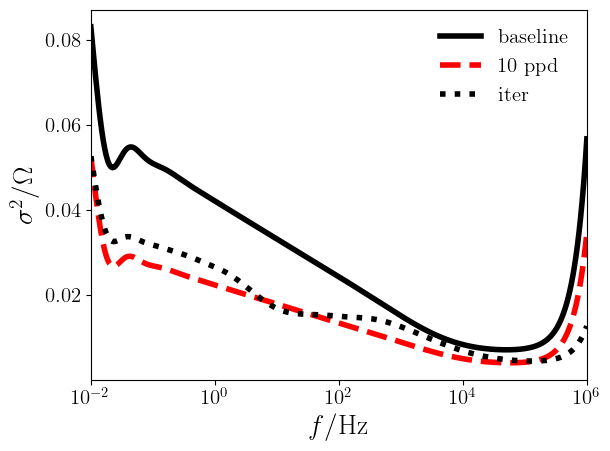

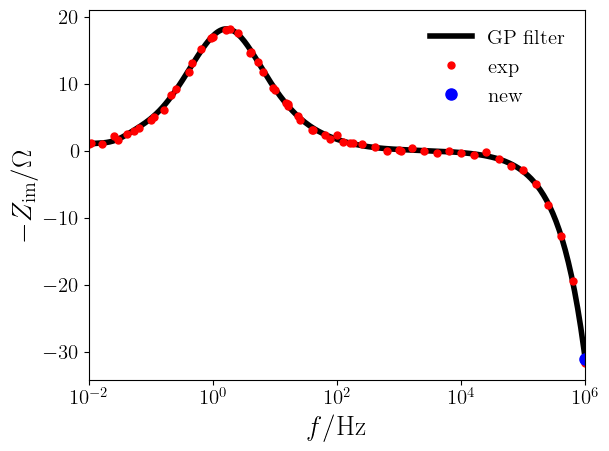

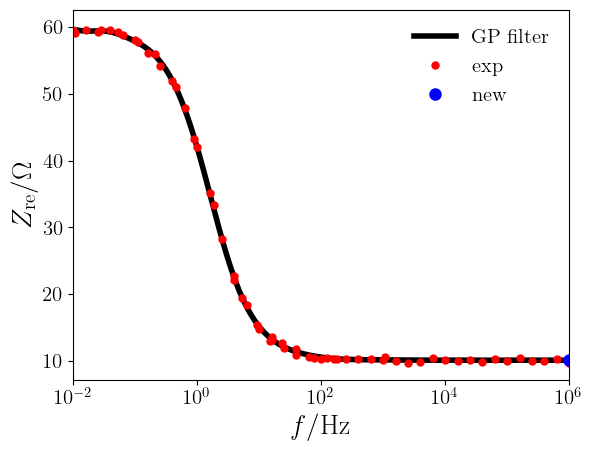

iter =  28 / 100 ; freq_new = 9.9050E+05


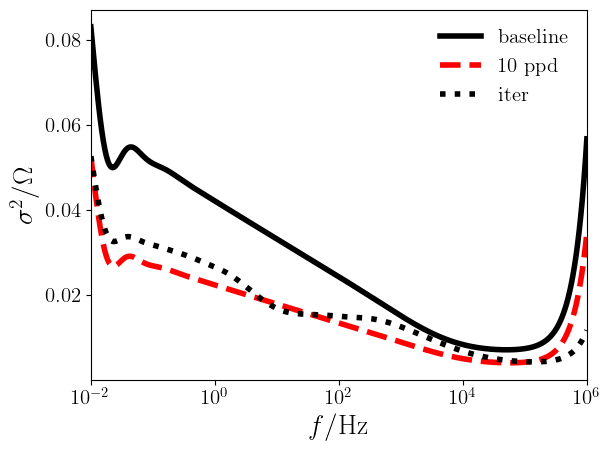

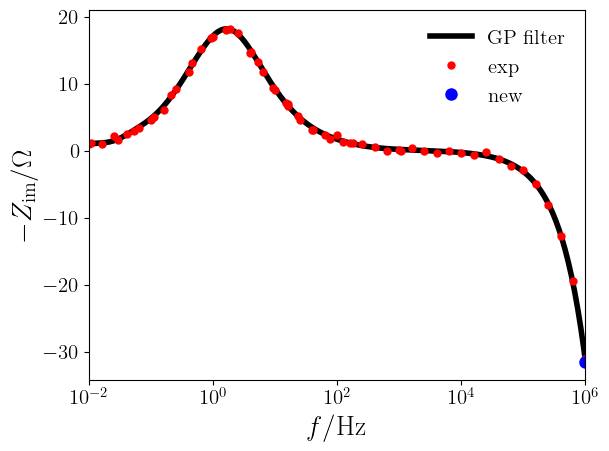

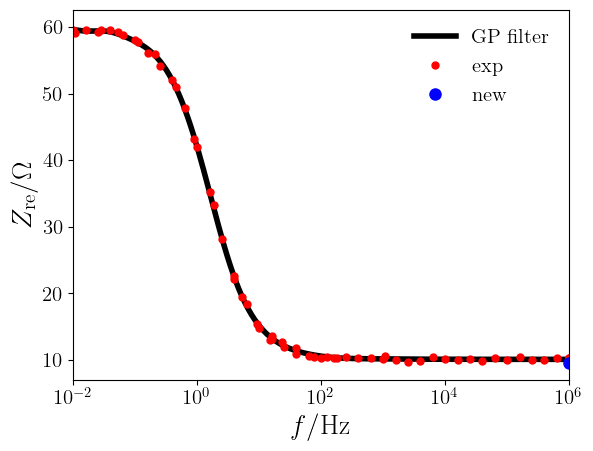

iter =  29 / 100 ; freq_new = 9.9381E+05


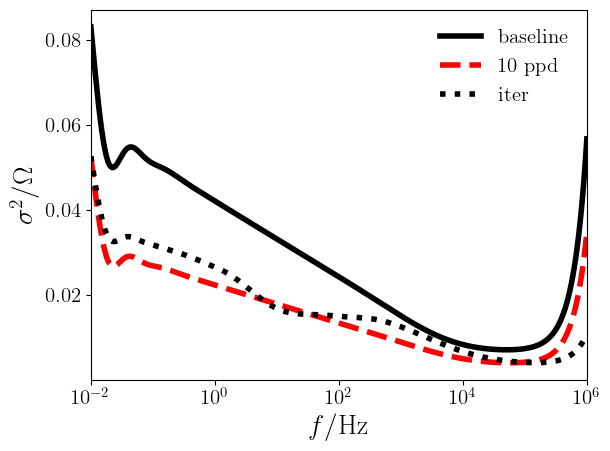

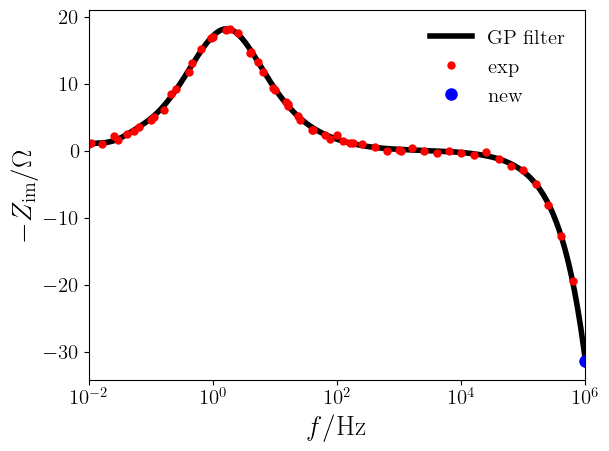

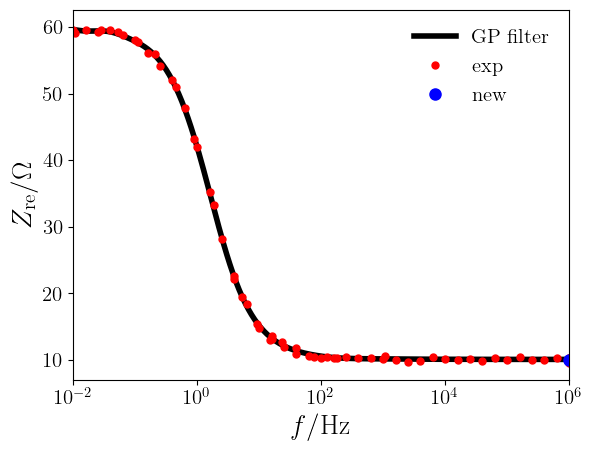

iter =  30 / 100 ; freq_new = 9.9734E+05


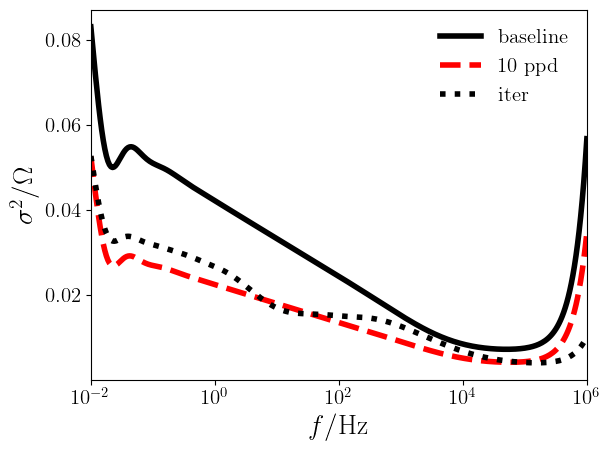

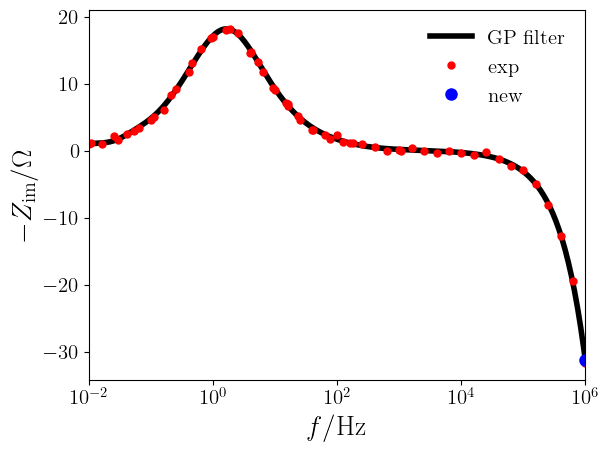

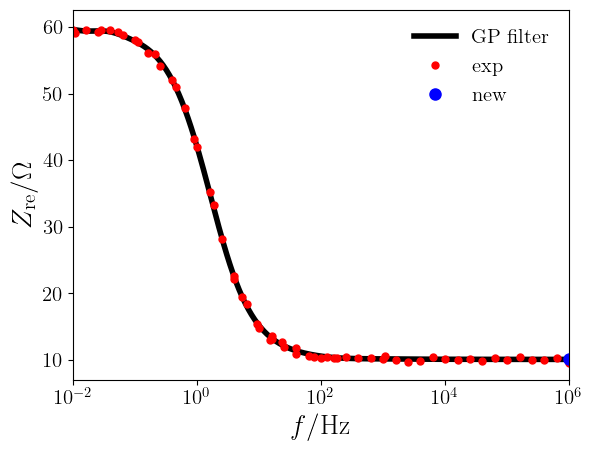

iter =  31 / 100 ; freq_new = 9.8143E+05
2.8416E-01, 2.6511E+01, 1.8639E+01, 2.7322E+01, 1.0078E+01, 4.996494E-06; evidence = -5.98380260E+01
2.8416E-01, 2.6511E+01, 2.1256E+01, 2.9939E+01, 1.0078E+01, 4.996504E-06; evidence = -5.98380260E+01
Optimization terminated successfully.
         Current function value: -59.838026
         Iterations: 2
         Function evaluations: 299


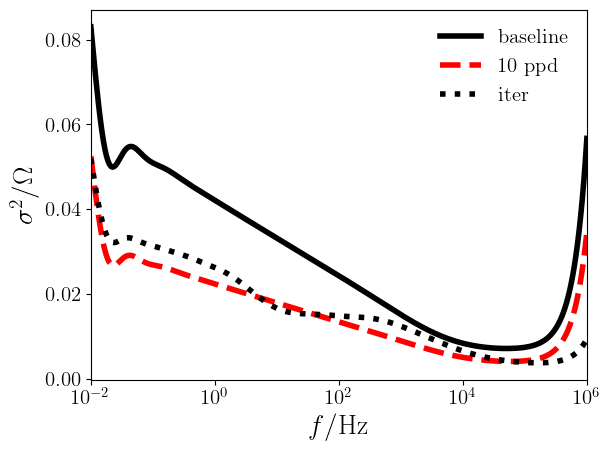

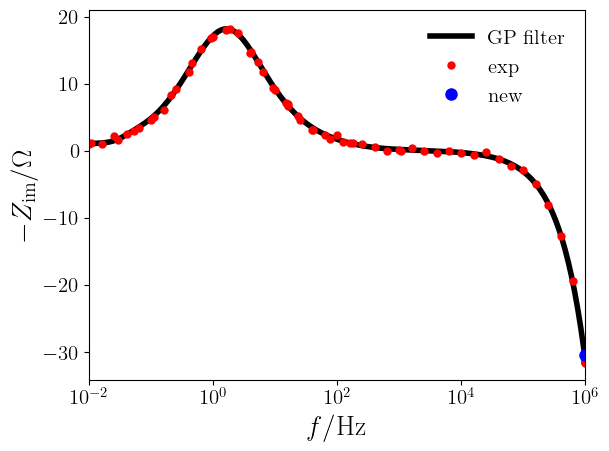

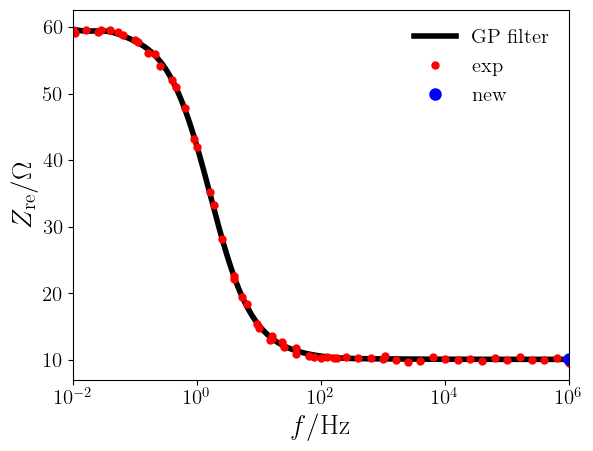

iter =  32 / 100 ; freq_new = 9.9751E+05


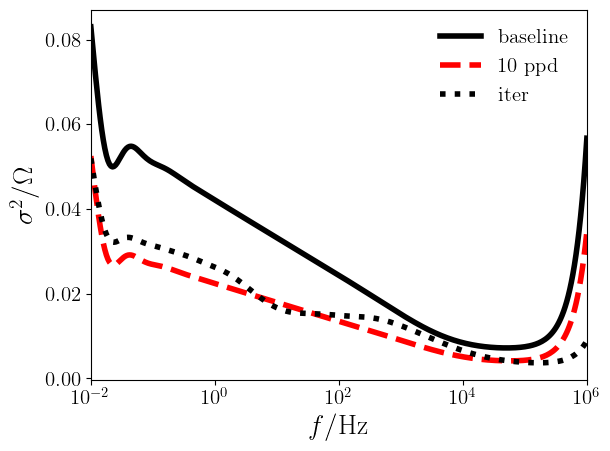

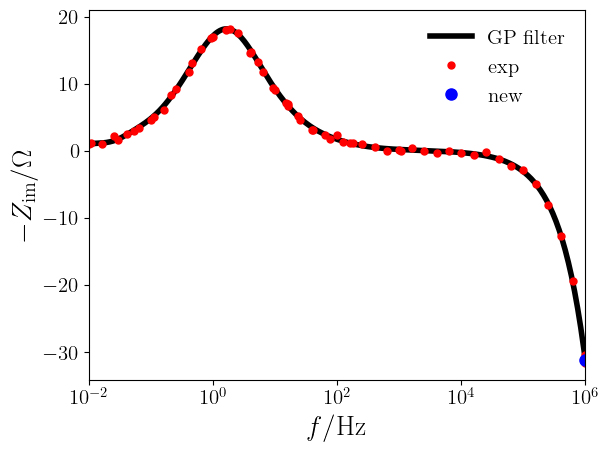

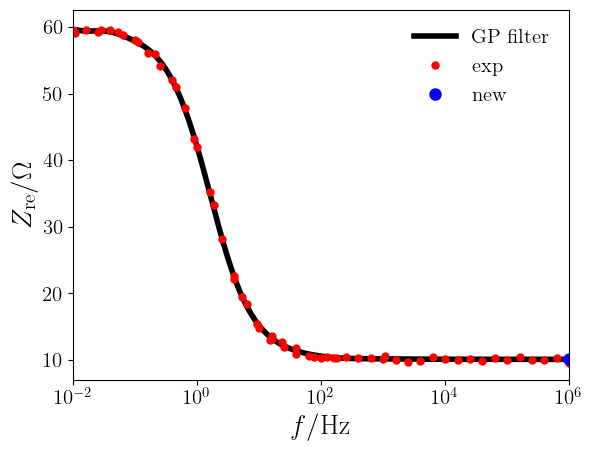

iter =  33 / 100 ; freq_new = 9.9788E+05


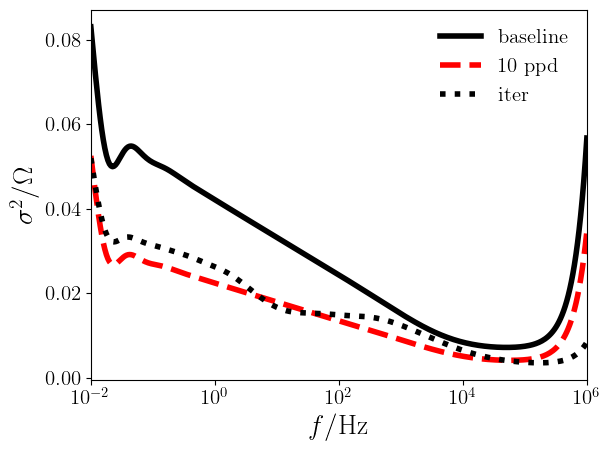

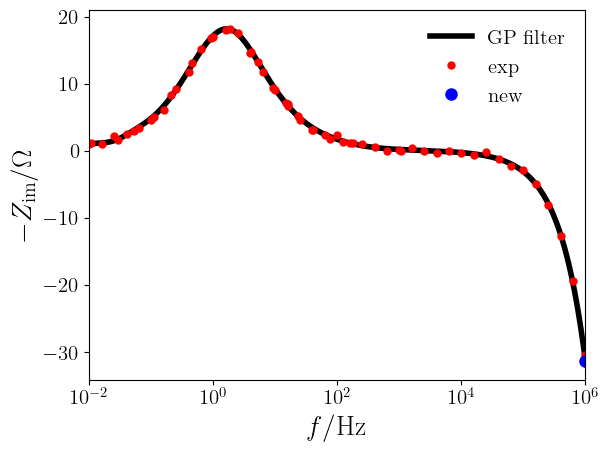

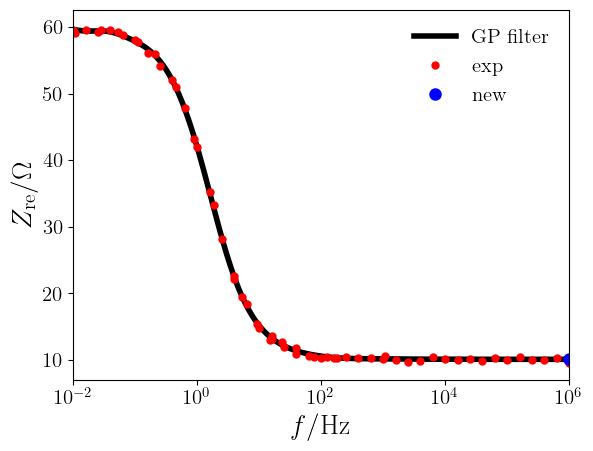

iter =  34 / 100 ; freq_new = 9.9888E+05


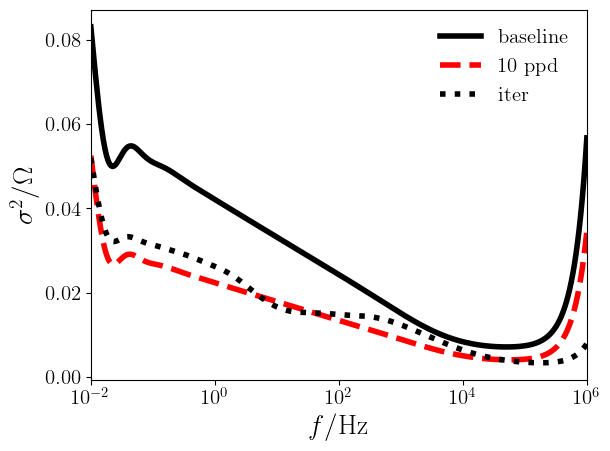

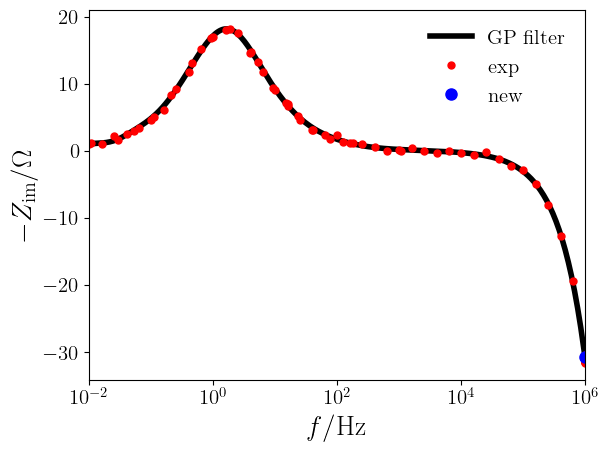

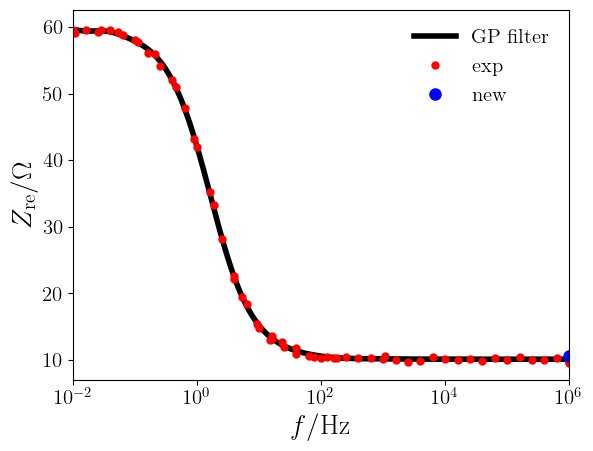

iter =  35 / 100 ; freq_new = 9.6809E+05


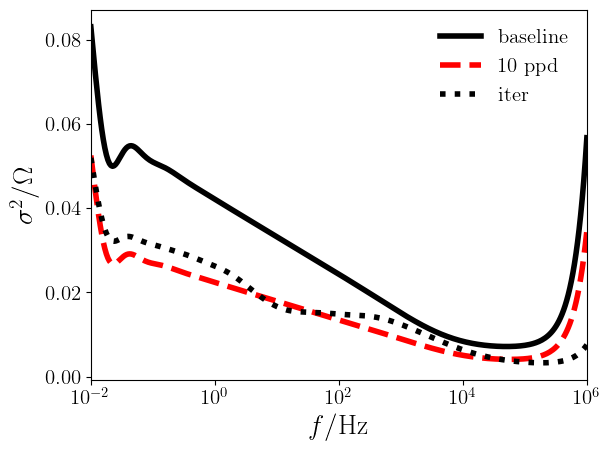

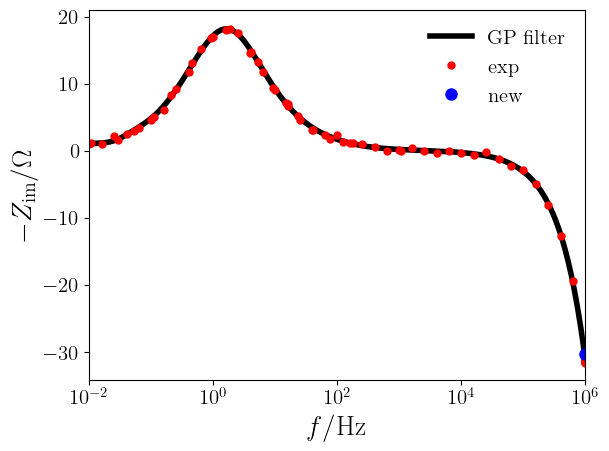

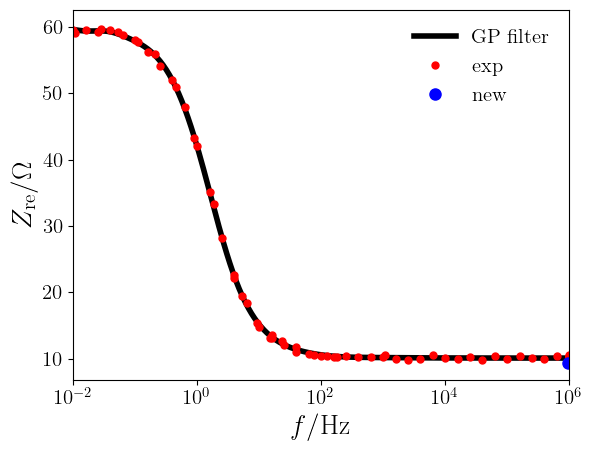

iter =  36 / 100 ; freq_new = 9.8725E+05


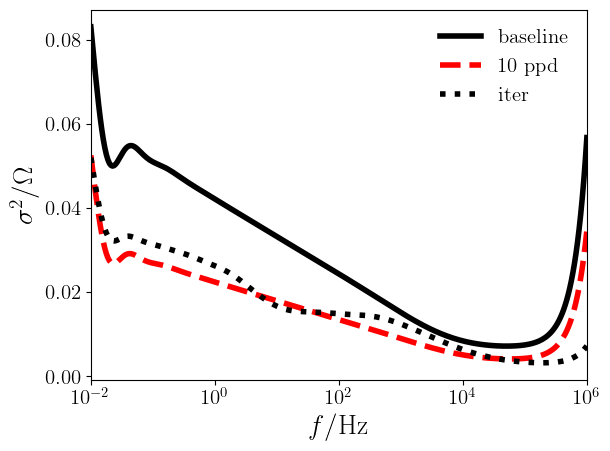

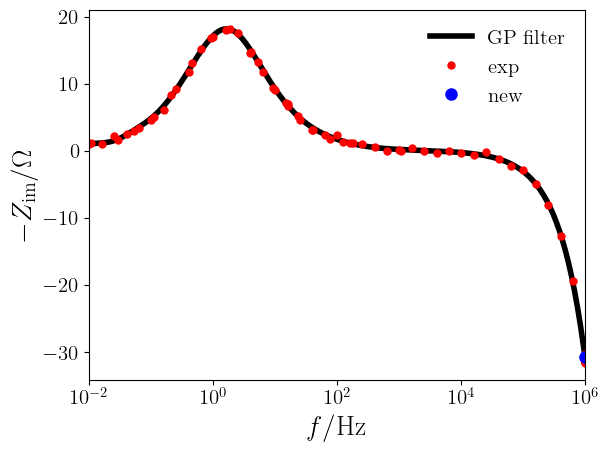

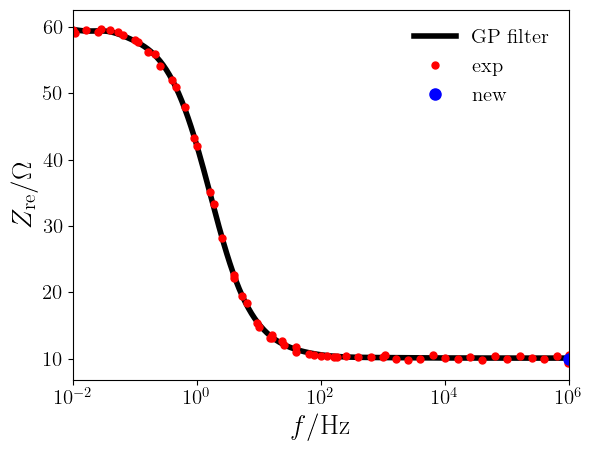

iter =  37 / 100 ; freq_new = 8.9271E+05


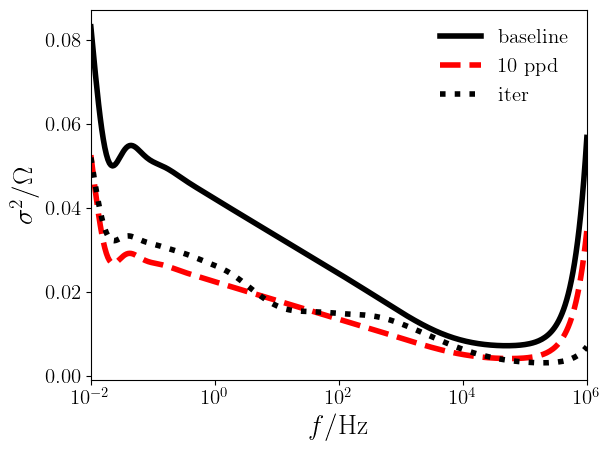

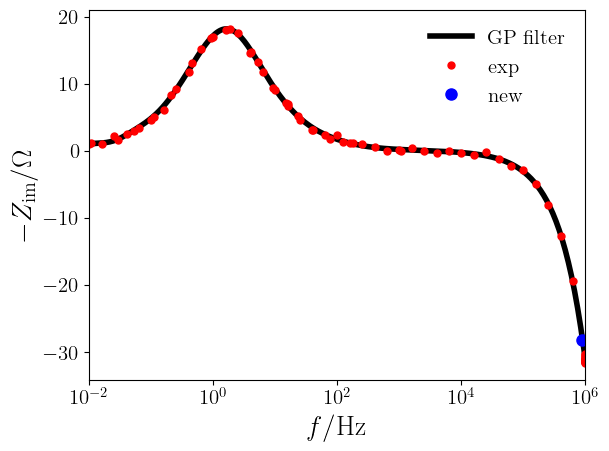

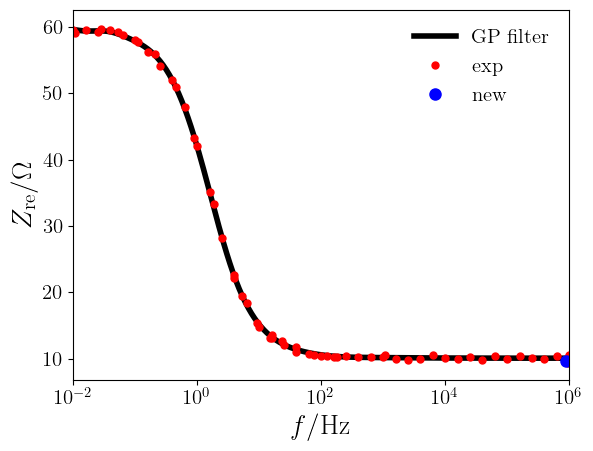

iter =  38 / 100 ; freq_new = 9.9410E+05


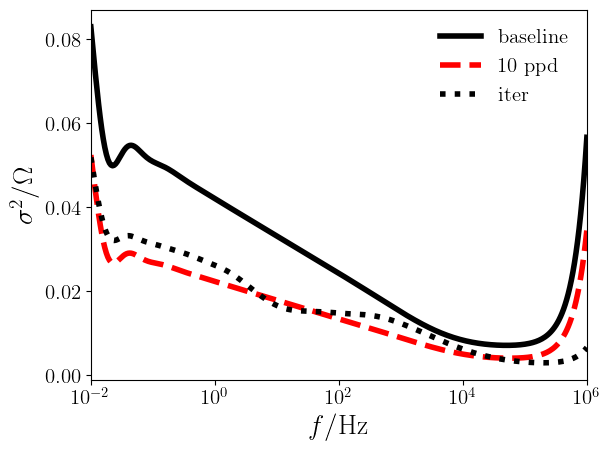

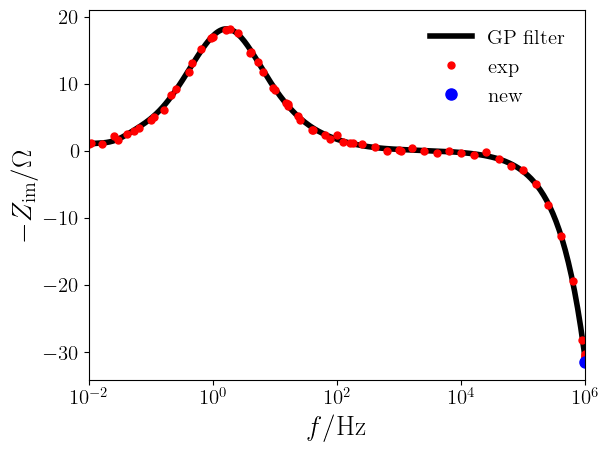

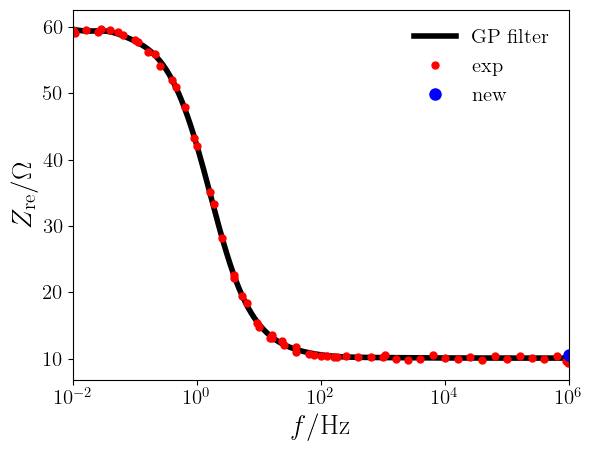

iter =  39 / 100 ; freq_new = 7.9929E+05


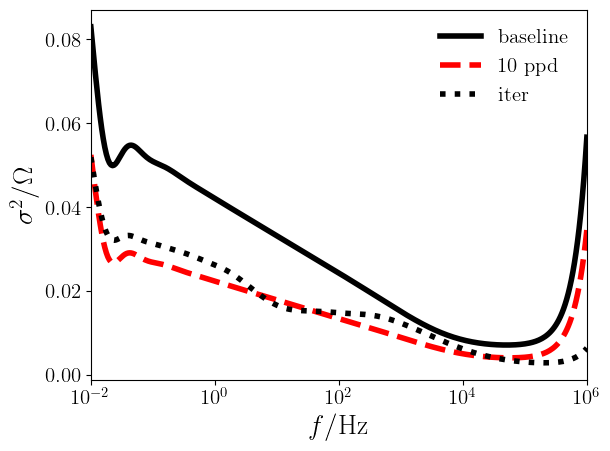

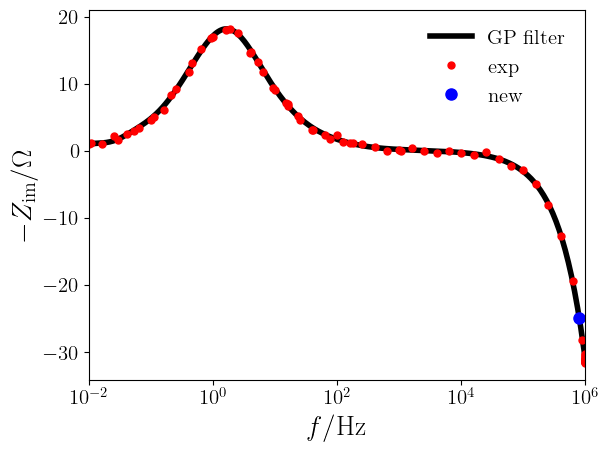

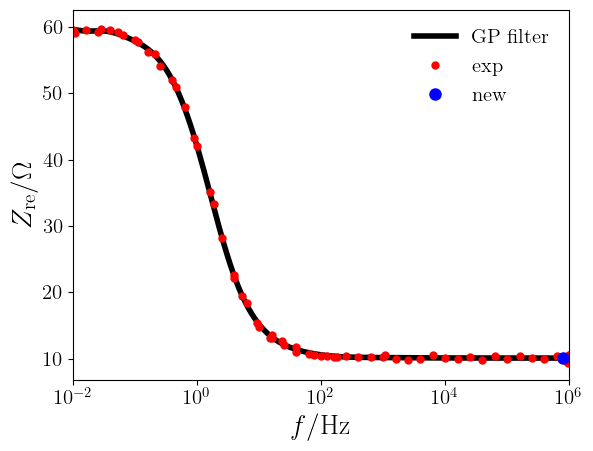

iter =  40 / 100 ; freq_new = 9.5438E+05


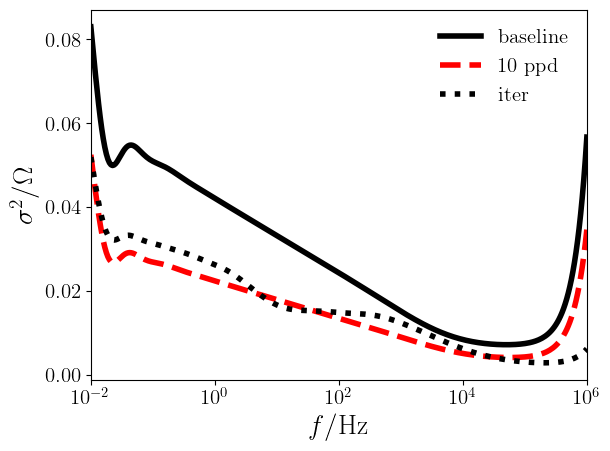

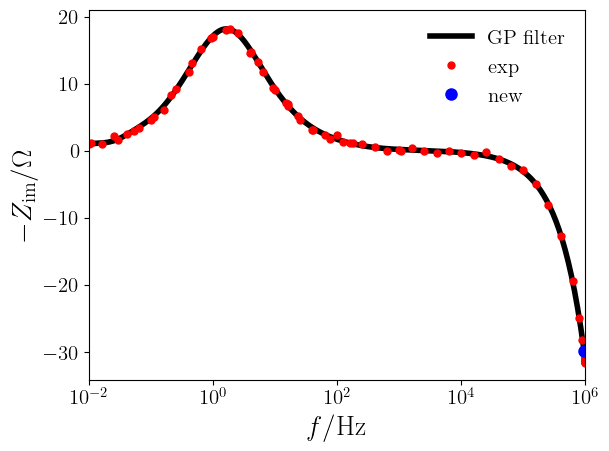

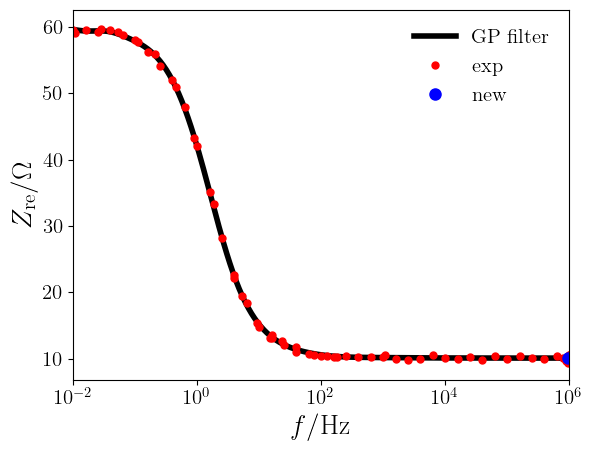

iter =  41 / 100 ; freq_new = 8.9616E+05


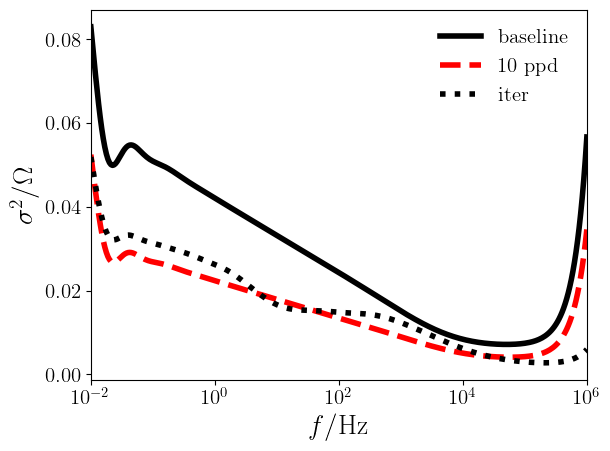

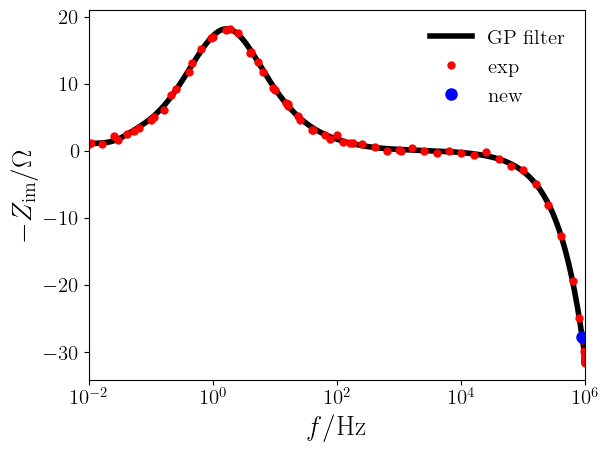

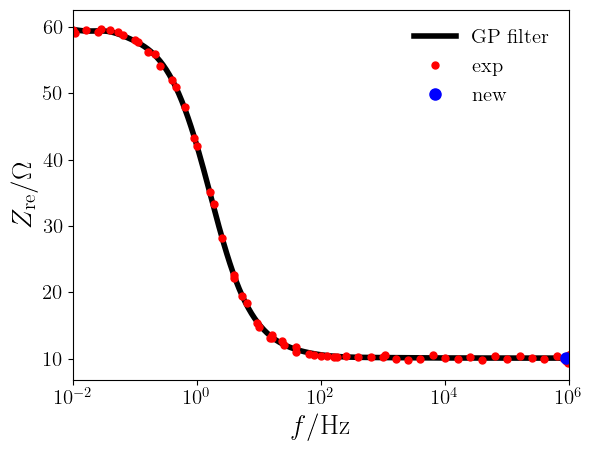

iter =  42 / 100 ; freq_new = 9.3267E+05


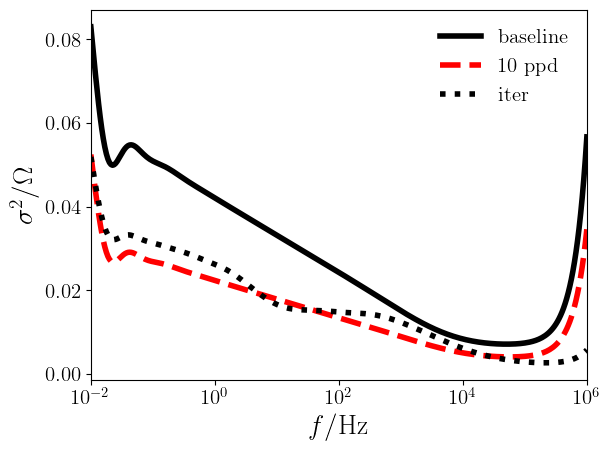

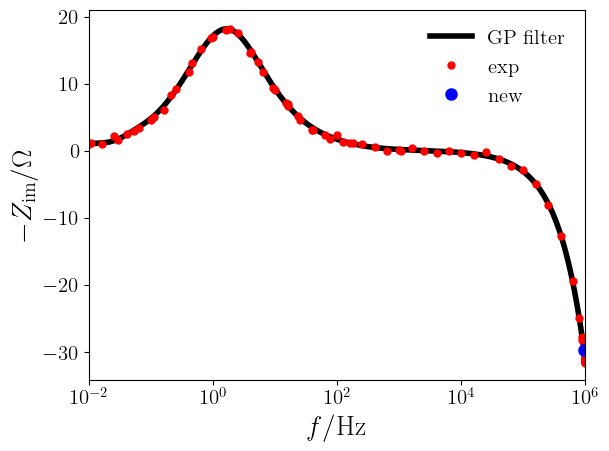

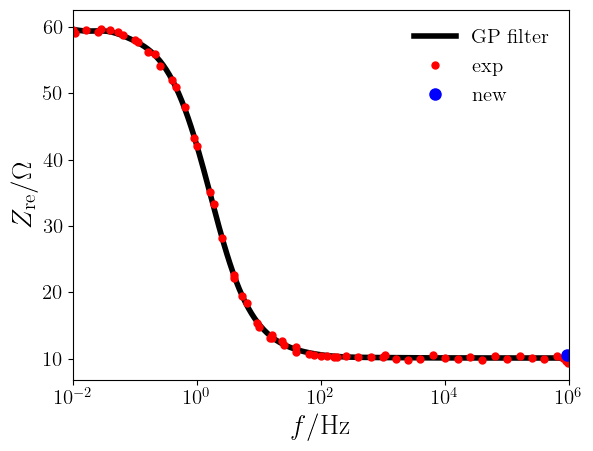

iter =  43 / 100 ; freq_new = 8.3973E+05


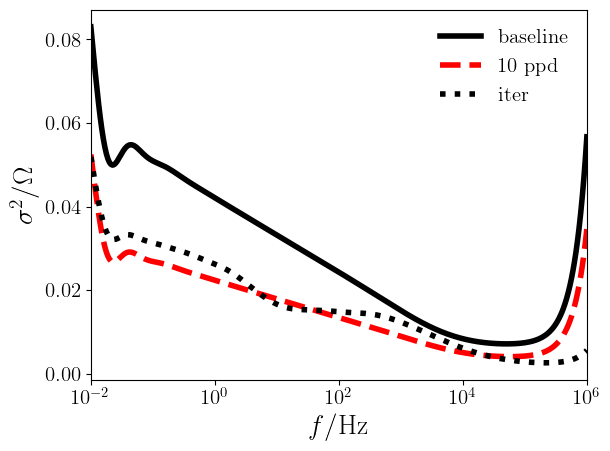

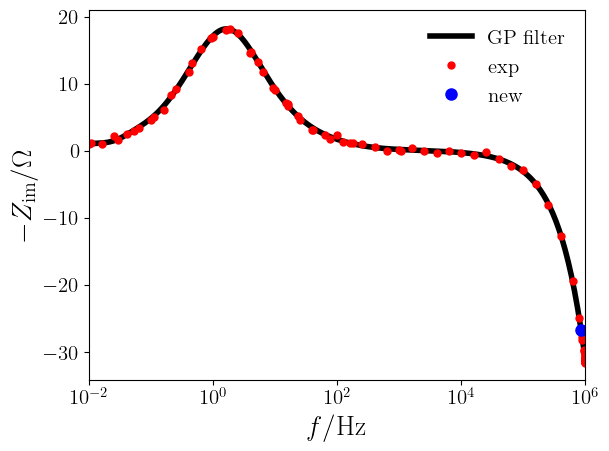

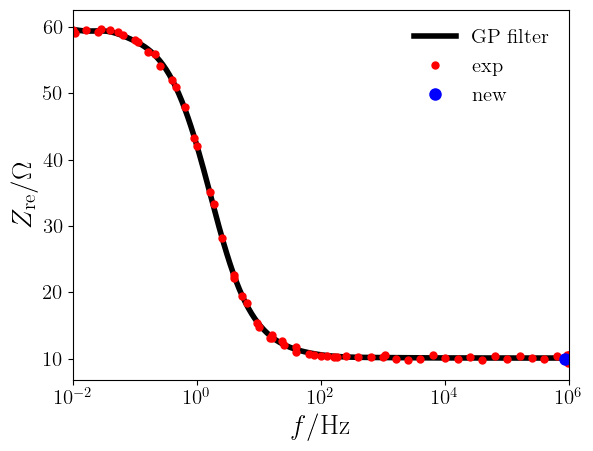

iter =  44 / 100 ; freq_new = 8.3982E+05


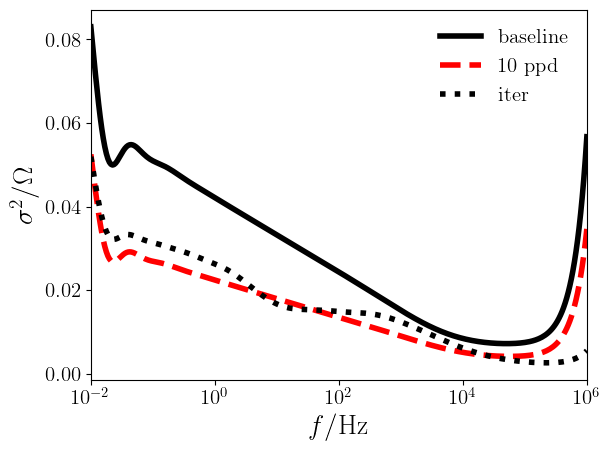

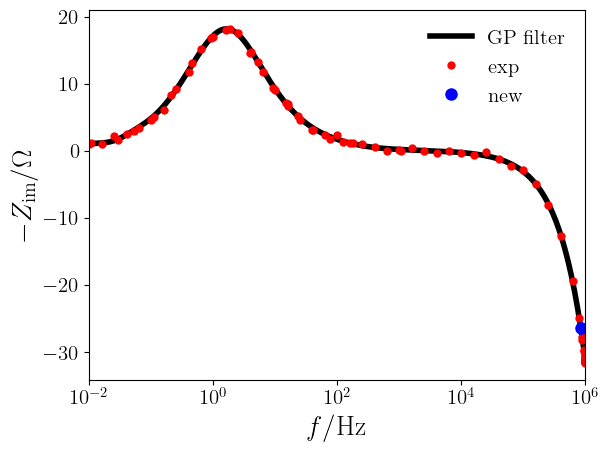

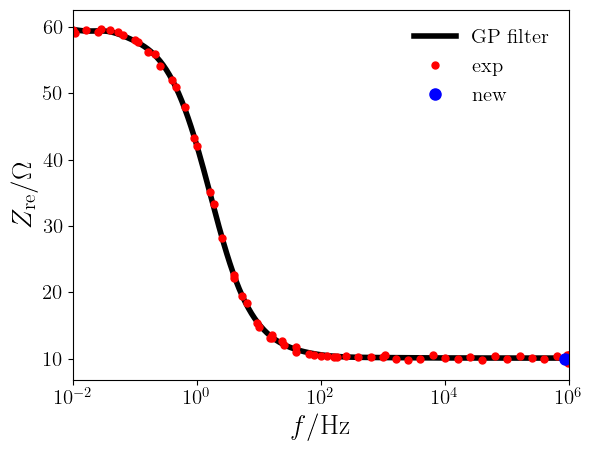

iter =  45 / 100 ; freq_new = 8.3489E+05


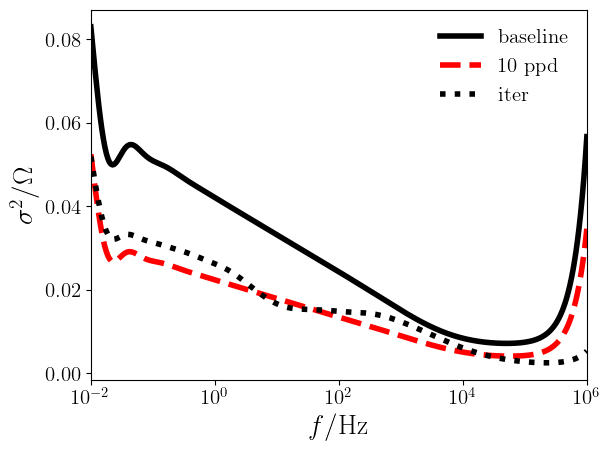

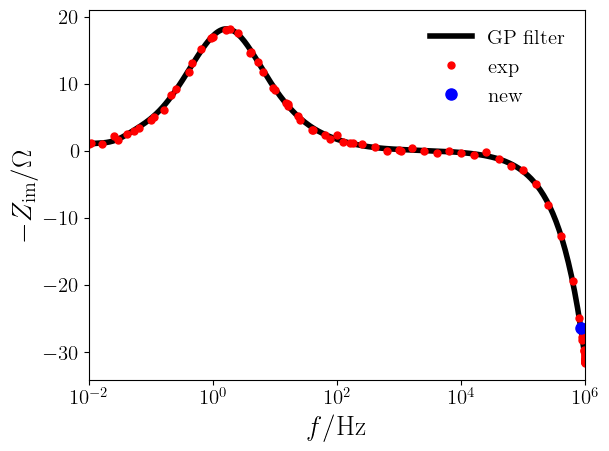

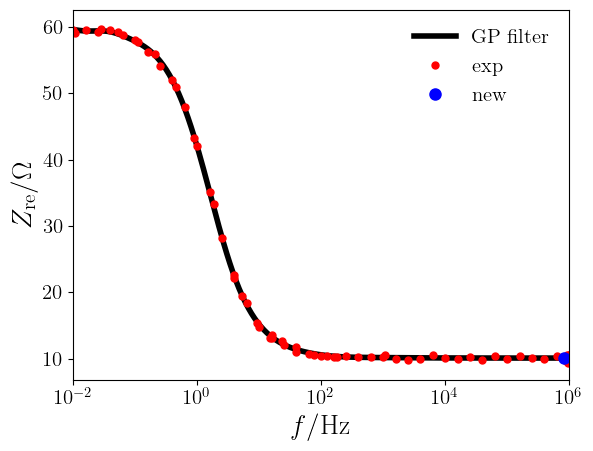

iter =  46 / 100 ; freq_new = 9.0658E+05


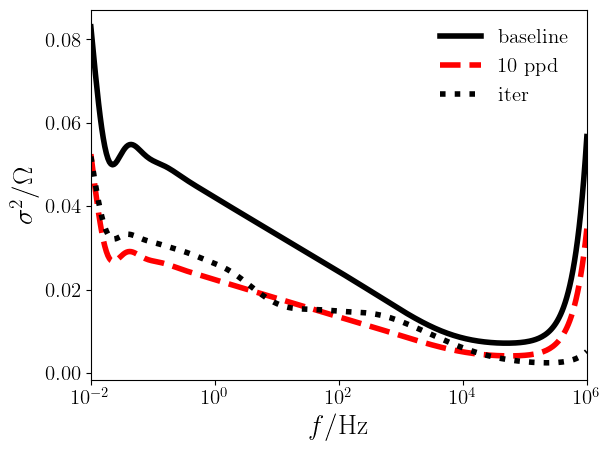

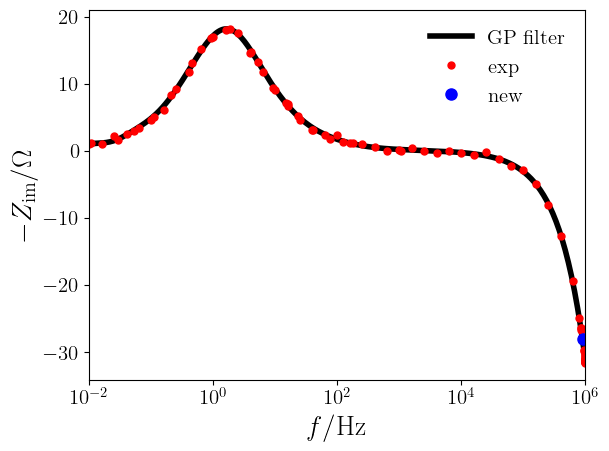

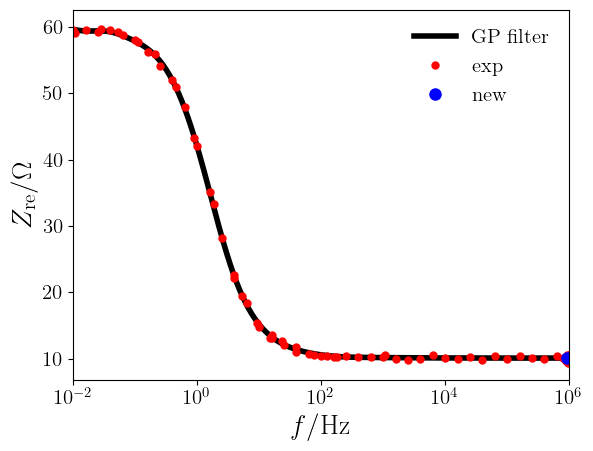

iter =  47 / 100 ; freq_new = 9.1990E+05


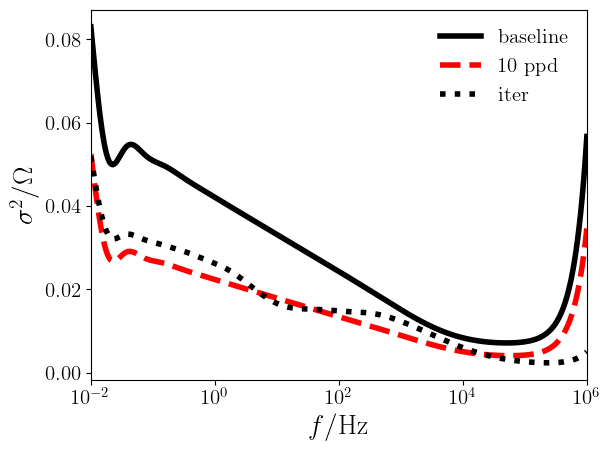

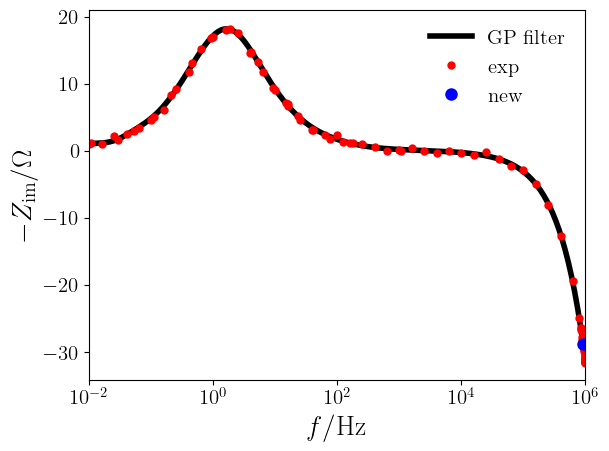

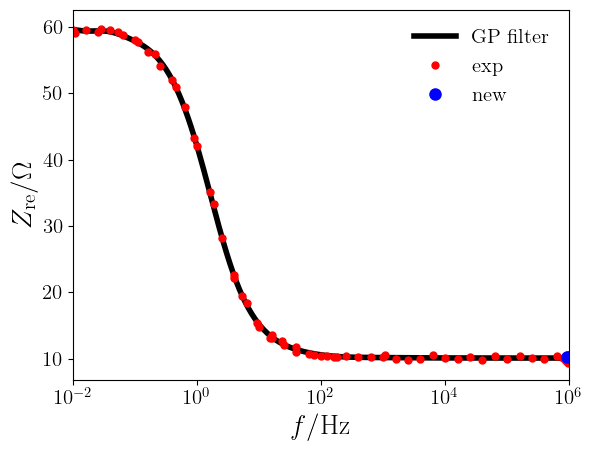

iter =  48 / 100 ; freq_new = 8.9473E+05


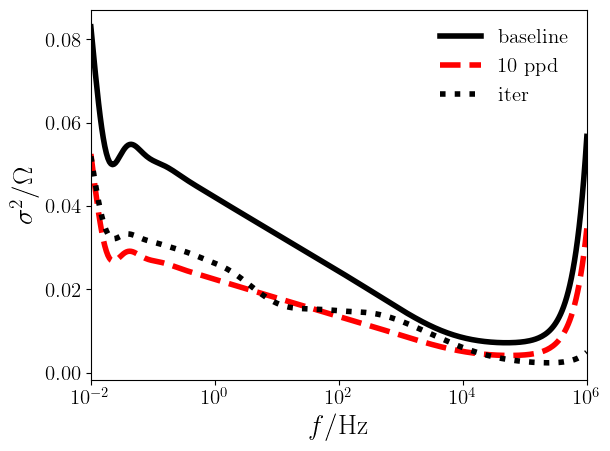

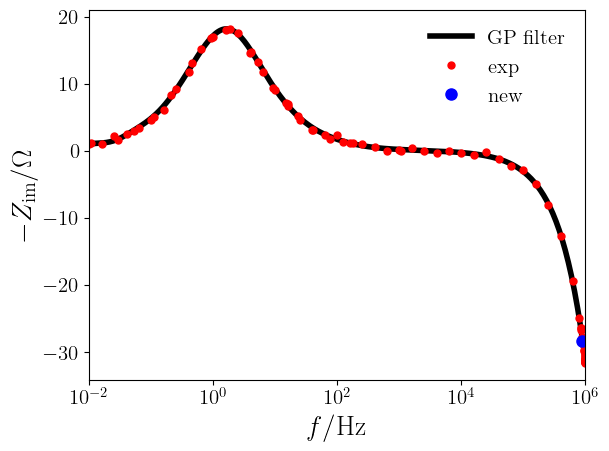

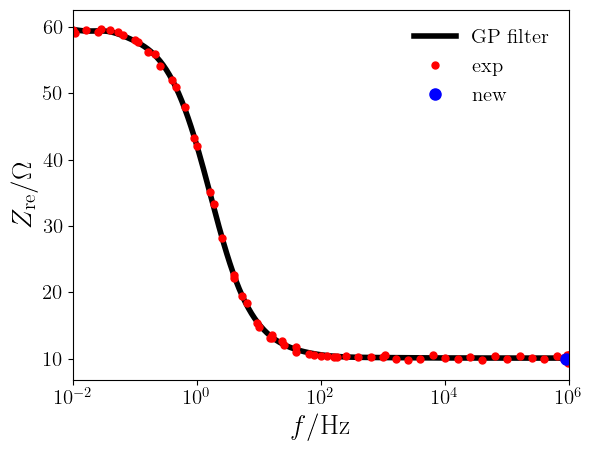

iter =  49 / 100 ; freq_new = 9.2408E+05


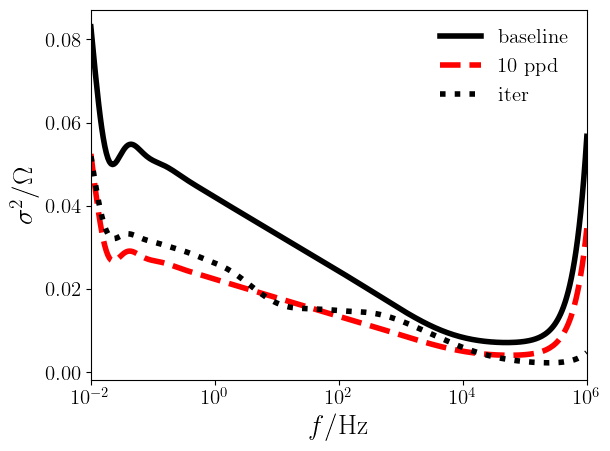

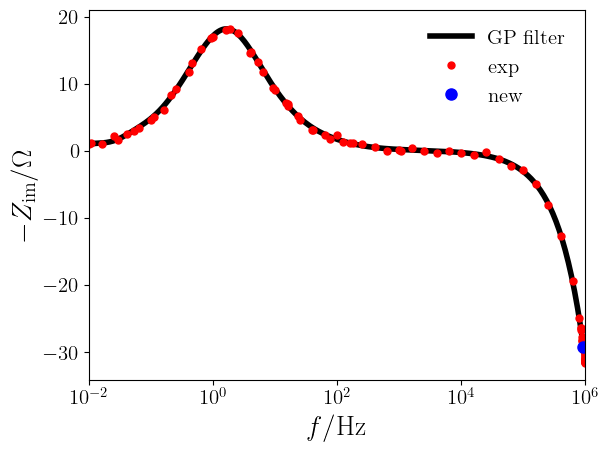

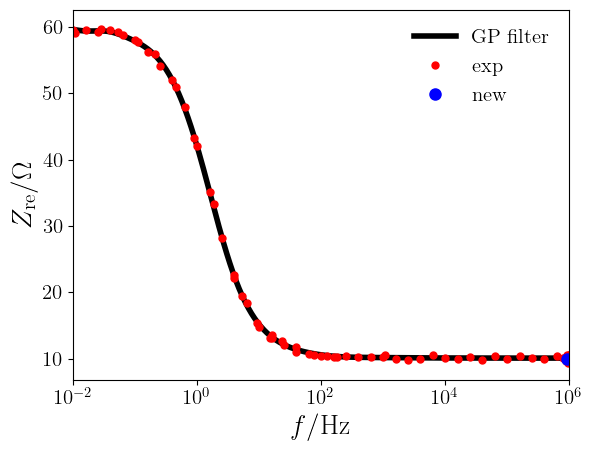

iter =  50 / 100 ; freq_new = 9.2892E+05


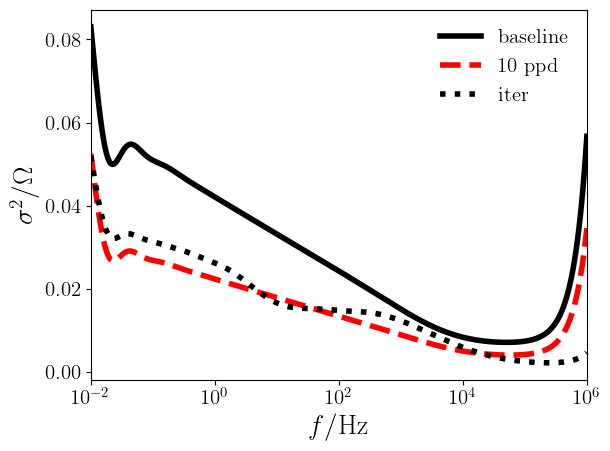

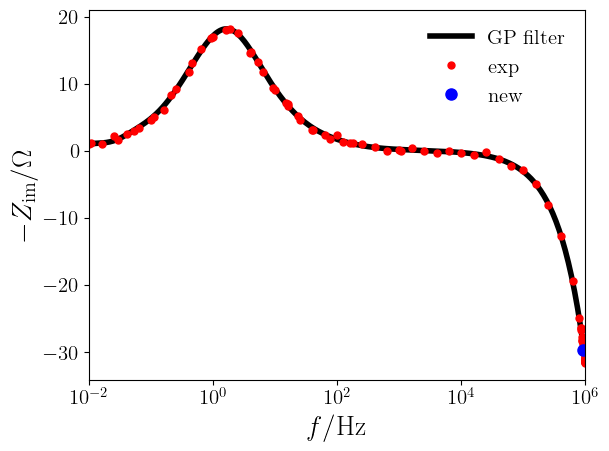

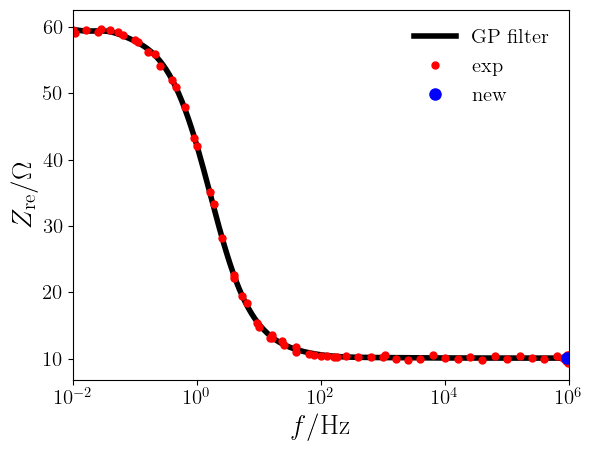

iter =  51 / 100 ; freq_new = 9.6329E+05


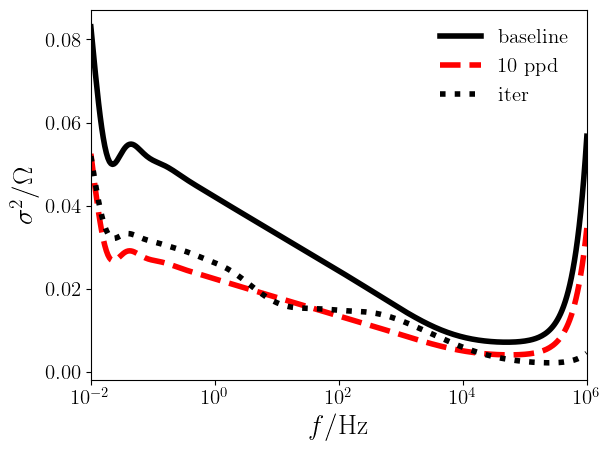

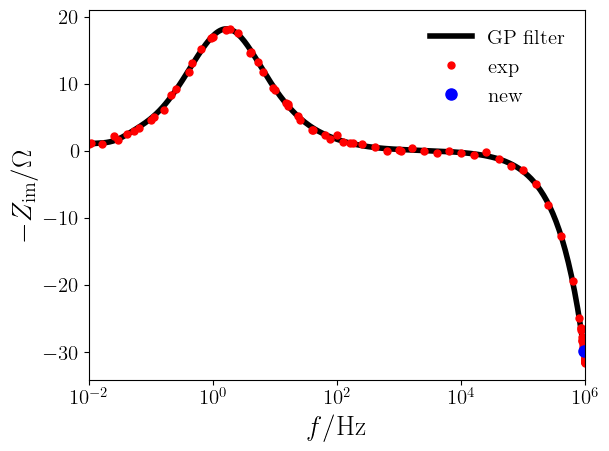

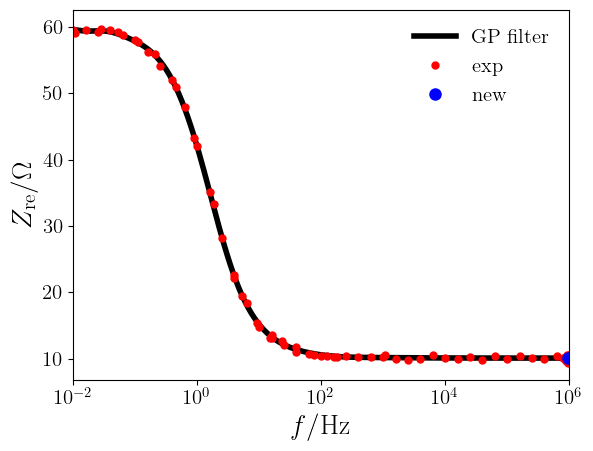

iter =  52 / 100 ; freq_new = 9.9530E+05


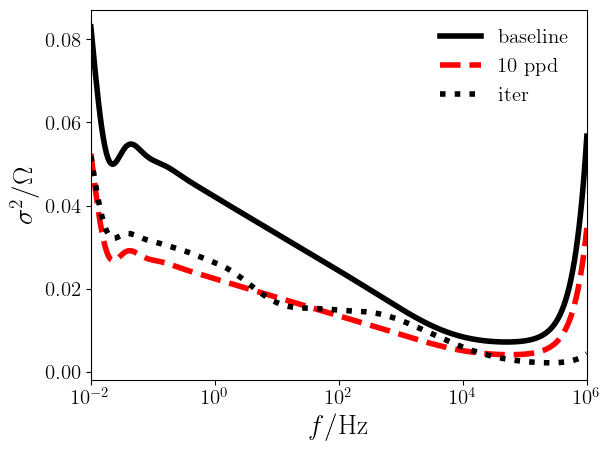

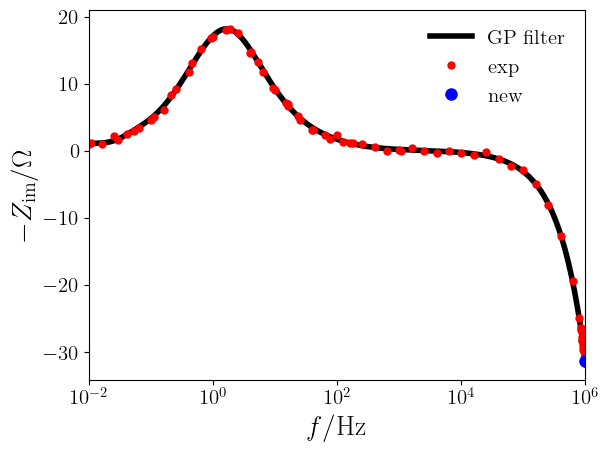

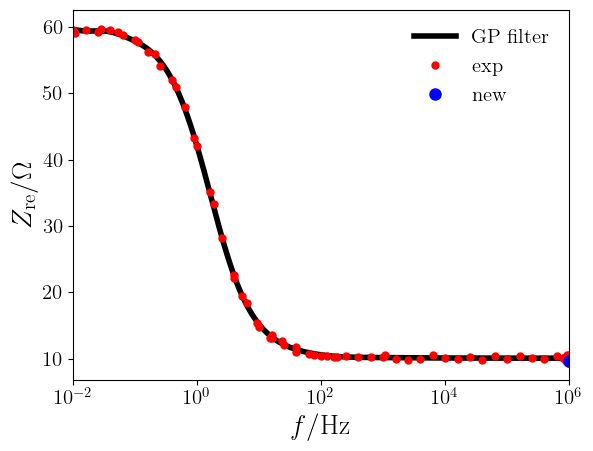

iter =  53 / 100 ; freq_new = 9.9477E+05


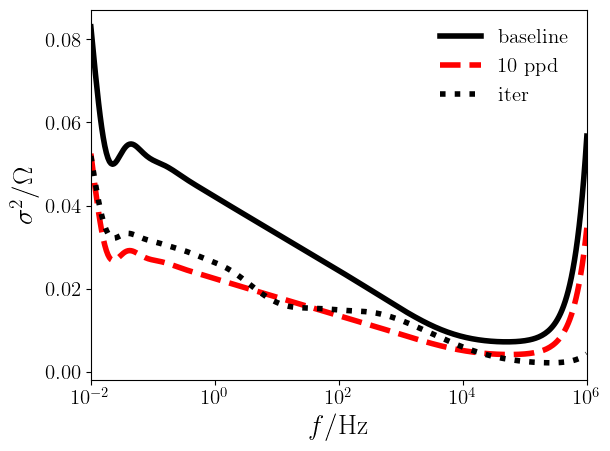

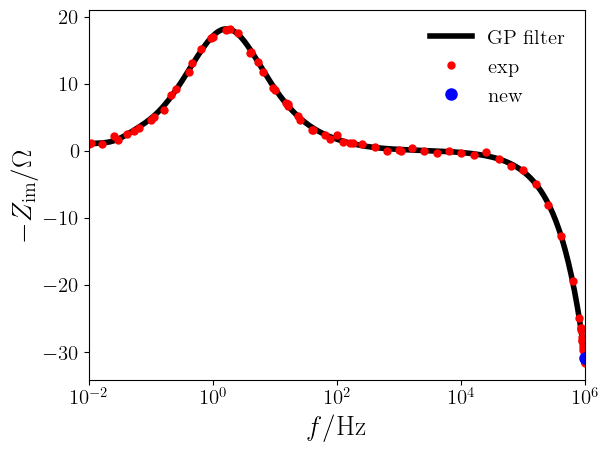

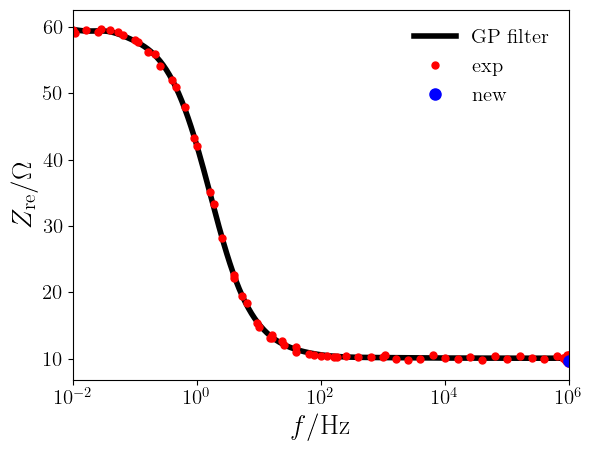

iter =  54 / 100 ; freq_new = 9.9912E+05


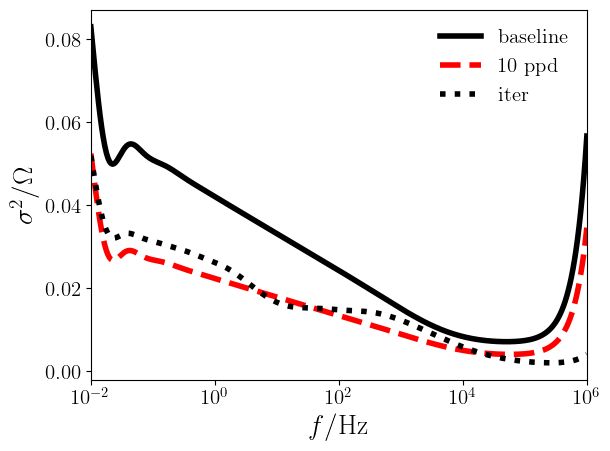

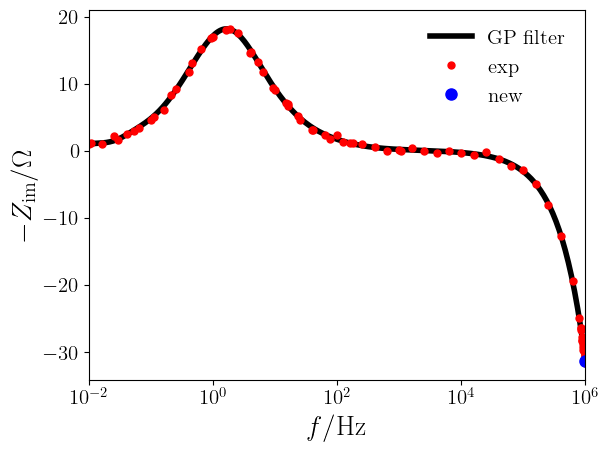

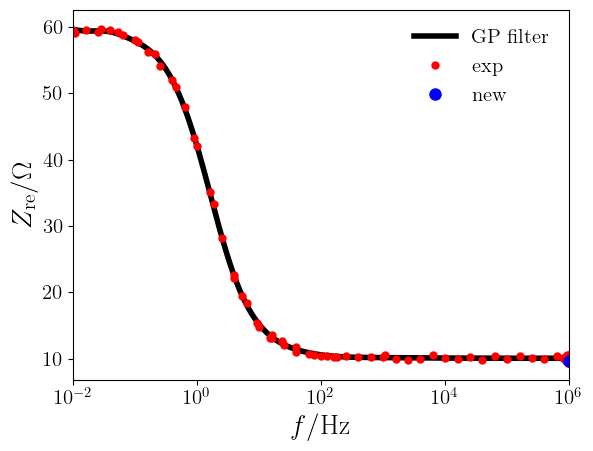

iter =  55 / 100 ; freq_new = 9.9974E+05


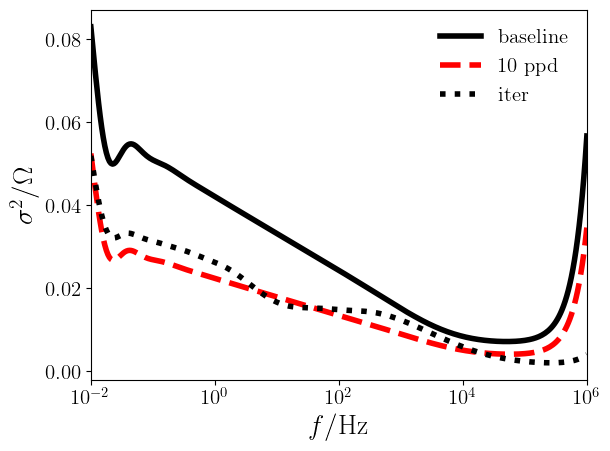

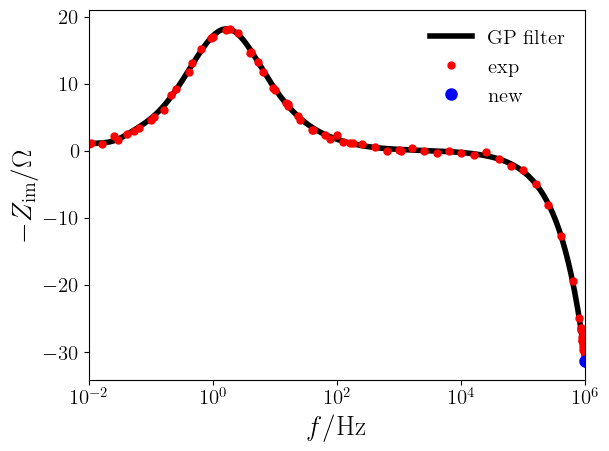

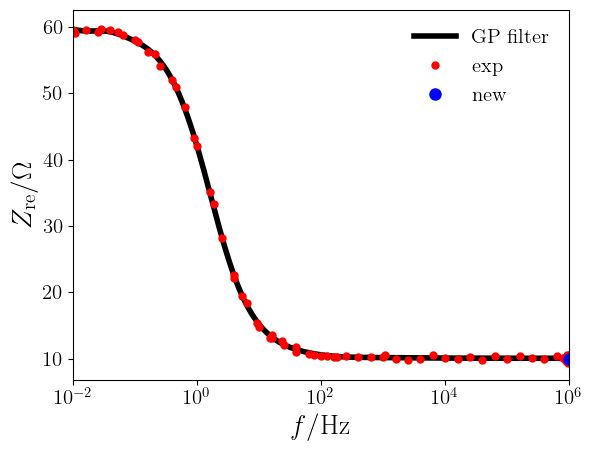

iter =  56 / 100 ; freq_new = 9.9929E+05


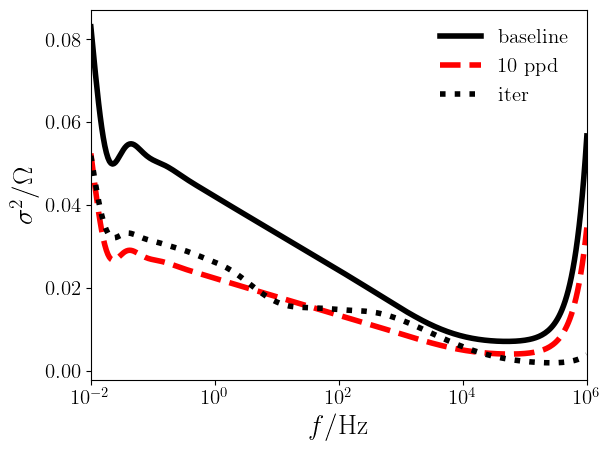

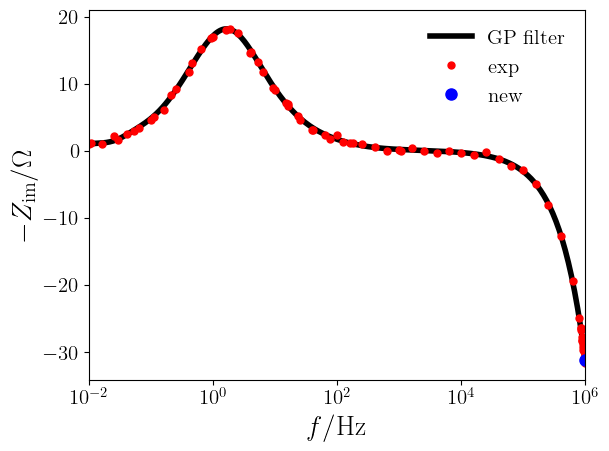

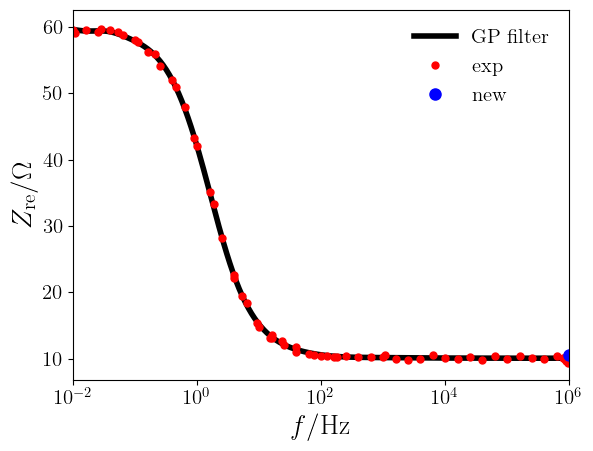

iter =  57 / 100 ; freq_new = 9.9993E+05


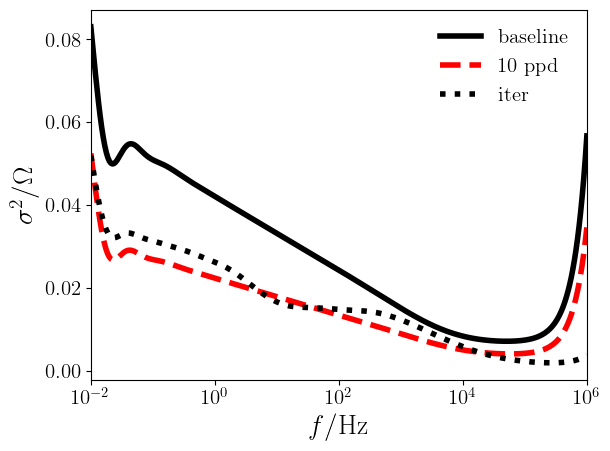

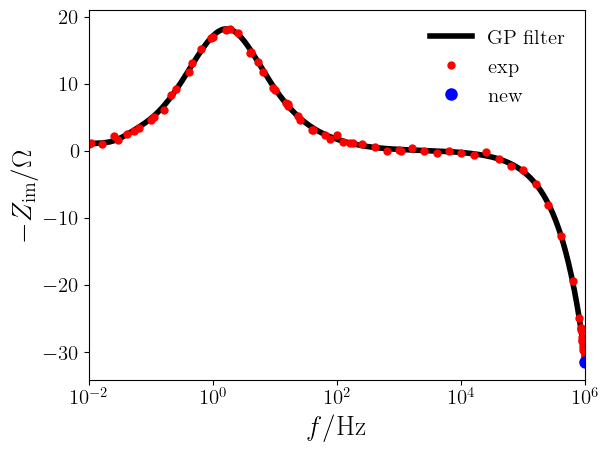

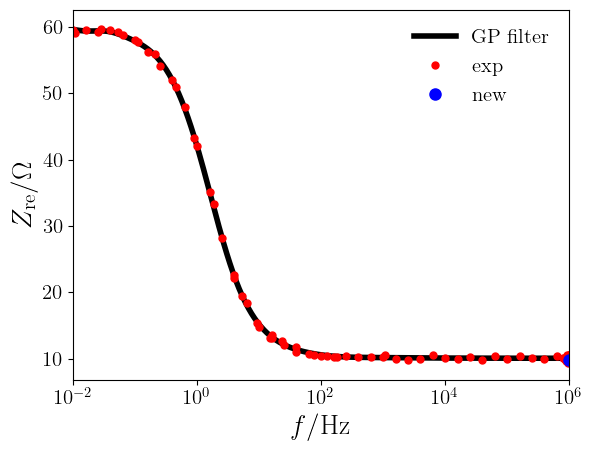

iter =  58 / 100 ; freq_new = 9.9994E+05


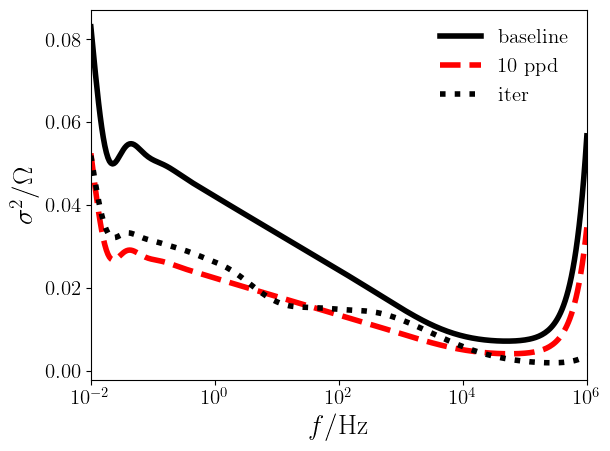

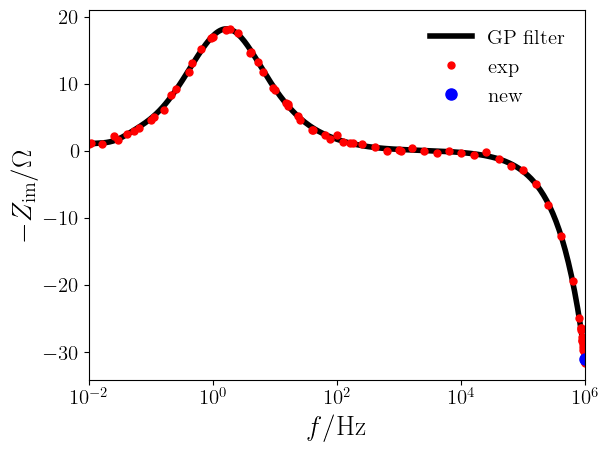

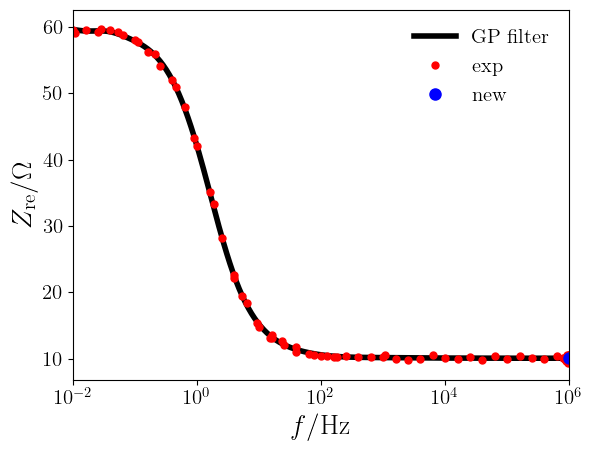

iter =  59 / 100 ; freq_new = 9.9995E+05


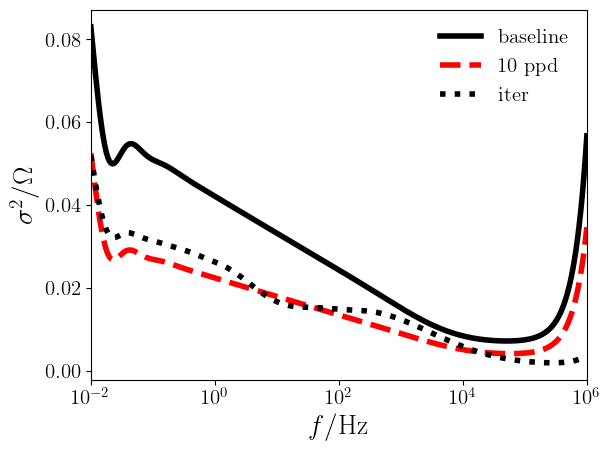

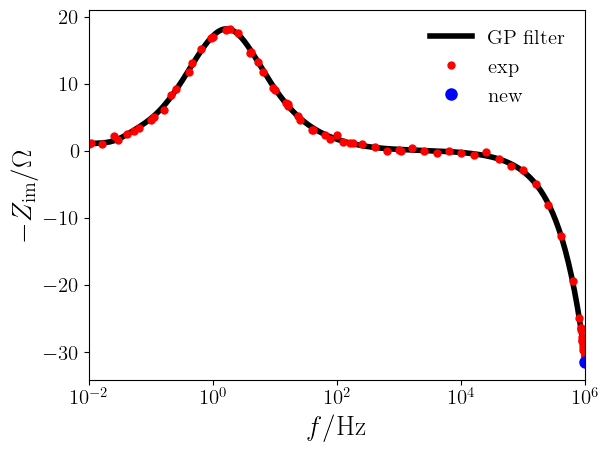

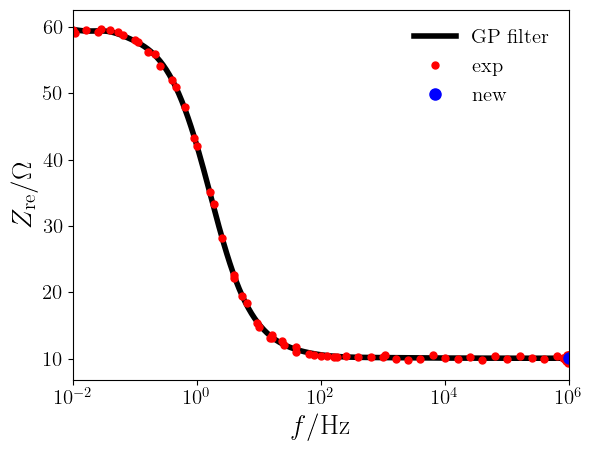

iter =  60 / 100 ; freq_new = 9.9997E+05


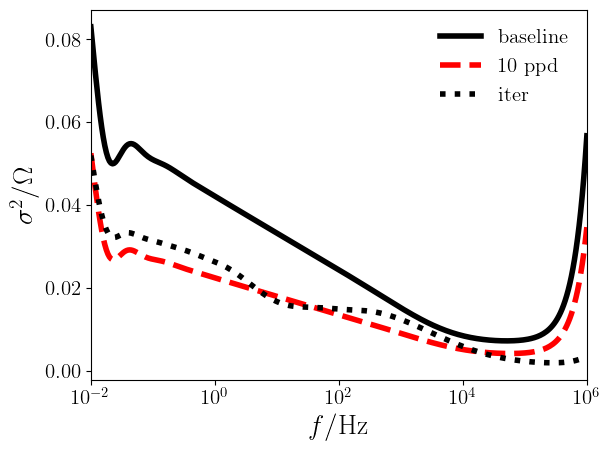

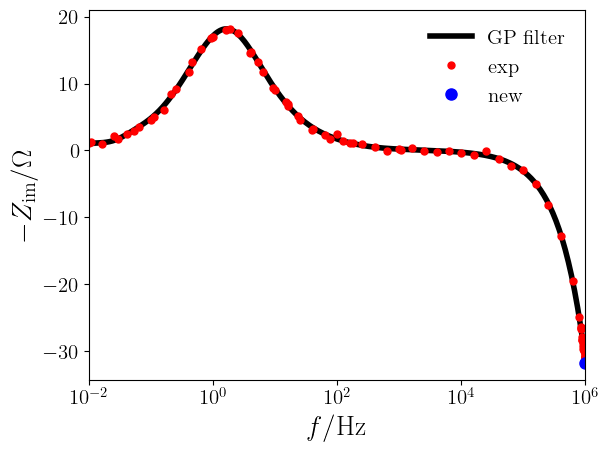

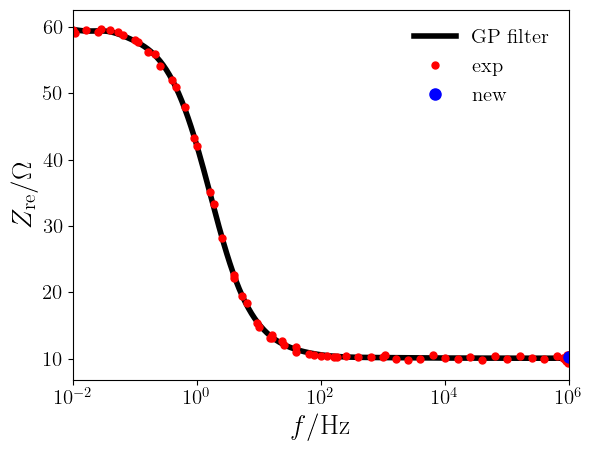

iter =  61 / 100 ; freq_new = 9.9999E+05


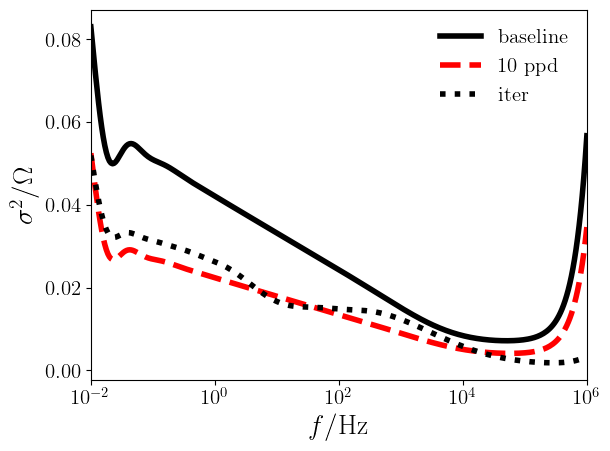

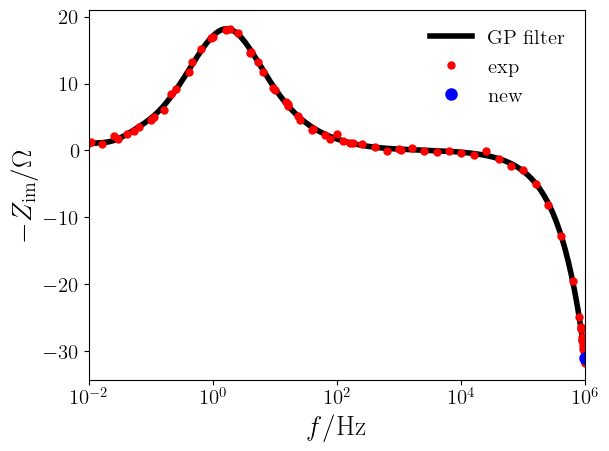

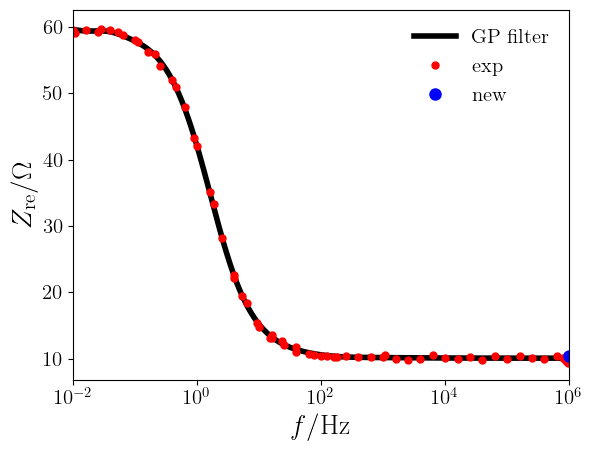

iter =  62 / 100 ; freq_new = 1.0000E+06


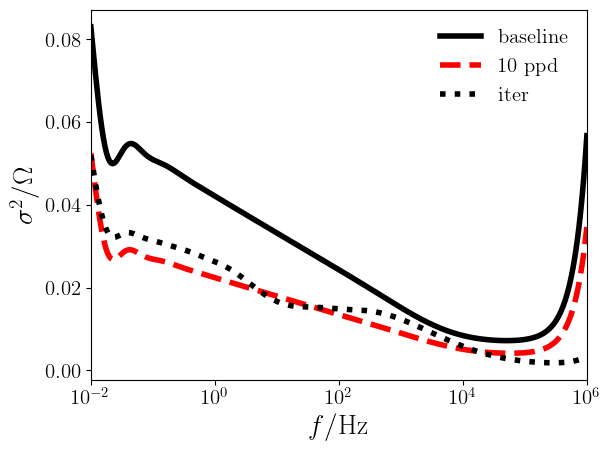

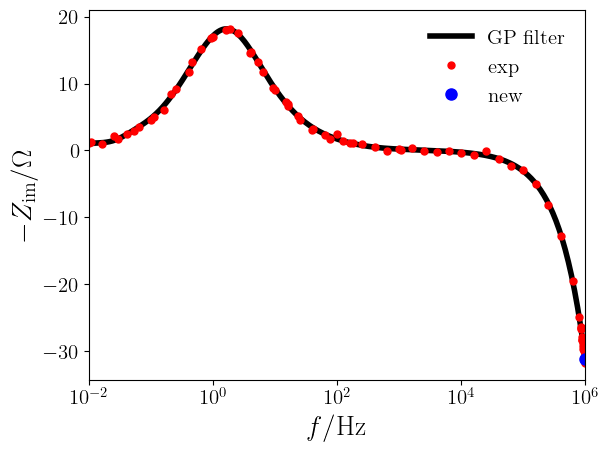

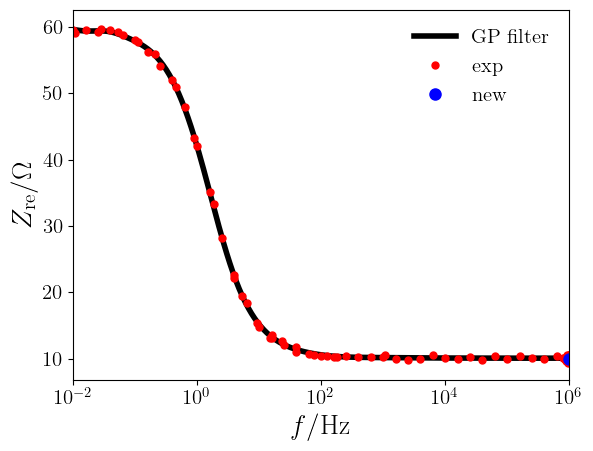

iter =  63 / 100 ; freq_new = 1.0000E+06


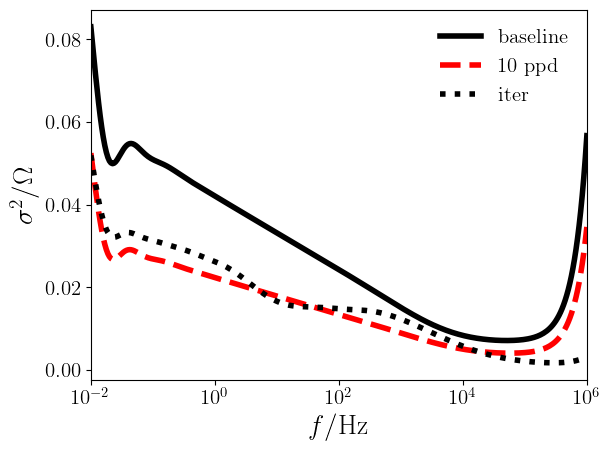

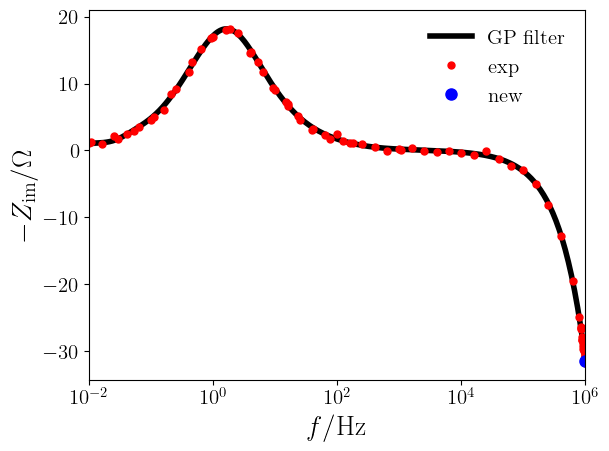

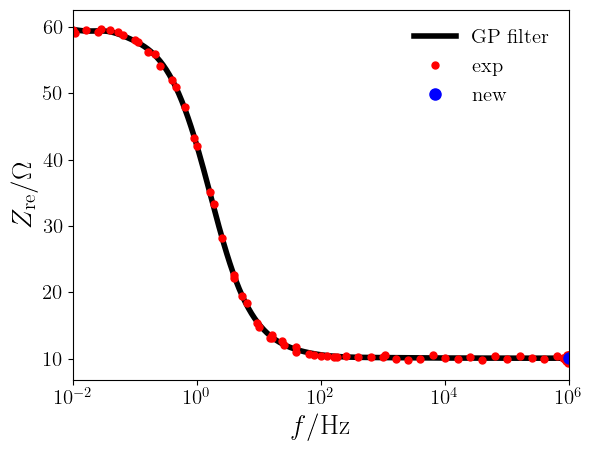

iter =  64 / 100 ; freq_new = 1.0000E+06


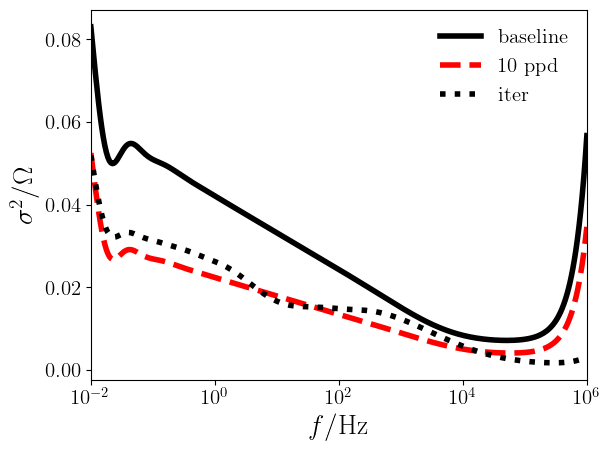

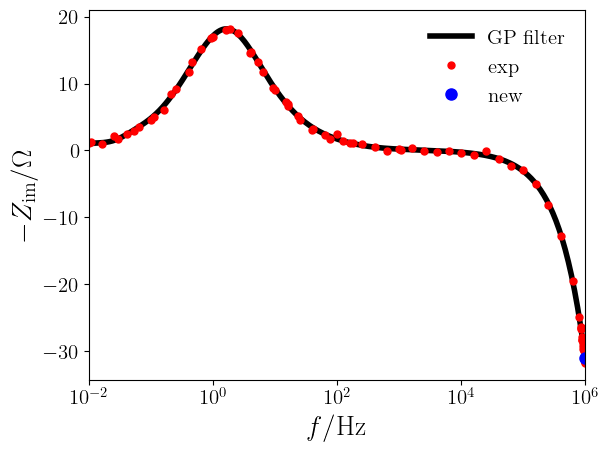

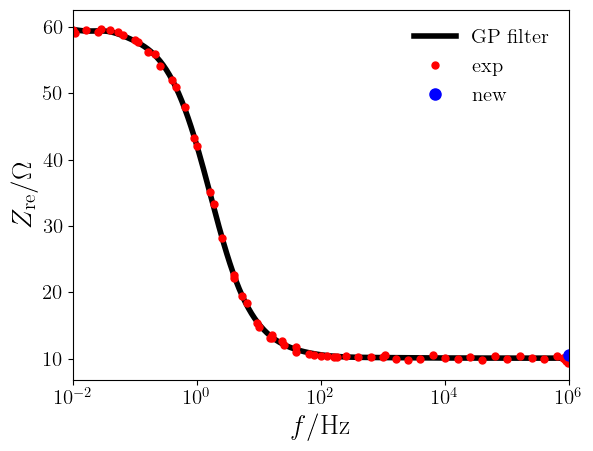

iter =  65 / 100 ; freq_new = 1.0000E+06


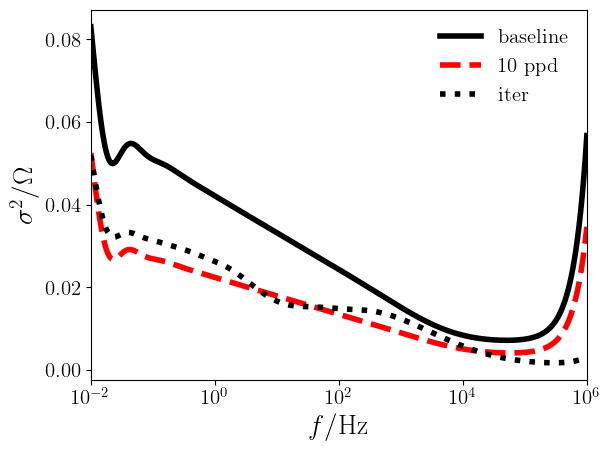

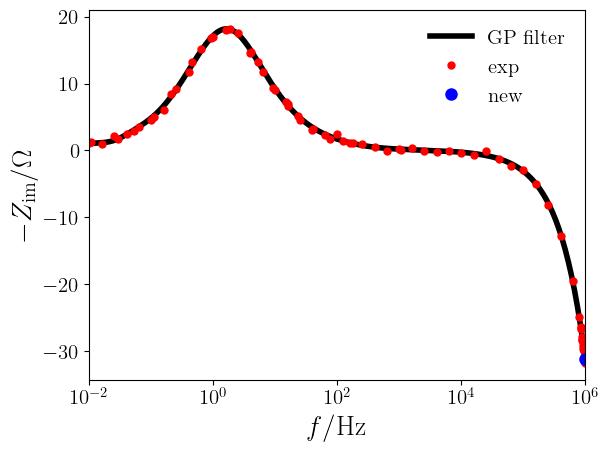

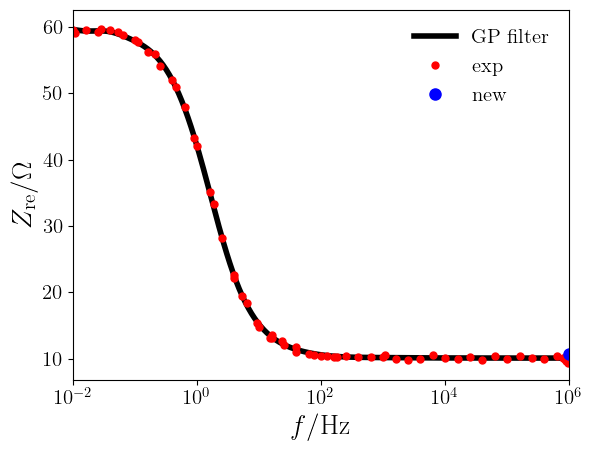

iter =  66 / 100 ; freq_new = 1.0000E+06


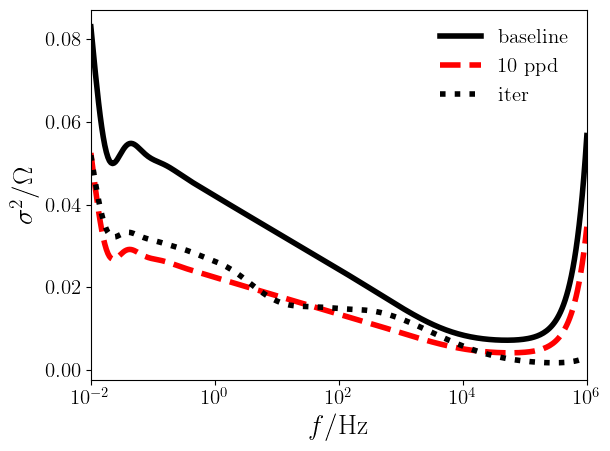

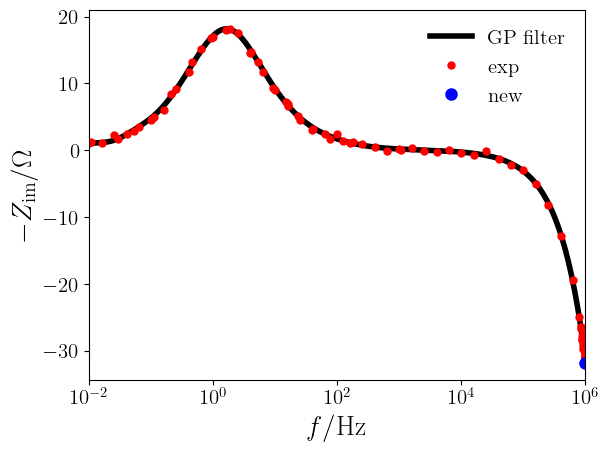

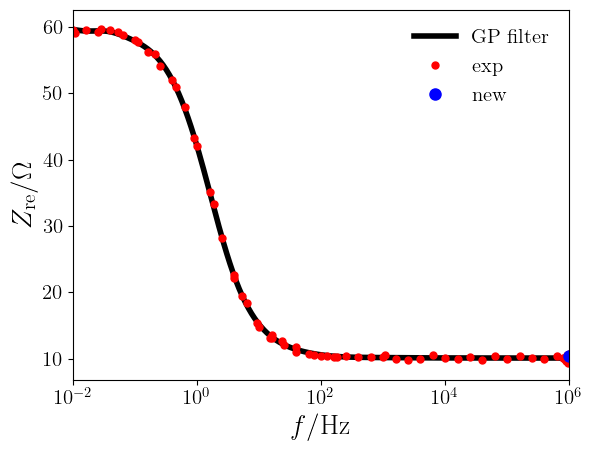

iter =  67 / 100 ; freq_new = 1.0000E+06


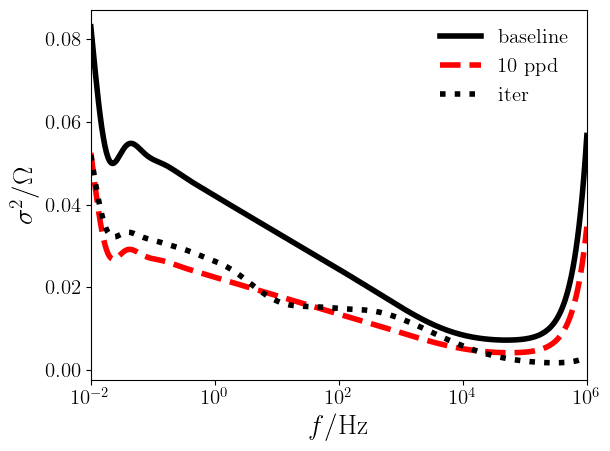

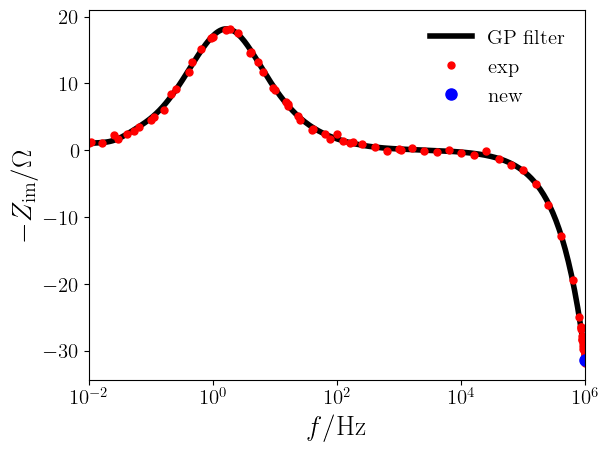

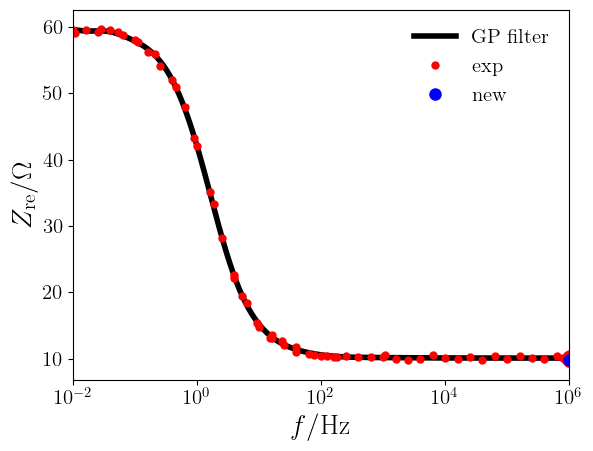

iter =  68 / 100 ; freq_new = 1.0000E+06


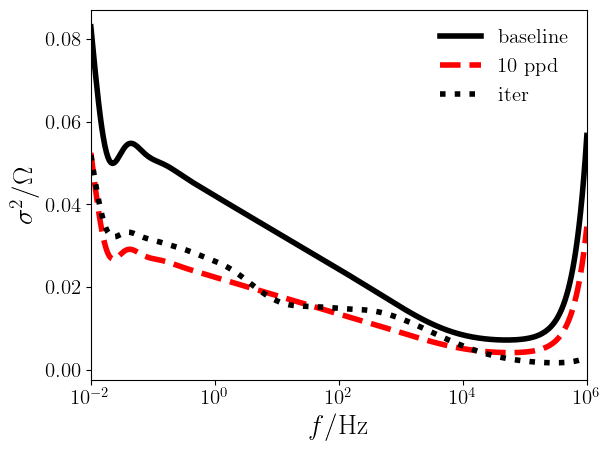

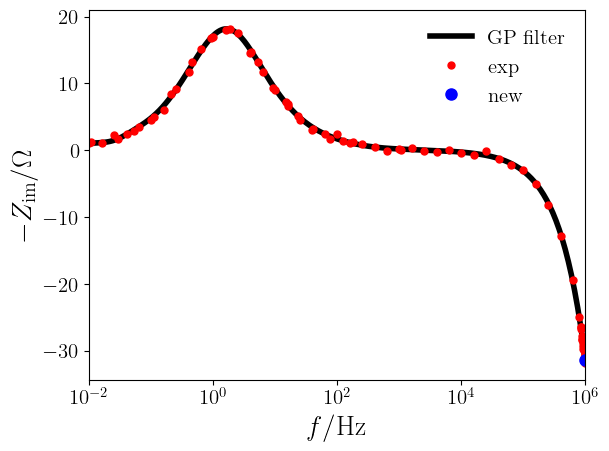

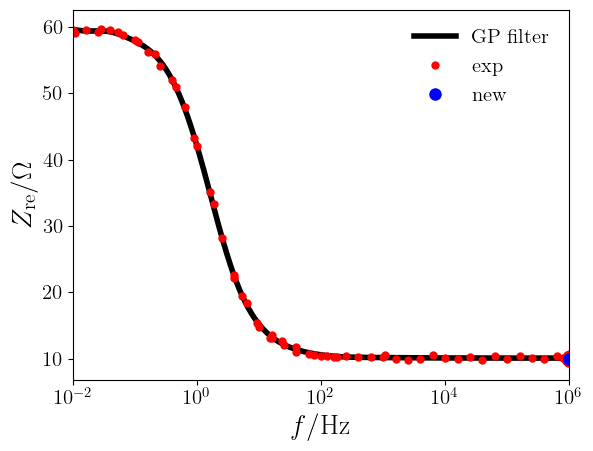

iter =  69 / 100 ; freq_new = 1.0000E+06


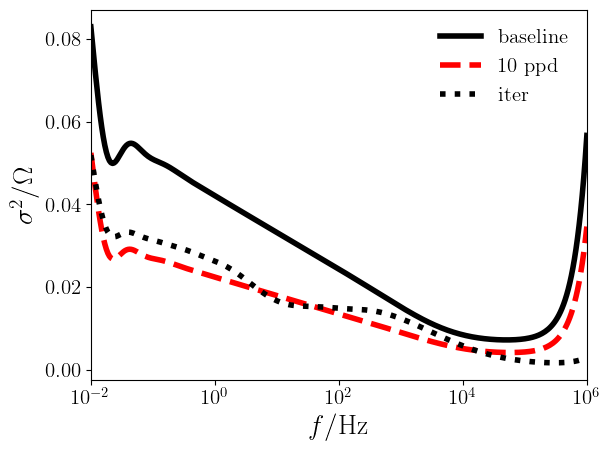

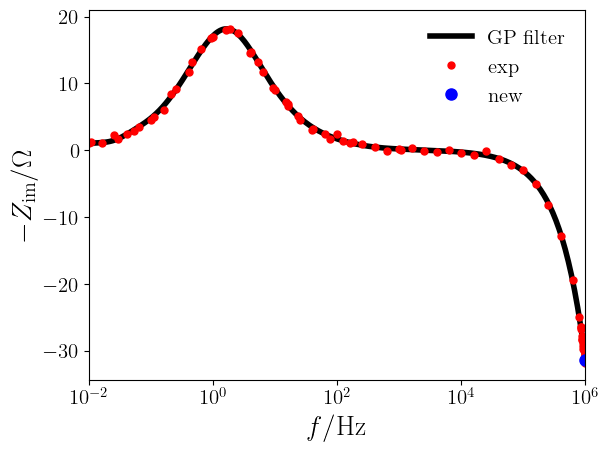

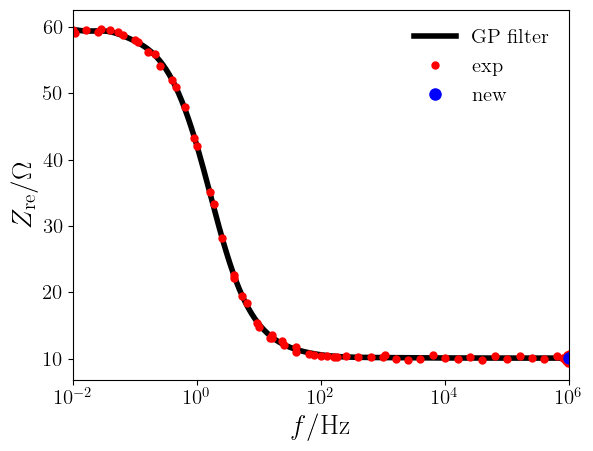

iter =  70 / 100 ; freq_new = 1.0000E+06


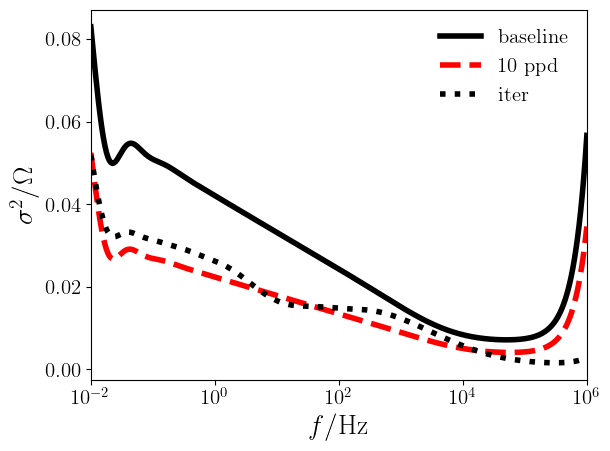

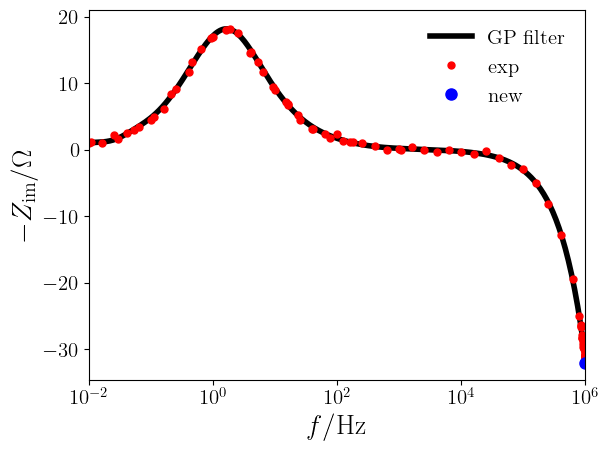

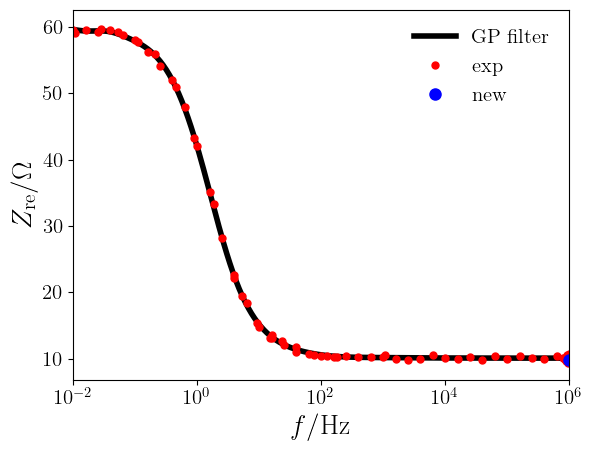

iter =  71 / 100 ; freq_new = 1.0000E+06


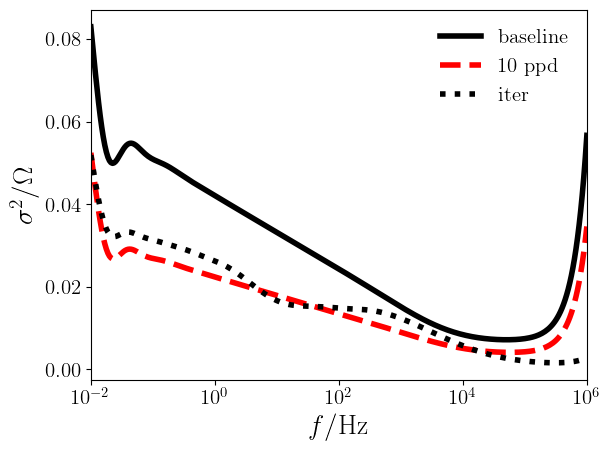

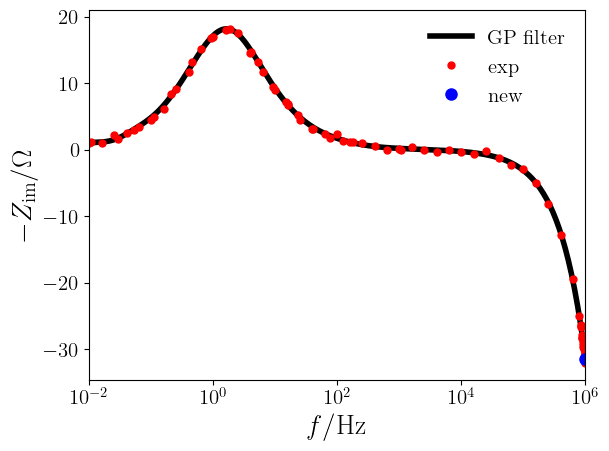

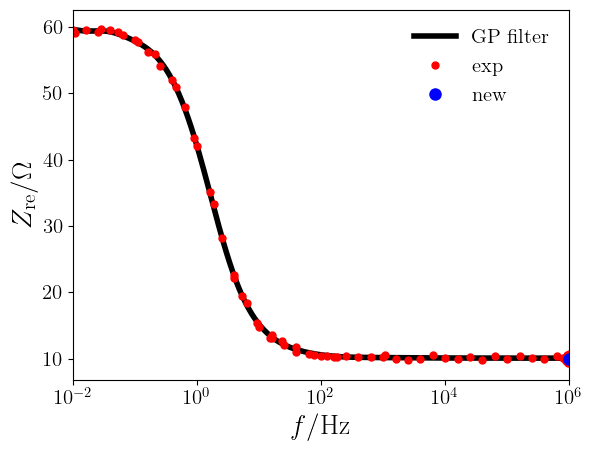

iter =  72 / 100 ; freq_new = 6.4354E+05


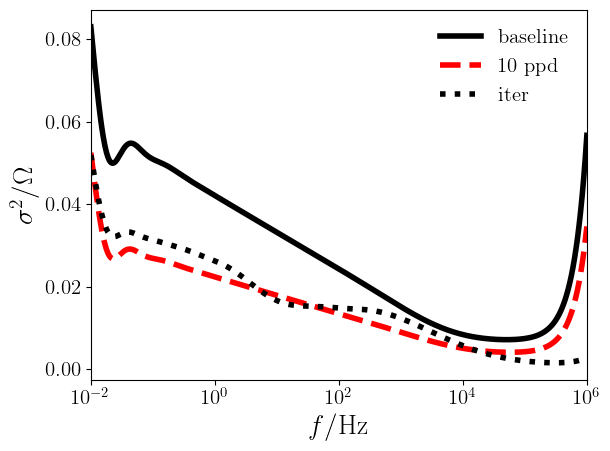

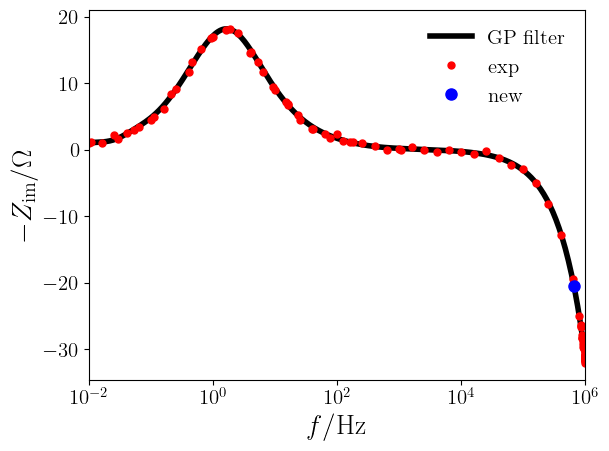

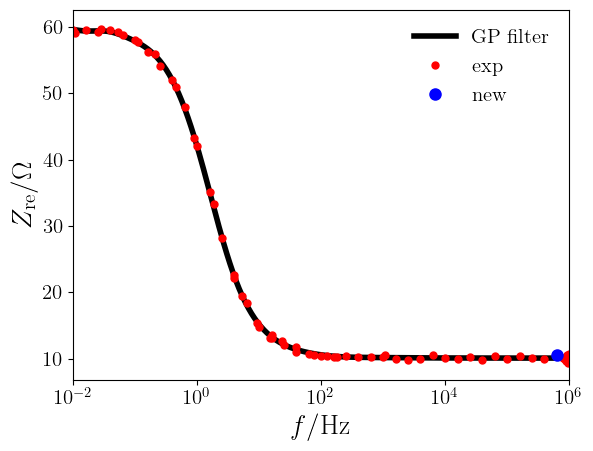

iter =  73 / 100 ; freq_new = 7.6707E+05


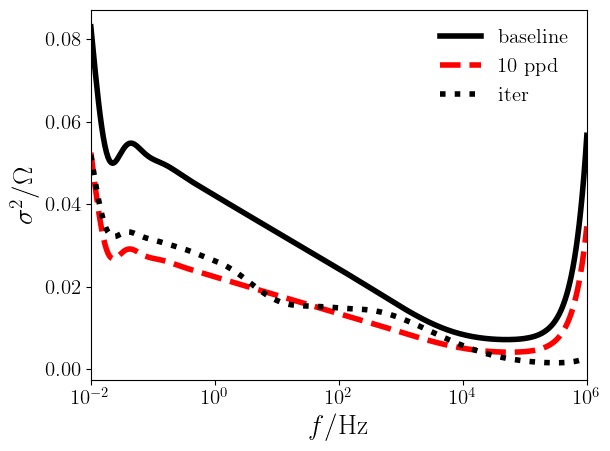

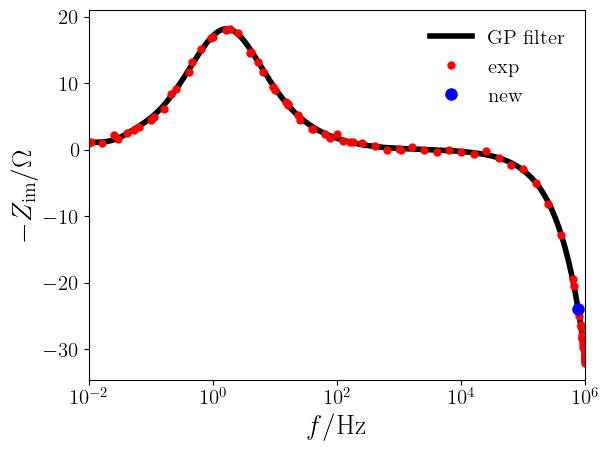

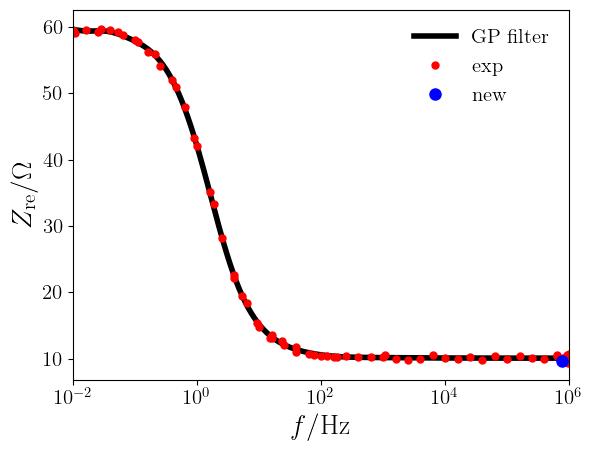

iter =  74 / 100 ; freq_new = 8.7737E+05


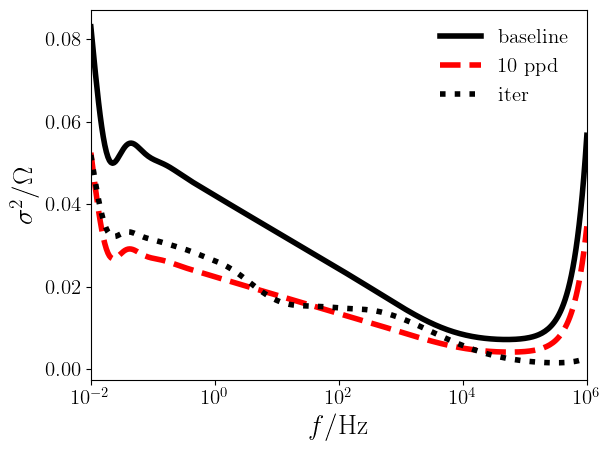

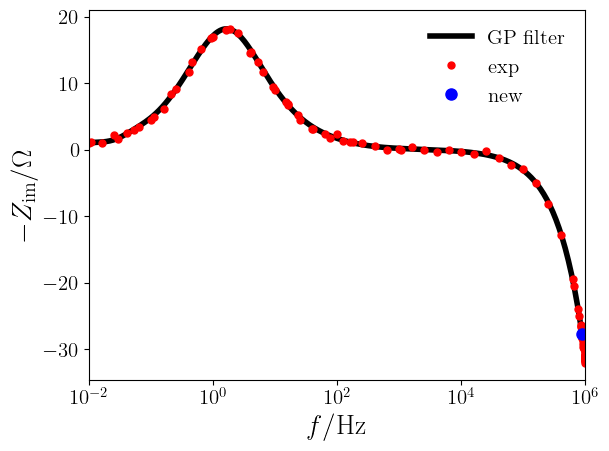

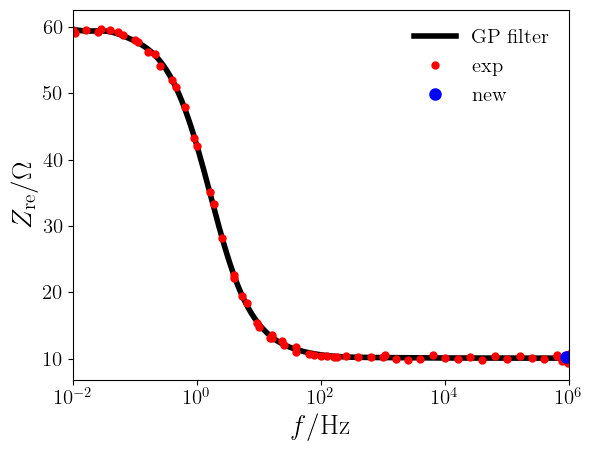

iter =  75 / 100 ; freq_new = 6.4201E+05


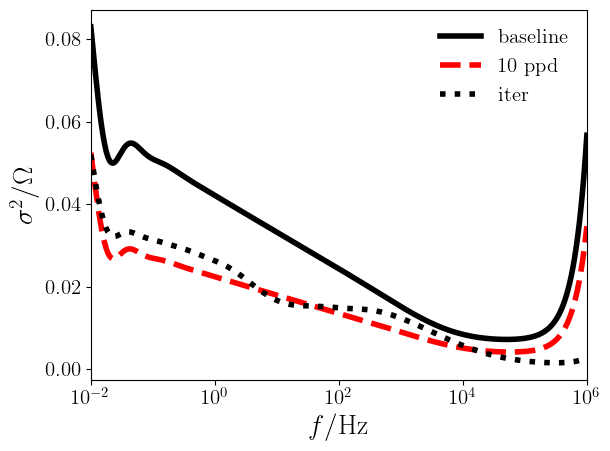

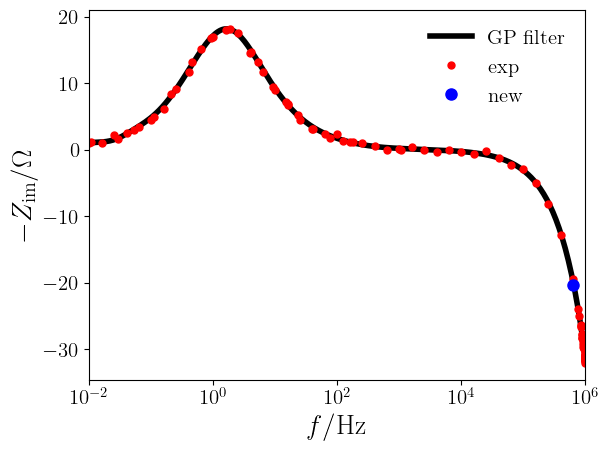

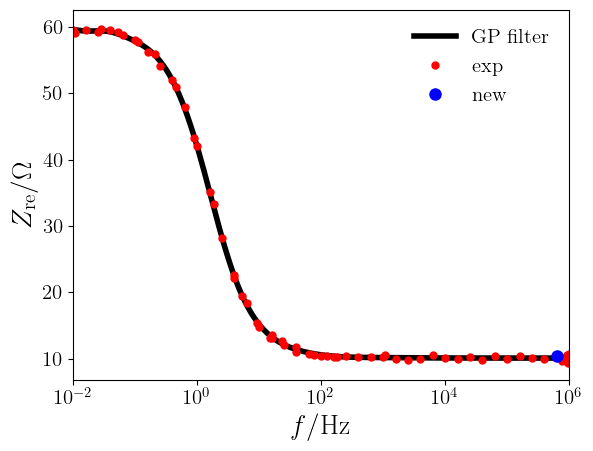

iter =  76 / 100 ; freq_new = 7.6731E+05


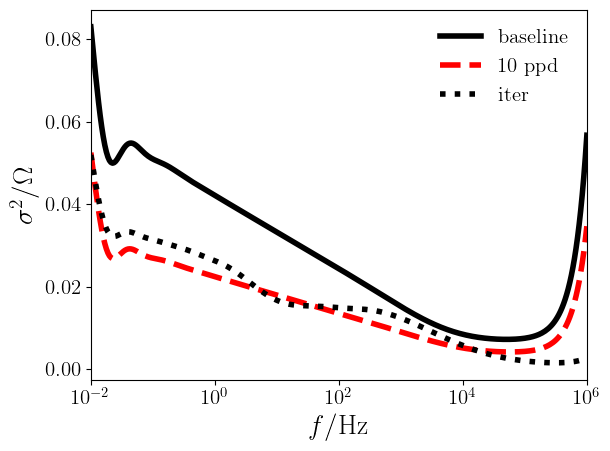

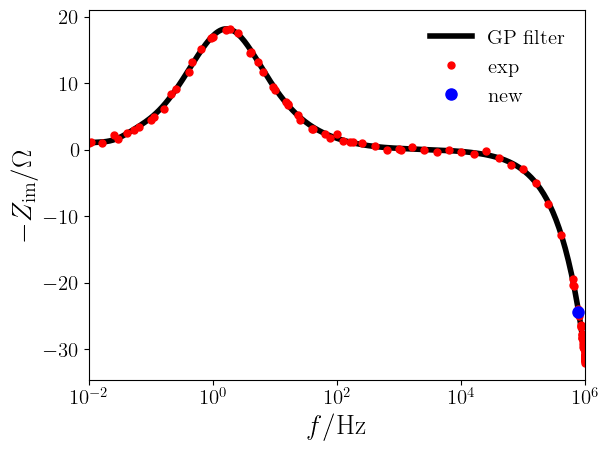

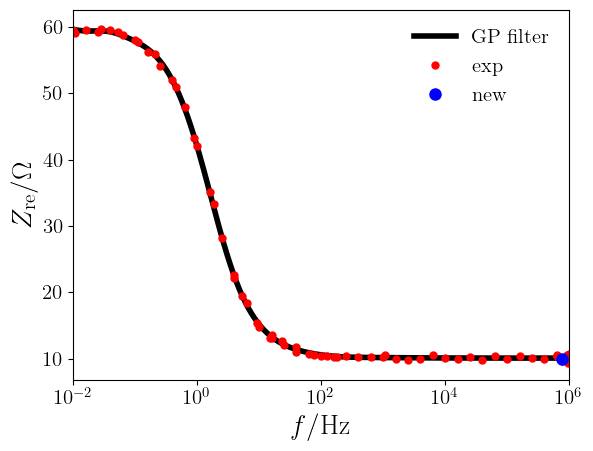

iter =  77 / 100 ; freq_new = 6.5800E+05


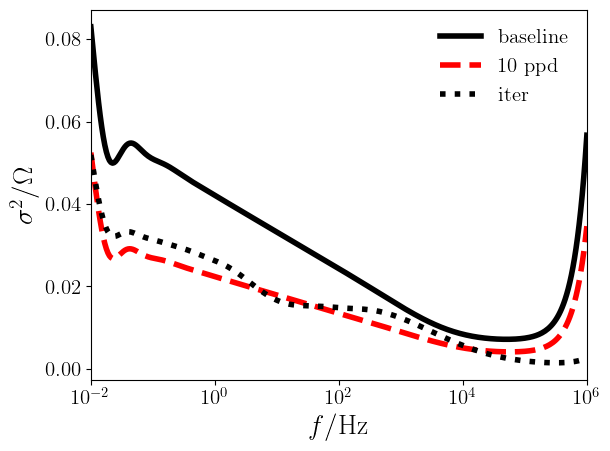

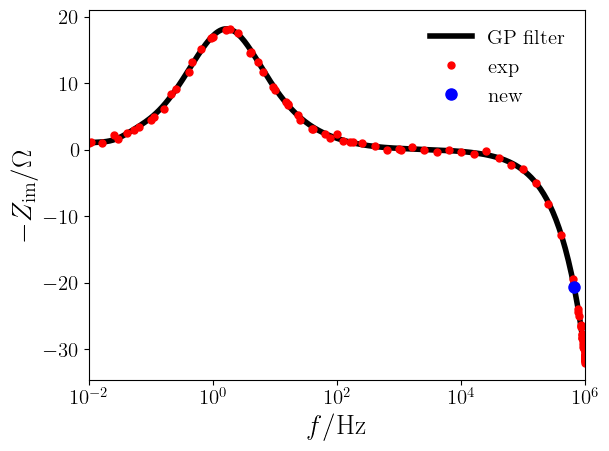

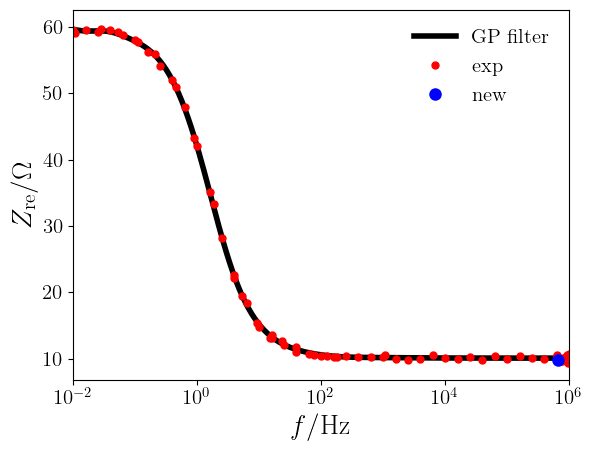

iter =  78 / 100 ; freq_new = 6.5236E+05


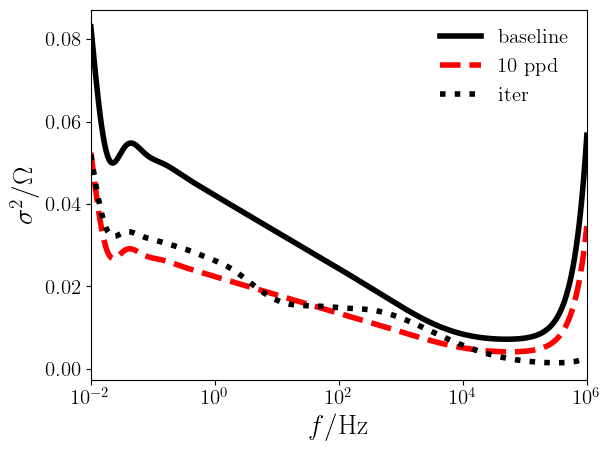

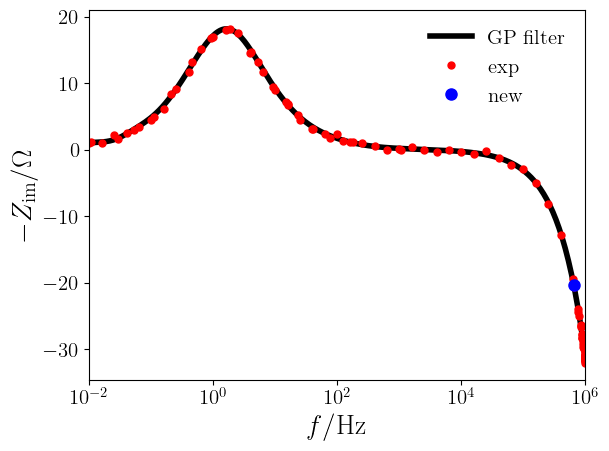

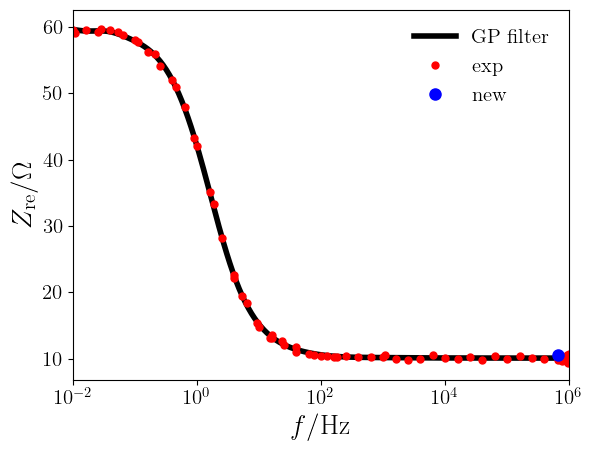

iter =  79 / 100 ; freq_new = 5.5320E+05


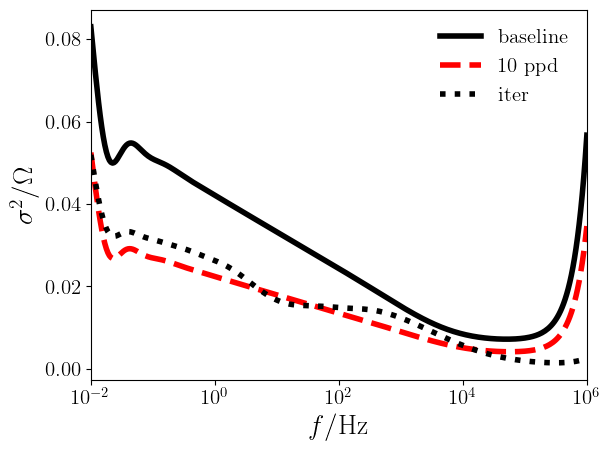

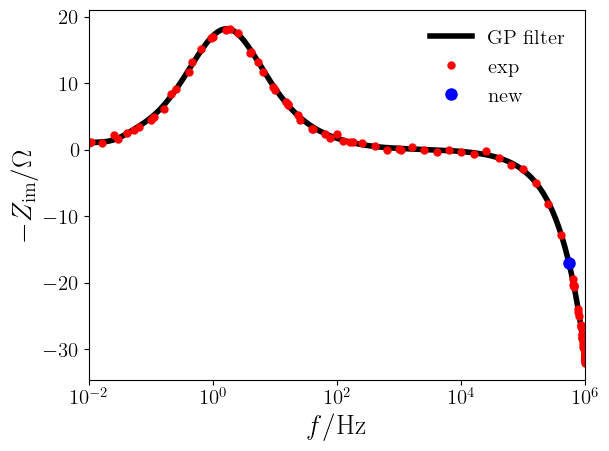

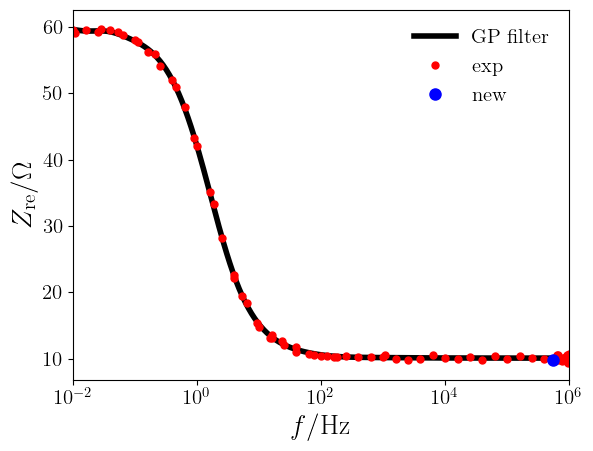

iter =  80 / 100 ; freq_new = 7.6721E+05


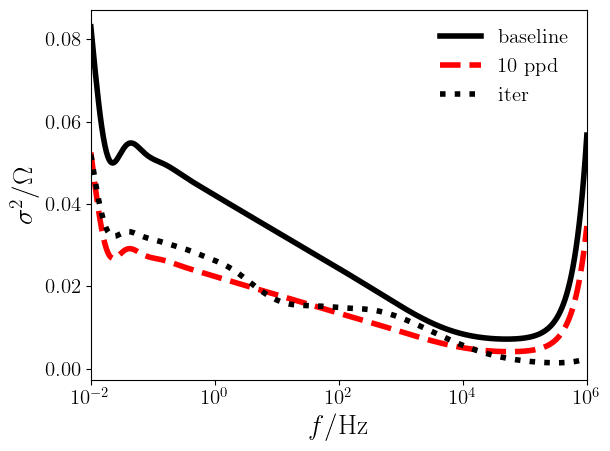

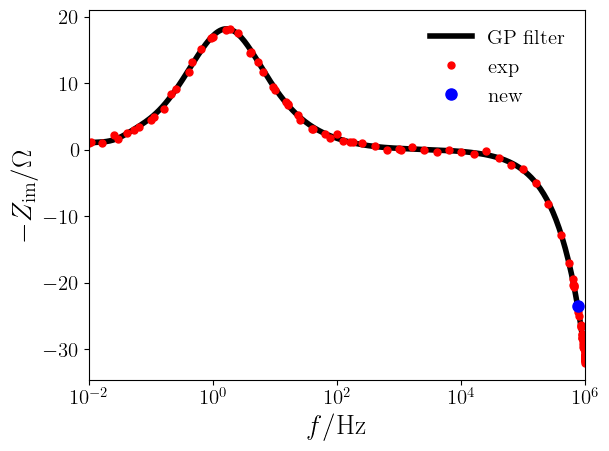

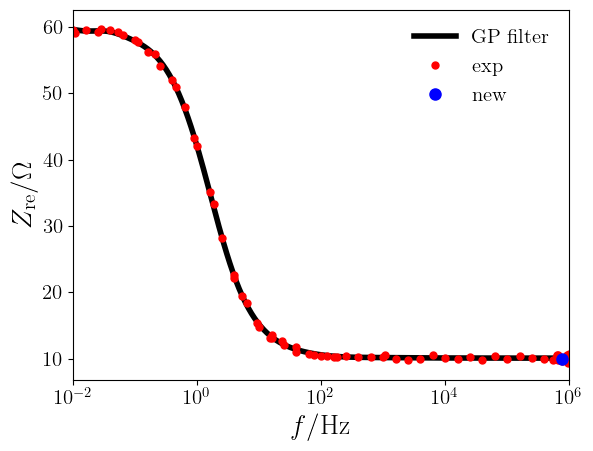

iter =  81 / 100 ; freq_new = 6.5886E+05


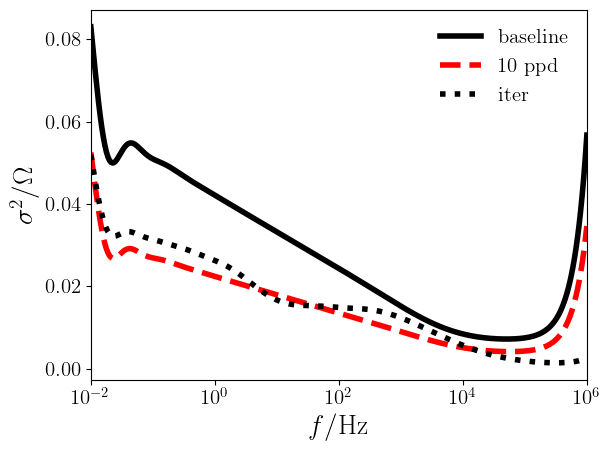

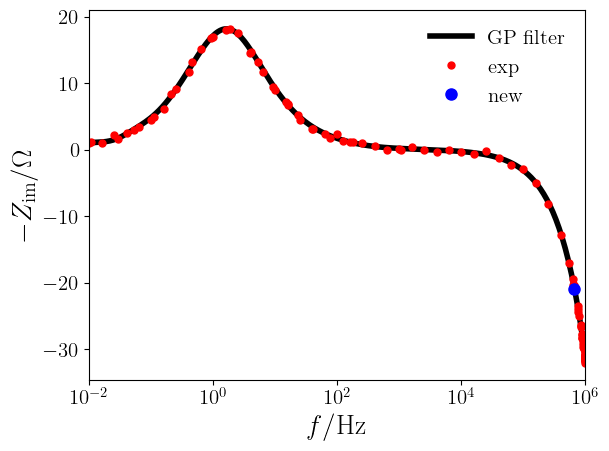

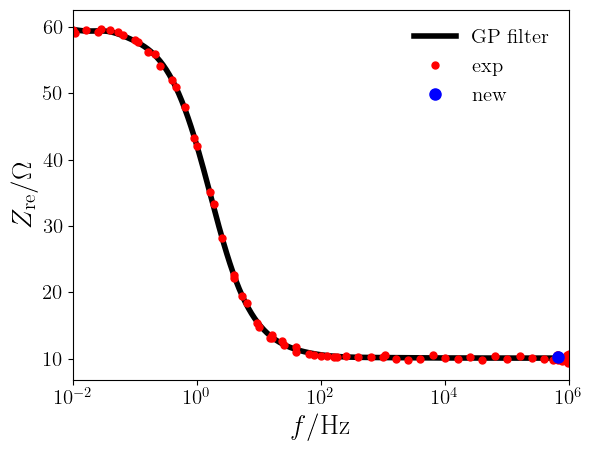

iter =  82 / 100 ; freq_new = 6.2382E+05


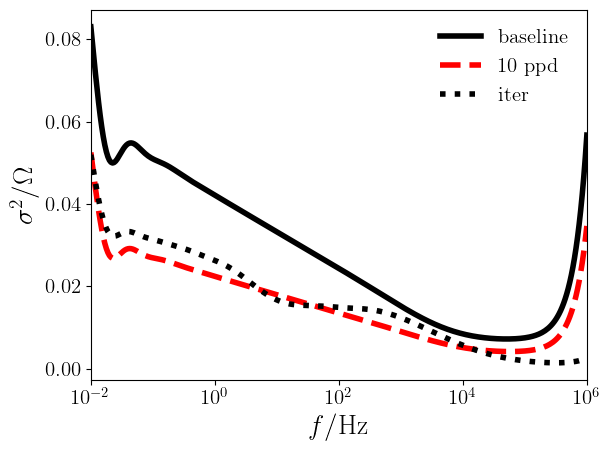

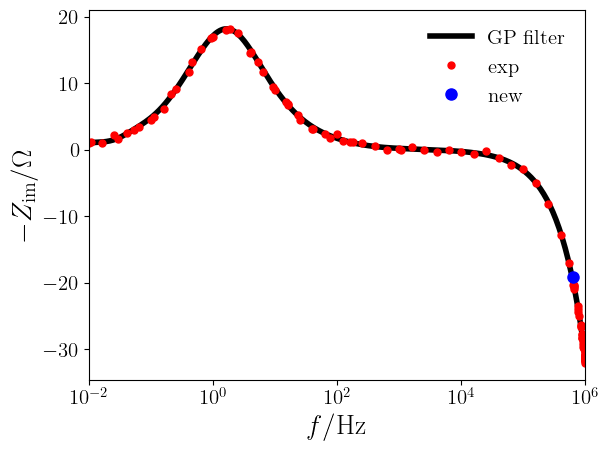

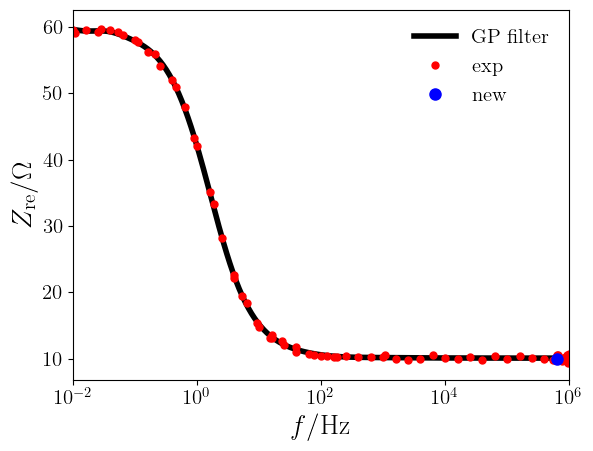

iter =  83 / 100 ; freq_new = 6.3989E+05


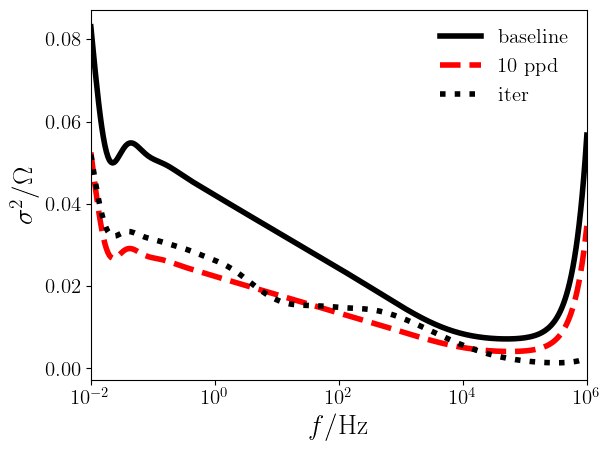

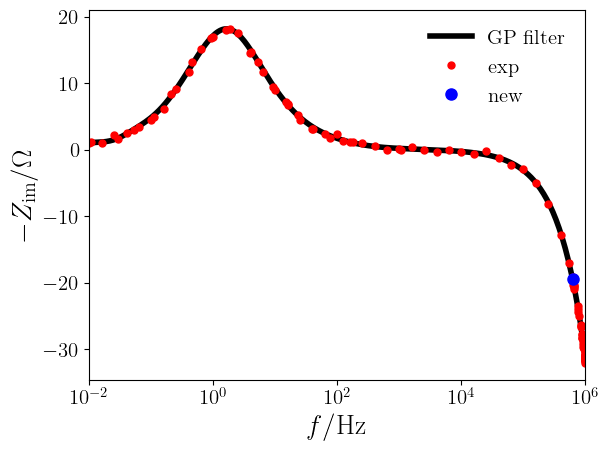

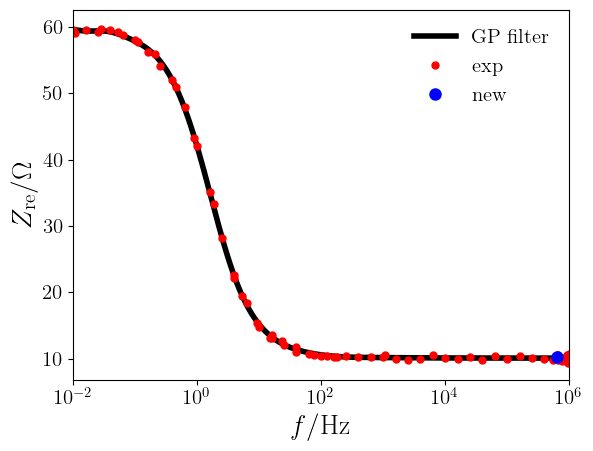

iter =  84 / 100 ; freq_new = 6.5192E+05


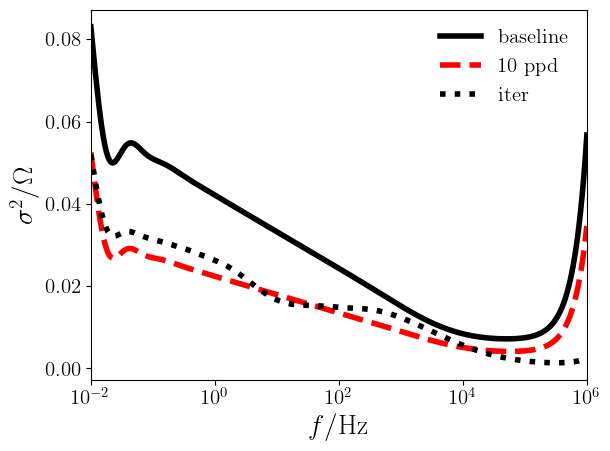

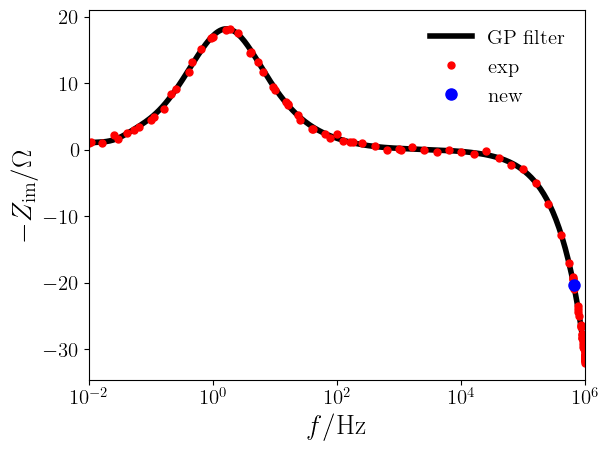

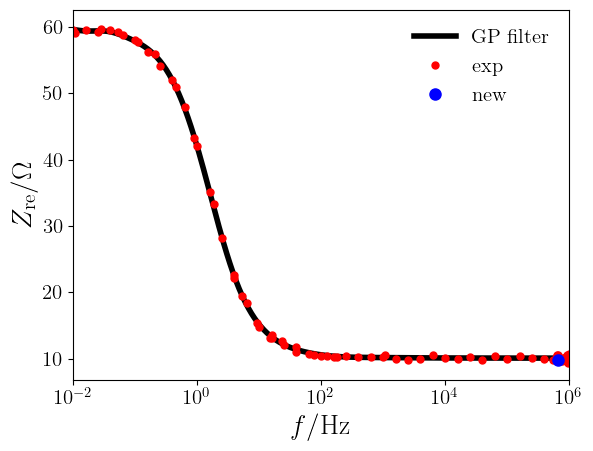

iter =  85 / 100 ; freq_new = 5.7500E+05


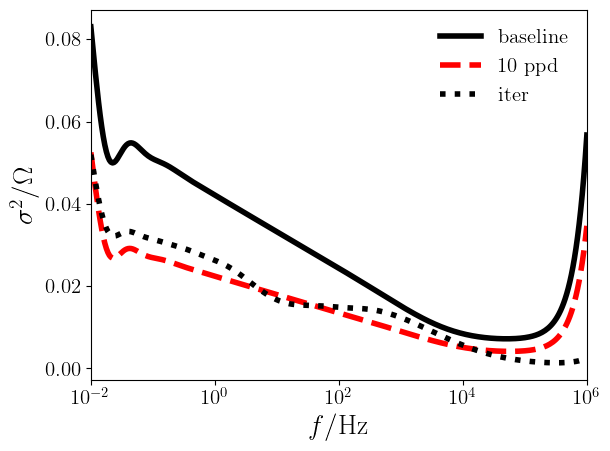

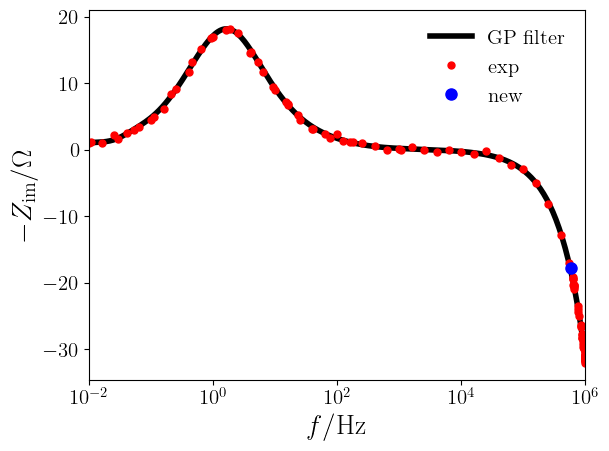

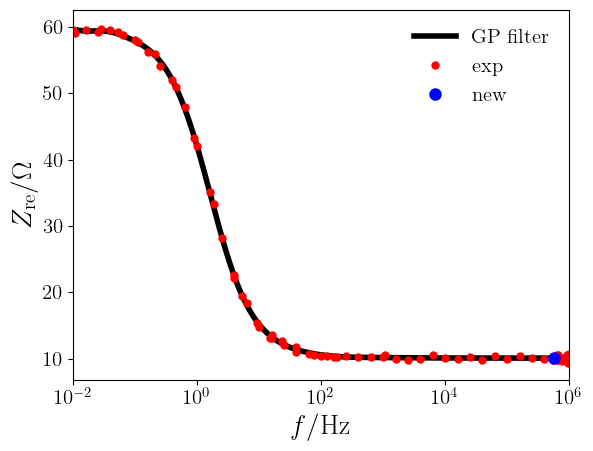

iter =  86 / 100 ; freq_new = 6.5156E+05


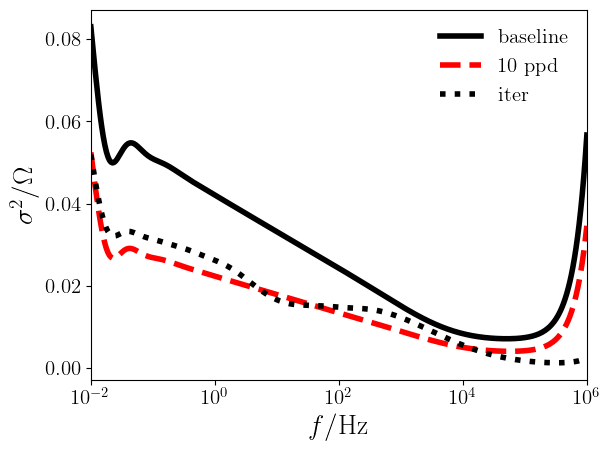

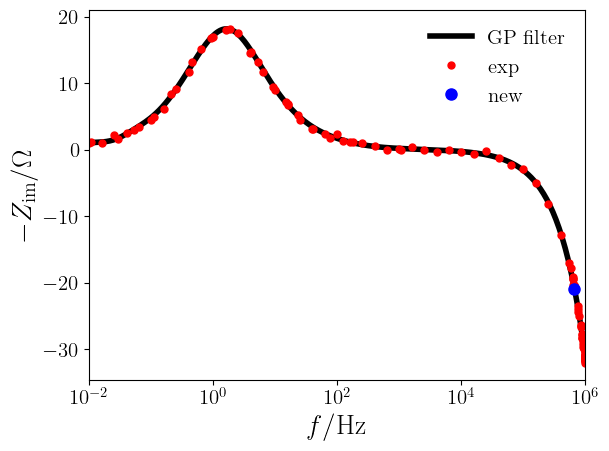

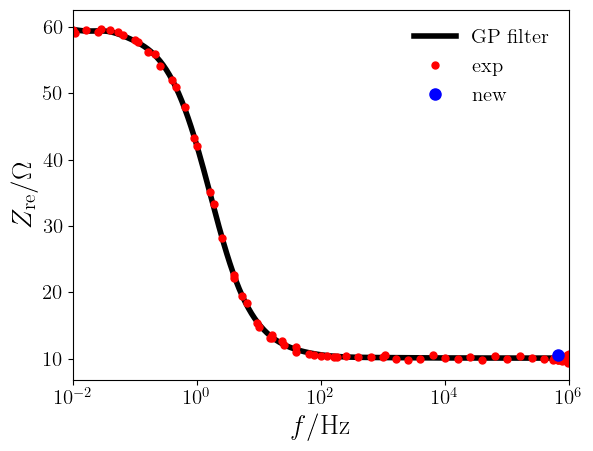

iter =  87 / 100 ; freq_new = 6.8787E+05


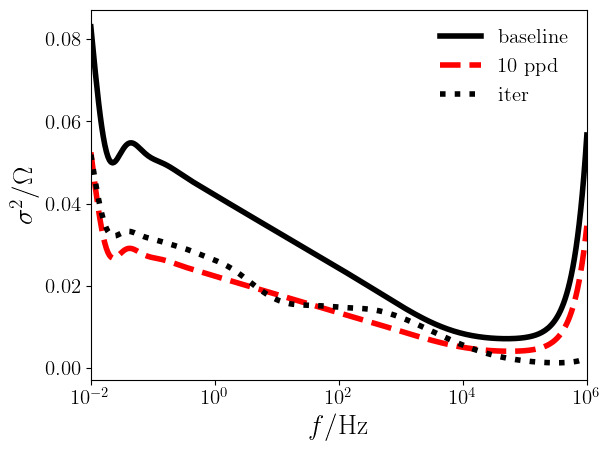

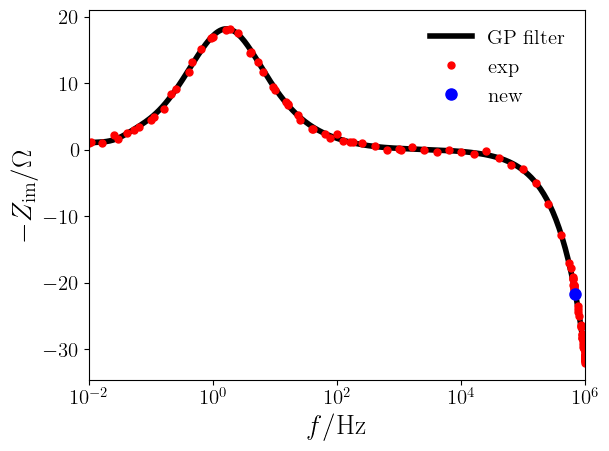

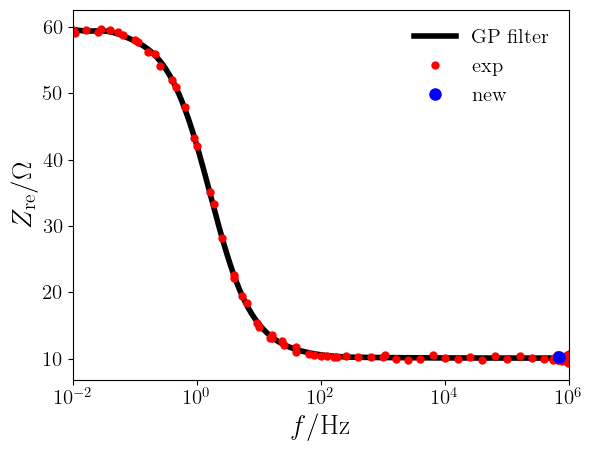

iter =  88 / 100 ; freq_new = 6.4416E+05


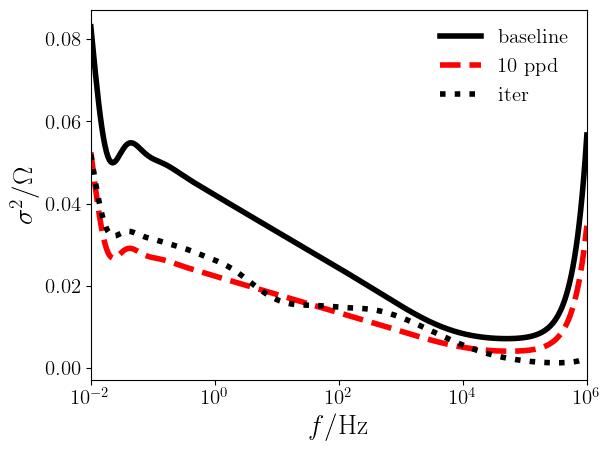

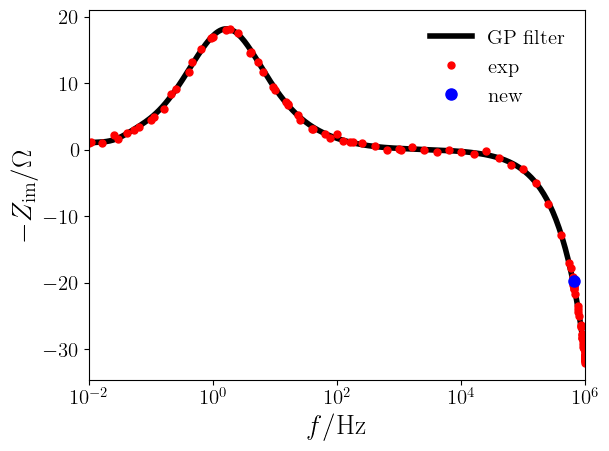

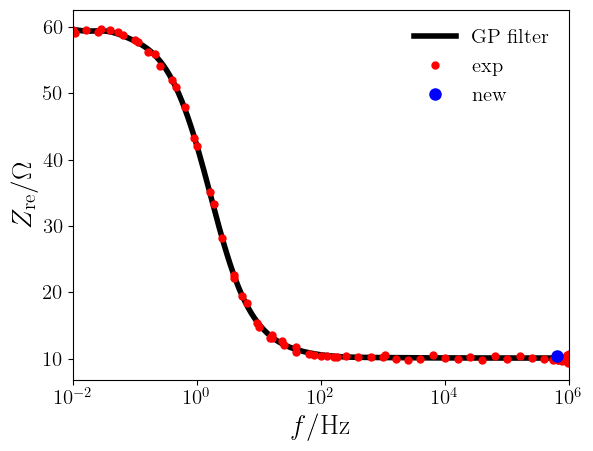

iter =  89 / 100 ; freq_new = 6.5443E+05


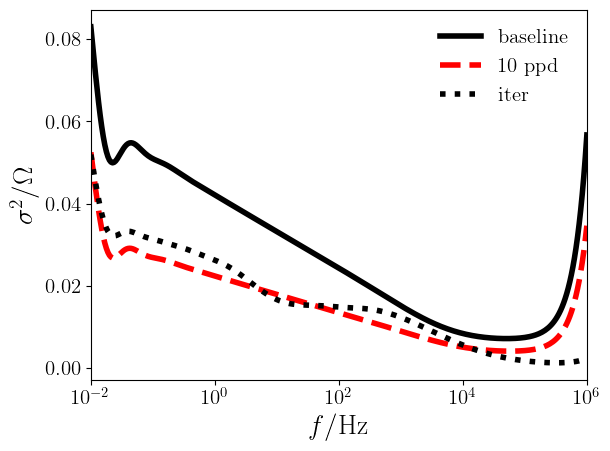

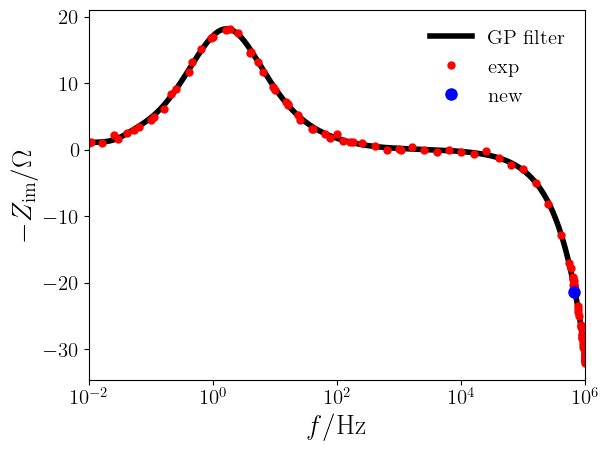

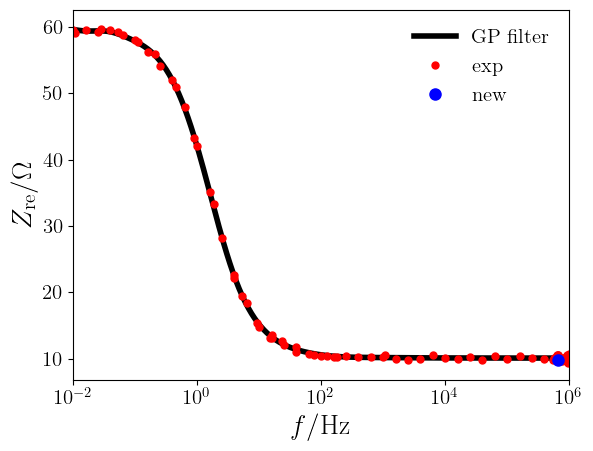

iter =  90 / 100 ; freq_new = 6.5156E+05


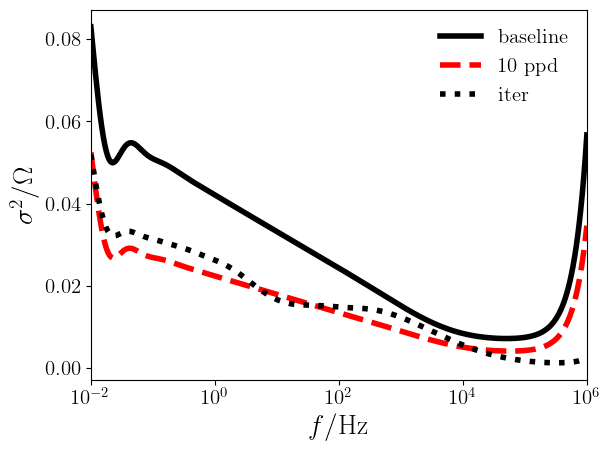

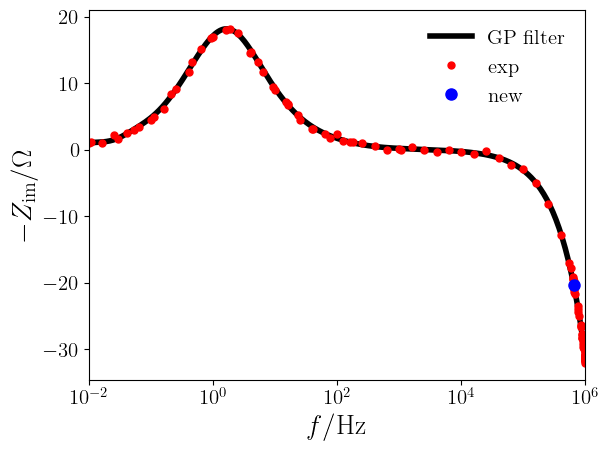

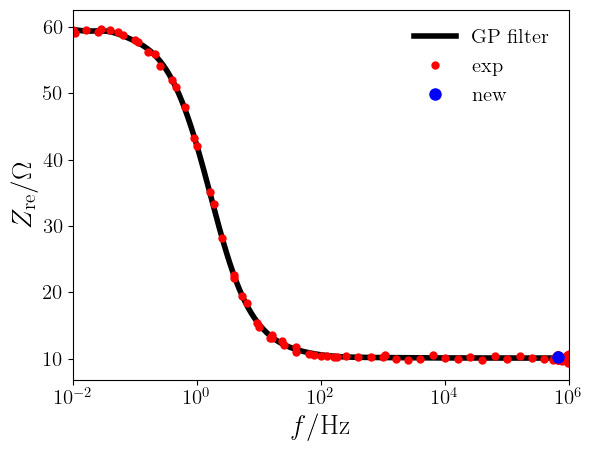

iter =  91 / 100 ; freq_new = 7.6739E+05


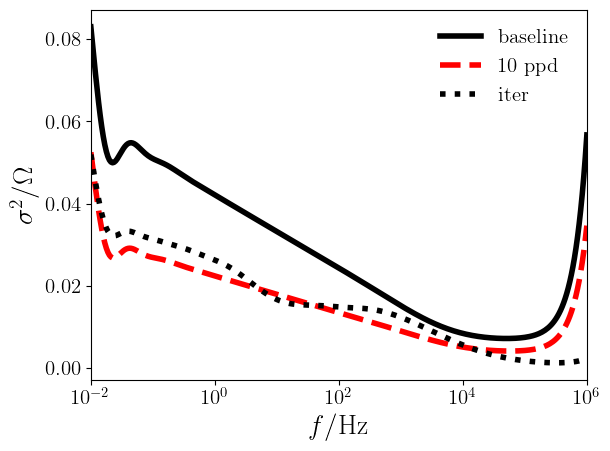

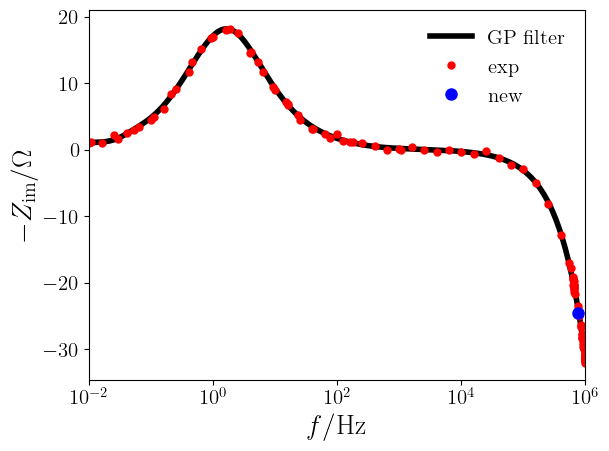

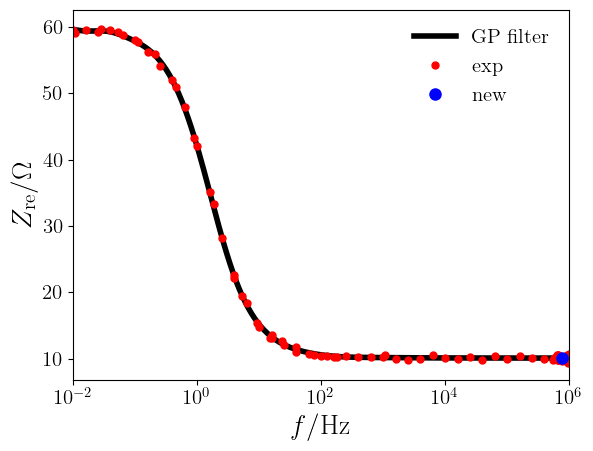

iter =  92 / 100 ; freq_new = 6.2822E+05


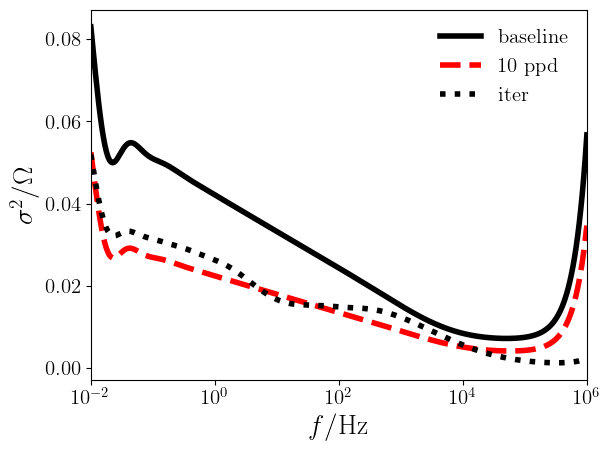

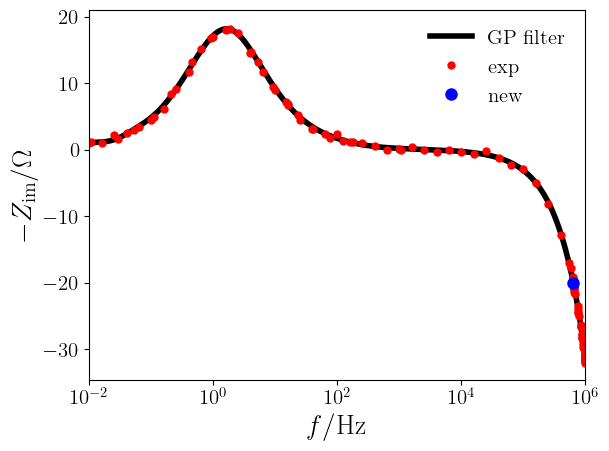

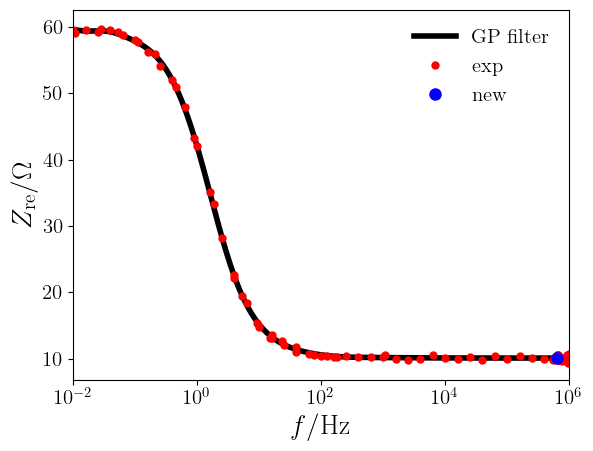

iter =  93 / 100 ; freq_new = 5.2221E+05


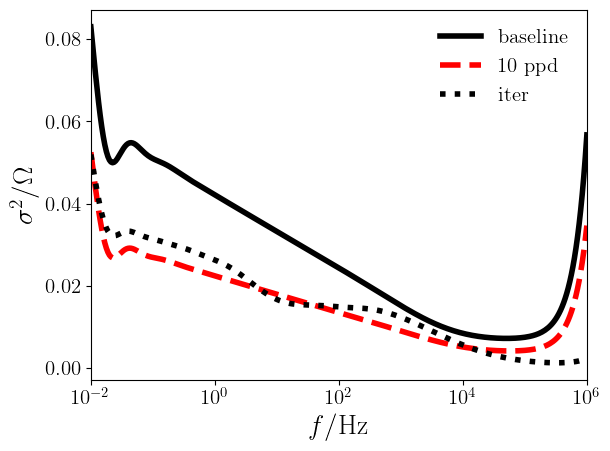

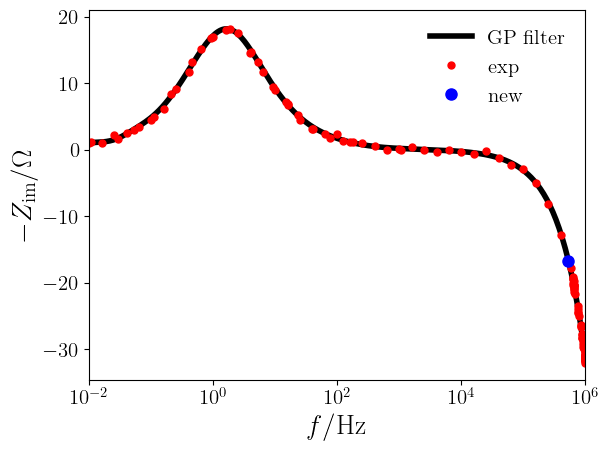

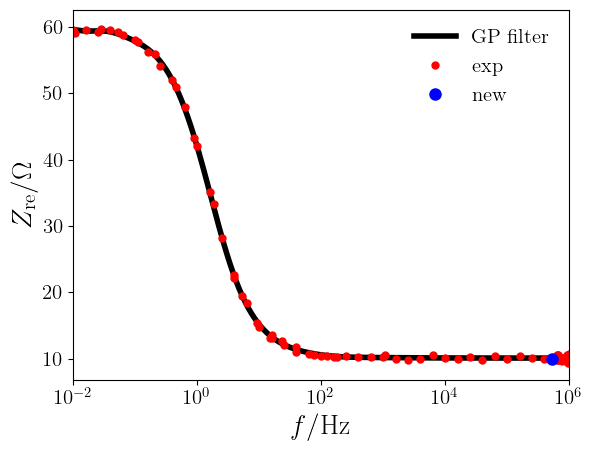

iter =  94 / 100 ; freq_new = 7.6739E+05


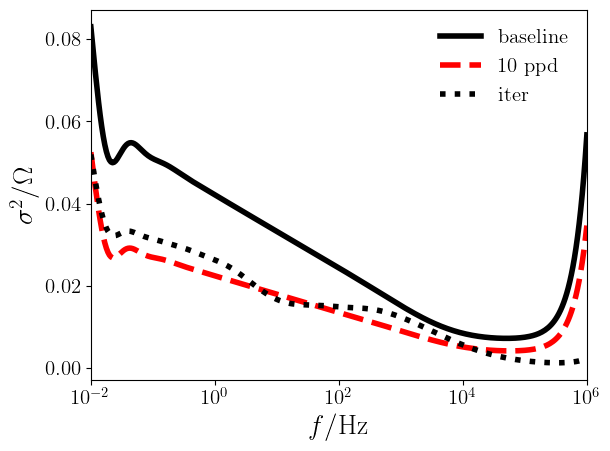

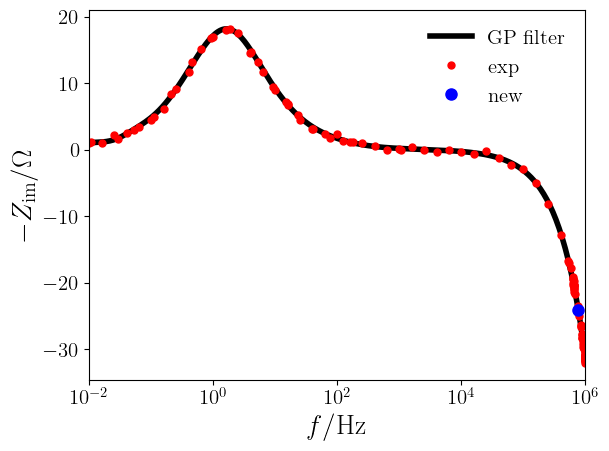

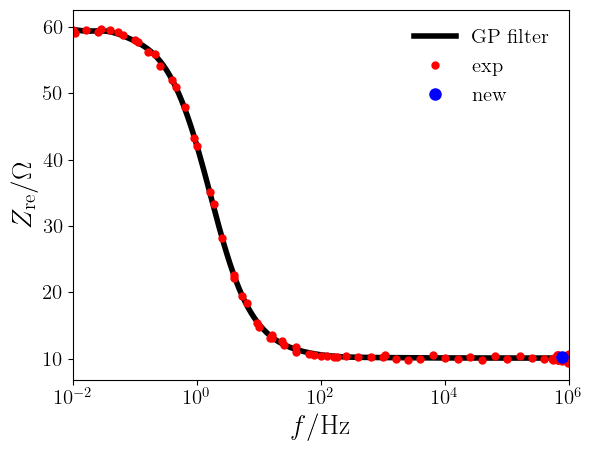

iter =  95 / 100 ; freq_new = 9.0382E+05


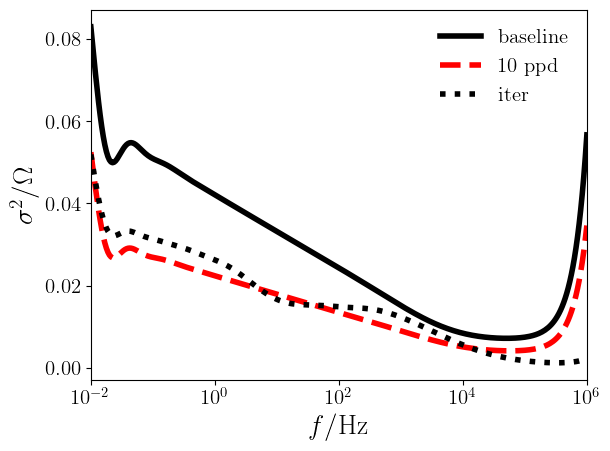

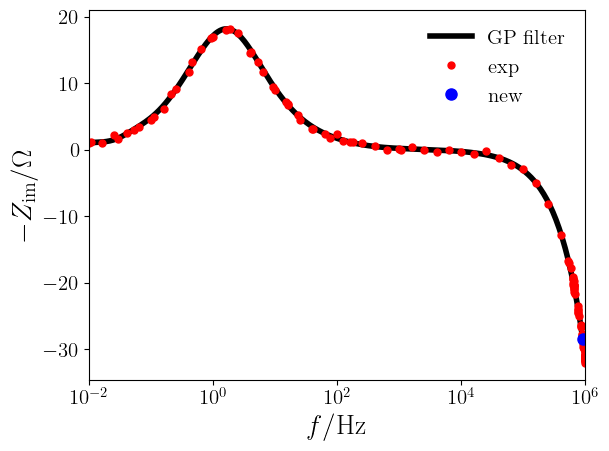

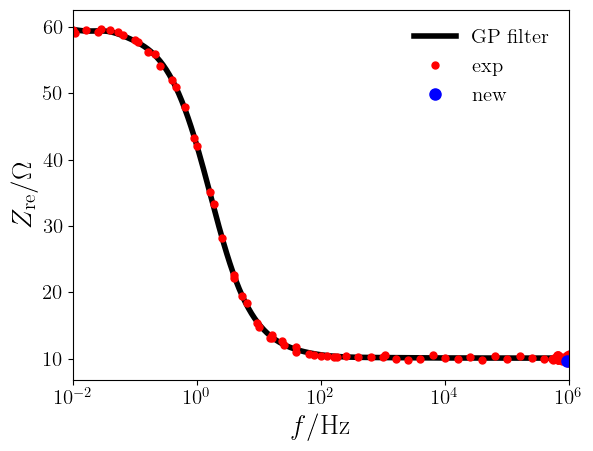

iter =  96 / 100 ; freq_new = 8.6769E+05


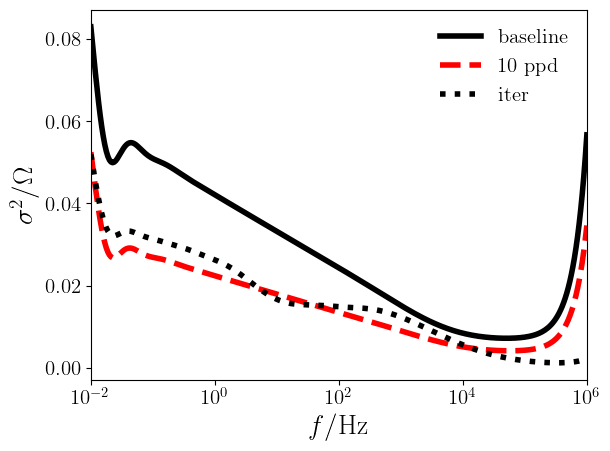

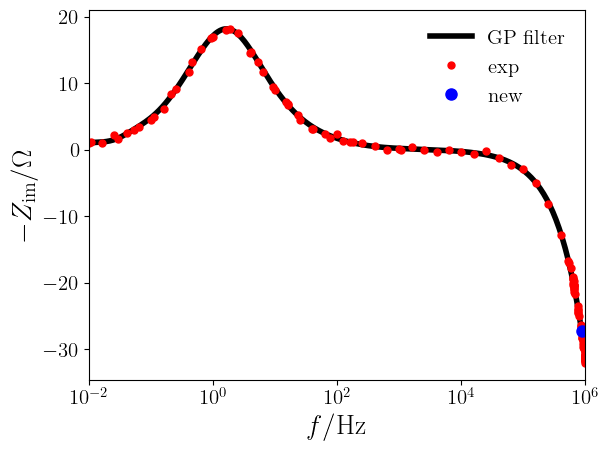

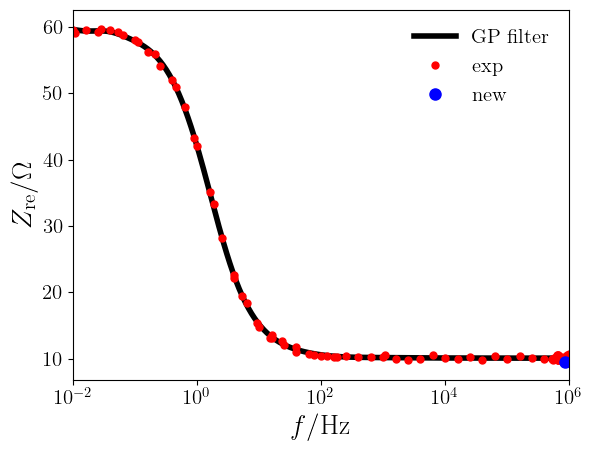

iter =  97 / 100 ; freq_new = 6.7098E+05


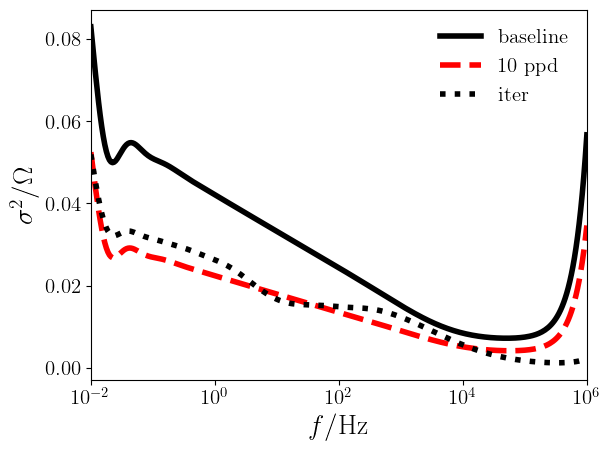

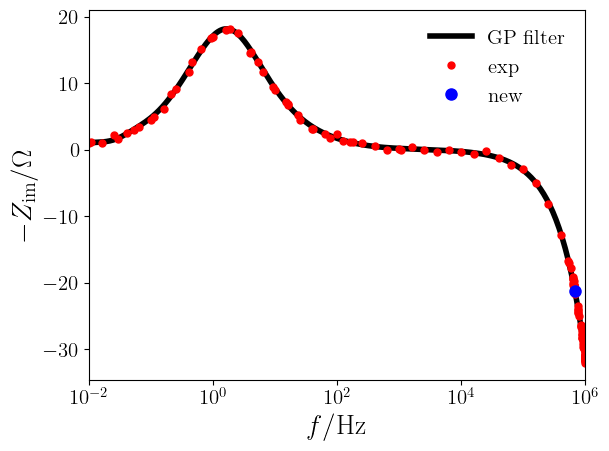

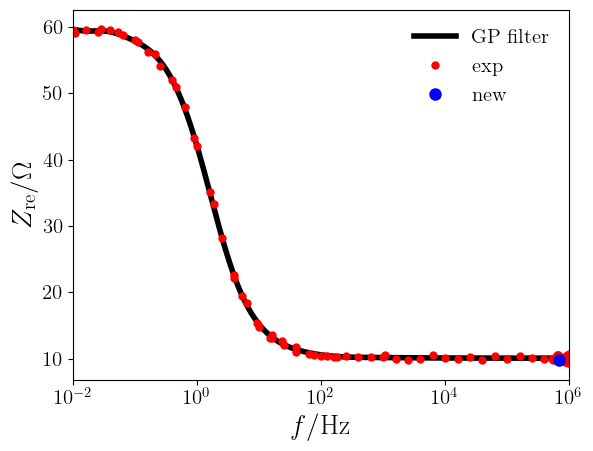

iter =  98 / 100 ; freq_new = 8.0505E+05


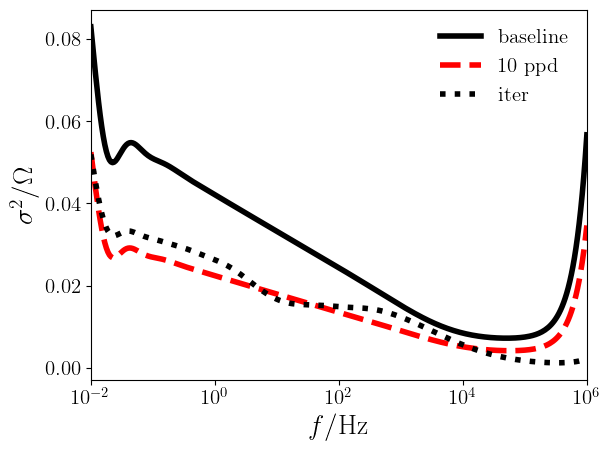

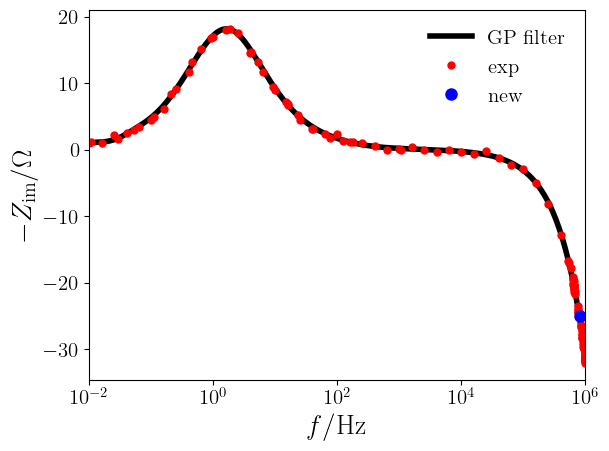

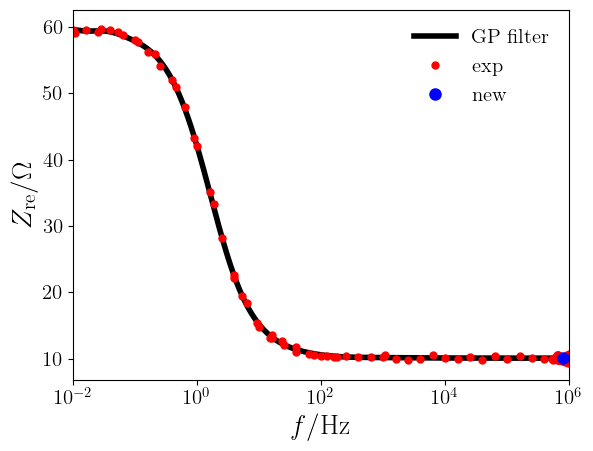

iter =  99 / 100 ; freq_new = 7.4561E+05


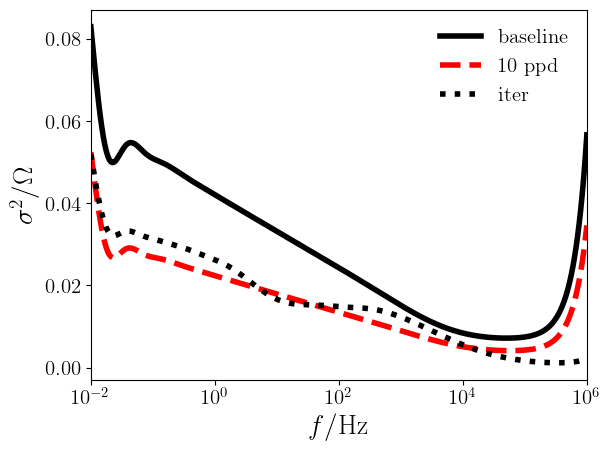

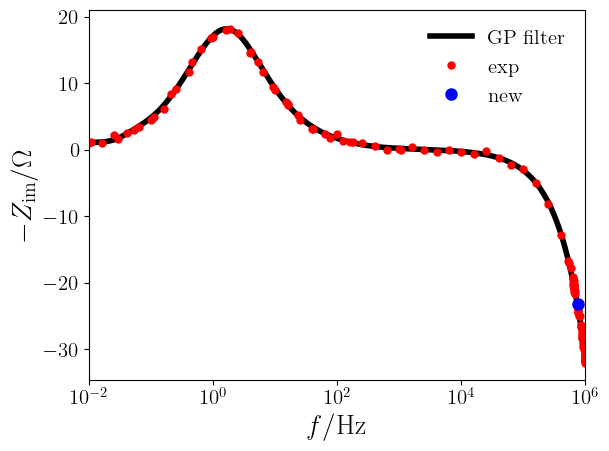

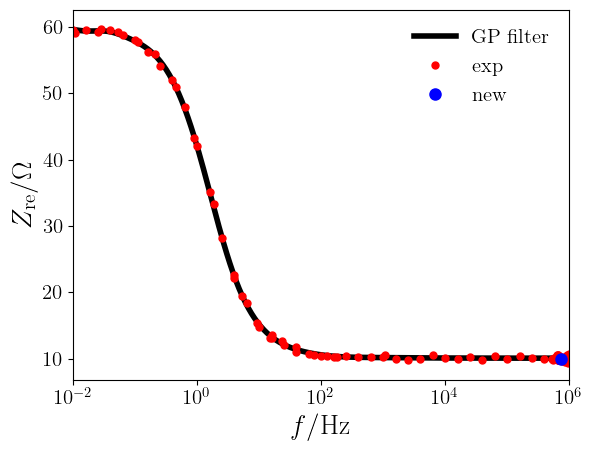

iter =  100 / 100 ; freq_new = 5.8953E+05


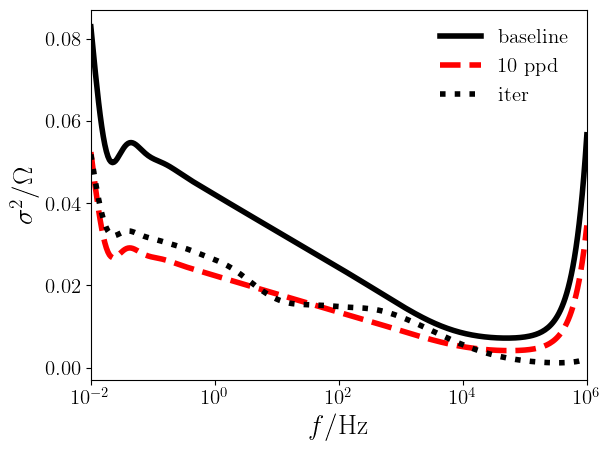

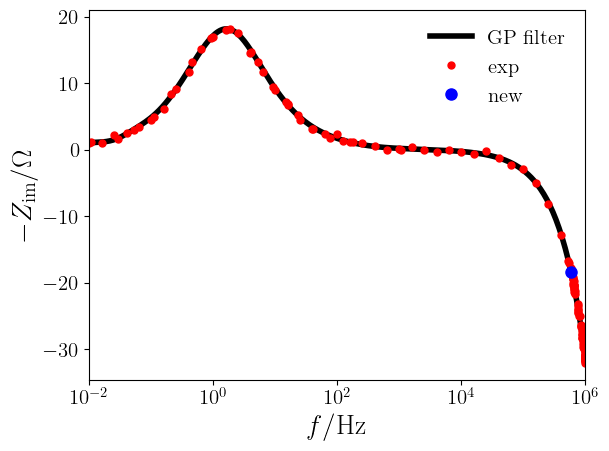

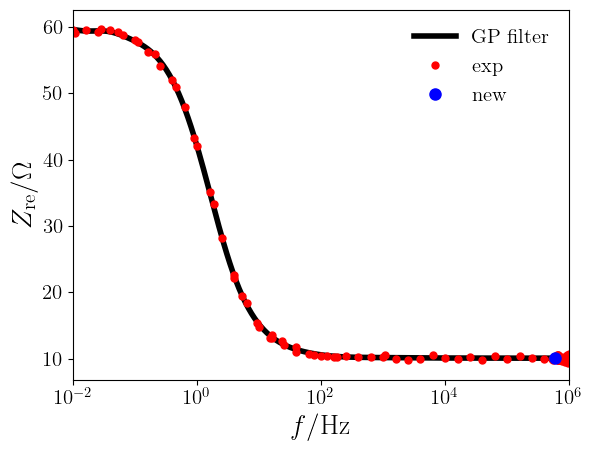

In [49]:
for iter in range(iter_max):

    excess_T = 0.90*T_10_ppd - T_N - (iter_max-iter)*1E-6

    if excess_T>0:

        freq_lb = max(1E-2, 1.0/excess_T )
        
        if freq_lb>=1E6:
            freq_lb = 5E5
            
    else:
        freq_lb = 5E5
        
    # find optimal frequency
    minimum = minimize_scalar(gpf.compute_ALC, bounds=(log10(freq_lb), 6), \
                                       method='bounded', args = (theta_N, ker_opts_N, freq_vec_N, log10_freq_vec_int))

    freq_new = 10**minimum.x
    print('iter = ', iter+1, '/', iter_max, '; freq_new = %.4E'%freq_new)

    # sample the synthetic experiment
    Z_exact_new = R_inf +  1j*(2*pi*freq_new)*L_0 + 1./(1./R_ct+T*(1j*2.*pi*freq_new)**phi)
    Z_exp_new = Z_exact_new + (sigma_n_exp)*(np.random.normal(0, 1)+1j*np.random.normal(0, 1))

    # update the data
    freq_vec_Np1, Z_exp_Np1, Z_exp_all_Np1 = gpf.update_exp(freq_new, Z_exp_new, freq_vec_N, Z_exp_N)

    # optimize theta again (every 30 iterations)
    if iter%30==0 and iter<41:
        theta_Np1, ker_opts_Np1 = gpf.compute_opt_theta(theta_N, ker_opts_N, freq_vec_Np1, Z_exp_all_Np1, type_data = 'all')
    
    # compute new inverse
    inv_K_full_Np1 = gpf.compute_K_inv(theta_Np1, ker_opts_Np1, freq_vec_Np1)

    # compute regression
    mu_re_virt_vec_Np1, mu_im_virt_vec_Np1, sigma_re_virt_vec_Np1, sigma_im_virt_vec_Np1 = \
        gpf.compute_mu_sigma(theta_Np1, ker_opts_Np1, inv_K_full_Np1, freq_virt_vec, freq_vec_Np1, Z_exp_all_Np1)

    plt.semilogx(freq_virt_vec, sigma_re_virt_vec_0**2 + sigma_im_virt_vec_0**2, linewidth=4, color='black', linestyle = '-', label = 'baseline')
    plt.semilogx(freq_virt_vec, sigma_re_virt_vec_10ppd**2 + sigma_im_virt_vec_10ppd**2, linewidth=4, color='red', linestyle = '--', label = '10 ppd')
    plt.semilogx(freq_virt_vec, sigma_re_virt_vec_Np1**2 + sigma_im_virt_vec_Np1**2, linewidth=4, color='black', linestyle = ':', label = 'iter')

    plt.xlim(1E-2, 1E6)
    #plt.ylim(0, 1.0)
    plt.xscale('log')
    plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
    plt.ylabel(r'$\sigma^2/\Omega$', fontsize=20)
    plt.legend(frameon=False, fontsize = 15)

    plt.show()

    plt.fill_between(freq_virt_vec, -mu_im_virt_vec_Np1-3*sigma_im_virt_vec_Np1, -mu_im_virt_vec_Np1+3*sigma_im_virt_vec_Np1,  facecolor='lightgrey')
    plt.semilogx(freq_virt_vec, -mu_im_virt_vec_Np1, linewidth=4, color='black', label='GP filter')
    plt.semilogx(freq_vec_Np1,  -Z_exp_Np1.imag, 'o', markersize=5, color='red', label='exp')
    plt.semilogx(freq_new,  -Z_exp_new.imag, 'o', markersize=8, color='blue', label='new')
    plt.xlim(1E-2, 1E6)
    plt.xscale('log')
    plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
    plt.ylabel(r'$-Z_{\rm im}/\Omega$', fontsize=20)
    plt.legend(frameon=False, fontsize = 15)
    plt.show()

    plt.fill_between(freq_virt_vec, mu_re_virt_vec_Np1-3*sigma_re_virt_vec_Np1, mu_re_virt_vec_Np1+3*sigma_re_virt_vec_Np1,  facecolor='lightgrey')
    plt.semilogx(freq_virt_vec, mu_re_virt_vec_Np1, linewidth=4, color='black', label='GP filter')

    plt.semilogx(freq_vec_Np1, Z_exp_Np1.real,  'o', markersize=5, color='red', label='exp')
    plt.semilogx(freq_new, Z_exp_new.real, 'o', markersize=8, color='blue', label='new')
    plt.xlim(1E-2, 1E6)
    plt.xscale('log')
    plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
    plt.ylabel(r'$Z_{\rm re}/\Omega$', fontsize=20)
    plt.legend(frameon=False, fontsize = 15)
    plt.show()

    freq_new_vec[iter] = freq_new
    Z_exp_new_vec[iter] = Z_exp_new
    theta_new_vec[iter, :] = theta_Np1

    mu_re_virt_vec_new_vec[iter, :] = mu_re_virt_vec_Np1
    mu_im_virt_vec_new_vec[iter, :] = mu_im_virt_vec_Np1
    sigma_re_virt_vec_new_vec[iter, :] = sigma_re_virt_vec_Np1
    sigma_im_virt_vec_new_vec[iter, :] = sigma_im_virt_vec_Np1

    theta_N = np.copy(theta_Np1)
    ker_opts_N = ker_opts_Np1.copy()
    freq_vec_N = np.copy(freq_vec_Np1)
    Z_exp_N = np.copy(Z_exp_Np1)
    inv_K_full_N = np.copy(inv_K_full_Np1)
    
    T_N = np.sum(1/freq_vec_N)


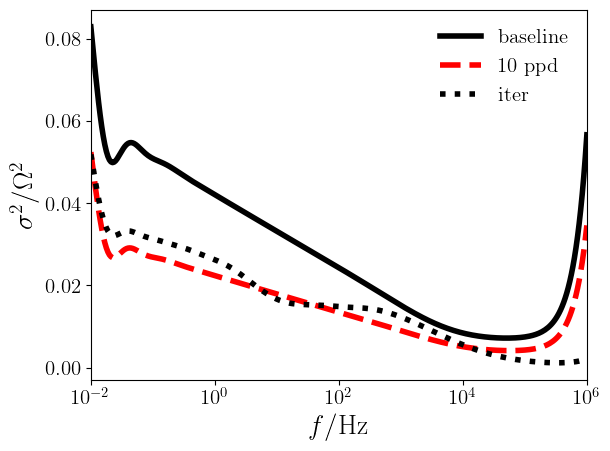

In [50]:
plt.semilogx(freq_virt_vec, sigma_im_virt_vec_0**2 + sigma_re_virt_vec_0**2, linewidth=4, color='black', linestyle = '-', label = 'baseline')
plt.semilogx(freq_virt_vec, sigma_im_virt_vec_10ppd**2 + sigma_re_virt_vec_10ppd**2, linewidth=4, color='red', linestyle = '--', label = '10 ppd')
plt.semilogx(freq_virt_vec, sigma_im_virt_vec_Np1**2 + sigma_re_virt_vec_Np1**2, linewidth=4, color='black', linestyle = ':', label = 'iter')

plt.xlim(1E-2, 1E6)
#plt.ylim(0, 1.0)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'$\sigma^2/\Omega^2$', fontsize=20)
plt.legend(frameon=False, fontsize = 15)

Text(0, 0.5, '$\\Delta\\sigma^2/\\Omega^2$')

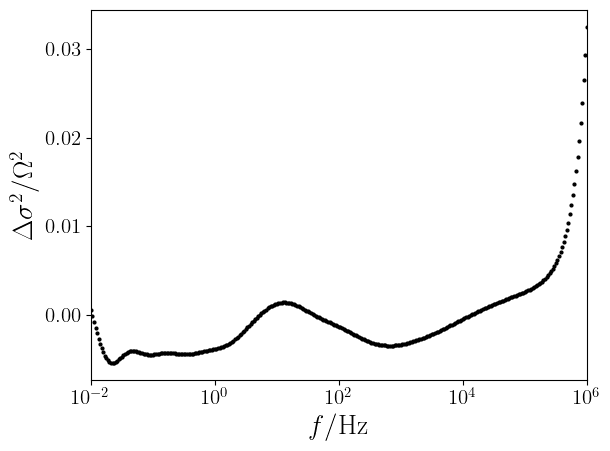

In [51]:
plt.semilogx(freq_virt_vec, sigma_im_virt_vec_10ppd**2 + sigma_re_virt_vec_10ppd**2 - (sigma_im_virt_vec_Np1**2 + sigma_re_virt_vec_Np1**2), 'o', markersize=2, color='black')

plt.xlim(1E-2, 1E6)
#plt.ylim(0, 1.0)
plt.xscale('log')
plt.xlabel(r'$f/{\rm Hz}$', fontsize=20)
plt.ylabel(r'$\Delta\sigma^2/\Omega^2$', fontsize=20)

In [52]:
I_sigma_0 = np.trapz(sigma_im_virt_vec_0**2 + sigma_re_virt_vec_0**2, np.log10(freq_virt_vec))
I_sigma_10ppd =np.trapz(sigma_im_virt_vec_10ppd**2 + sigma_re_virt_vec_10ppd**2, np.log10(freq_virt_vec))
I_sigma_Np1 =np.trapz(sigma_im_virt_vec_Np1**2 + sigma_re_virt_vec_Np1**2, np.log10(freq_virt_vec))
print('σ2_0 = %.3F Ω2, σ2_10_ppd = %.3F Ω2, σ2_ALM_N = %.3F Ω2'%(I_sigma_0, I_sigma_10ppd, I_sigma_Np1))

σ2_0 = 0.225 Ω2, σ2_10_ppd = 0.124 Ω2, σ2_ALM_N = 0.129 Ω2


In [53]:
Z_exact_virt_vec = R_inf + 1j*(2*pi*freq_virt_vec)*L_0 + 1./(1./R_ct+T*(1j*2.*pi*freq_virt_vec)**phi)
mu_vec_10ppd = mu_re_virt_vec_10ppd + 1j*mu_im_virt_vec_10ppd
mu_vec_N = mu_re_virt_vec_Np1 + 1j*mu_im_virt_vec_Np1

epsilon_10ppd = 1.0/N_virt_freqs*np.linalg.norm(Z_exact_virt_vec-mu_vec_10ppd)
epsilon_N = 1.0/N_virt_freqs*np.linalg.norm(Z_exact_virt_vec-mu_vec_N)

In [54]:
print('rmse(Z_exact, Z_mu_10ppd) = %.5F Ω, rmse(Z_exact, Z_exact-Z_mu_N) = %.5F Ω'%(epsilon_10ppd, epsilon_N))

rmse(Z_exact, Z_mu_10ppd) = 0.00510 Ω, rmse(Z_exact, Z_exact-Z_mu_N) = 0.00472 Ω


In [55]:
T_0 = np.sum(1/freq_vec)/60
T_10ppd = np.sum(1/freq_vec_10ppd)/60
T_N = np.sum(1/freq_vec_N)/60

In [56]:
print('T_0 = %.2F min, T_10_ppd = %.2F min, T_N = %.2F min'%(T_0, T_10ppd, T_N))

T_0 = 4.52 min, T_10_ppd = 8.10 min, T_N = 7.29 min
